# **Machine Learning HW1**

**Dataset:** [SUPPORT2 – UCI Machine Learning Repository](https://archive.ics.uci.edu/dataset/880/support2)  

---

## **Group Members**
1. Chantouch Orungrote (ID: 66340500011)  
2. Sasish Kaewsing (ID: 66340500076)  

## **Import data and Library**

In [1155]:
%pip install colabcode
%pip install ucimlrepo

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [1156]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt # type: ignore
import seaborn as sns
import warnings

from math import ceil
from scipy import stats
from ucimlrepo import fetch_ucirepo
from scipy.stats import gaussian_kde, zscore, mode, f_oneway
from typing import Dict, List, Set, Tuple
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# **1. Reading the Data in Python and Data Description**

## **Data Description**

1. **age** – Age of the patient (years)  
2. **death** – Death at any time up to National Death Index (NDI) data on 12/31/1994 (some discharged patients not followed up)  
3. **sex** – Gender of the patient (`male`, `female`)  
4. **hospdead** – Death in hospital (`yes` / `no`)  
5. **slos** – Days from study entry to discharge  
6. **d.time** – Days of follow-up  
7. **dzgroup** – Sub-categories of disease: ARF/MOSF w/Sepsis, CHF, COPD, Cirrhosis, Colon Cancer, Coma, Lung Cancer, MOSF w/Malig  
8. **dzclass** – Patient’s disease category: ARF/MOSF, COPD/CHF/Cirrhosis, Cancer, Coma  
9. **num.co** – Number of comorbid diseases (higher = worse condition, lower survival)  
10. **edu** – Years of education (categorical)  
11. **income** – Income level: `<11k`, `11–25k`, `25–50k`, `>50k` (USD)  
12. **scoma** – SUPPORT day-3 coma score (Glasgow scale, model-predicted)  
13. **charges** – Hospital charges for each patient  
14. **totcst** – Total ratio of costs to charges (RCC), derived from charges  
15. **totmcst** – Total micro-cost (labs, drugs, etc.)  
16. **avtisst** – Average TISS score, days 3–25 (ICU/IMCU cost index)  
17. **race** – Race of the patient: asian, black, hispanic, missing, other, white  
18. **sps** – SUPPORT physiology score on day 3 (model-predicted)  
19. **aps** – APACHE III severity-of-illness score (excl. coma, BUN, urine output)  
20. **surv2m** – SUPPORT model 2-month survival estimate at day 3 (predicted)  
21. **surv6m** – SUPPORT model 6-month survival estimate at day 3 (predicted)  
22. **hday** – Hospital day at which patient entered study  
23. **diabetes** – Diabetes as comorbidity (`Y`/`N`)  
24. **dementia** – Dementia as comorbidity (`Y`/`N`)  
25. **ca** – Cancer status (`yes`/`metastatic`/`no`)  
26. **prg2m** – Physician’s 2-month survival estimate  
27. **prg6m** – Physician’s 6-month survival estimate  
28. **dnr** – Do-Not-Resuscitate status (`after sadm`, `before sadm`, `missing`, `no DNR`)  
29. **dnrday** – Day of DNR order (<0 if before study)  
30. **meanbp** – Mean arterial blood pressure (day 3)  
31. **wblc** – White blood cell count (thousands/µL, day 3)  
32. **hrt** – Heart rate (day 3)  
33. **resp** – Respiratory rate (day 3)  
34. **temp** – Temperature in °C (day 3)  
35. **pafi** – PaO₂/FiO₂ ratio (day 3, indicator of hypoxemia)  
36. **alb** – Serum albumin (day 3)  
37. **bili** – Serum bilirubin (day 3)  
38. **crea** – Serum creatinine (day 3)  
39. **sod** – Serum sodium (day 3)  
40. **ph** – Arterial blood pH (day 3)  
41. **glucose** – Serum glucose (day 3)  
42. **bun** – Blood urea nitrogen (day 3)  
43. **urine** – Urine output (day 3)  
44. **adlp** – Index of Activities of Daily Living (self-reported, day 3)  
45. **adls** – Index of ADL (surrogate-reported, day 3)  
46. **sfdm2** – Functional disability (1–5 scale, correlated with ADLs/ADLp)  
47. **adlsc** – Imputed ADL, calibrated to surrogate reports  


In [1157]:
# Supressing the warning messages
warnings.filterwarnings('ignore')

**Import The Data from SUPPORT2 Dataset**

In [1158]:
# fetch dataset
support2 = fetch_ucirepo(id=880)  # SUPPORT2 Dataset
df = pd.concat([support2.data.original], axis=1)

**Check Duplicate Values**

In [1159]:
print('Shape before deleting duplicate values:', df.shape)

# Removing duplicate rows if any
df=df.drop_duplicates()
print('Shape After deleting duplicate values:', df.shape)

Shape before deleting duplicate values: (9105, 48)
Shape After deleting duplicate values: (9105, 48)


No duplicate values in this data frame

# **2. Defining the Problem Statement**

We aim to build a machine learning model that can predict the **charges** (price) of patients.

- **Target Variable:** `charges`  
- **Predictors:** `age`, `slos`, `sex`, `d.time`, `meanbp`, `adlp`, etc.  
- **Samples:** Medical records of 9,105 hospitalized patients from five U.S. states, spanning 1989–1991 and 1992–1994.  

---

## **Determining the type of Machine Learning**

Since the target variable (`charges`) is continuous, we will use a **Supervised Machine Learning Regression Model**.

---

## **Assumptions**

1. **Linearity:**  
   The relationship between independent and dependent variables follows a straight line - changes in one variable create proportional changes in the other.

2. **Multicollinearity:**  
   Independent variables shouldn't be highly correlated with each other. Each variable should provide unique information to avoid unstable coefficients and overfitting.

3. **Homoscedasticity:**  
   Residuals (prediction errors) should have consistent variability across all levels of independent variables - the spread of errors stays roughly the same throughout.

4. **Normality of Residuals:**  
   The residuals should follow a normal (bell-shaped) distribution, with most errors close to zero and fewer errors as you move away from zero in either direction.

Meeting these assumptions ensures reliable results and trustworthy predictions for confident decision-making. Violating them leads to biased estimates and unreliable conclusions.


# **3. Looking at the distribution of Target**

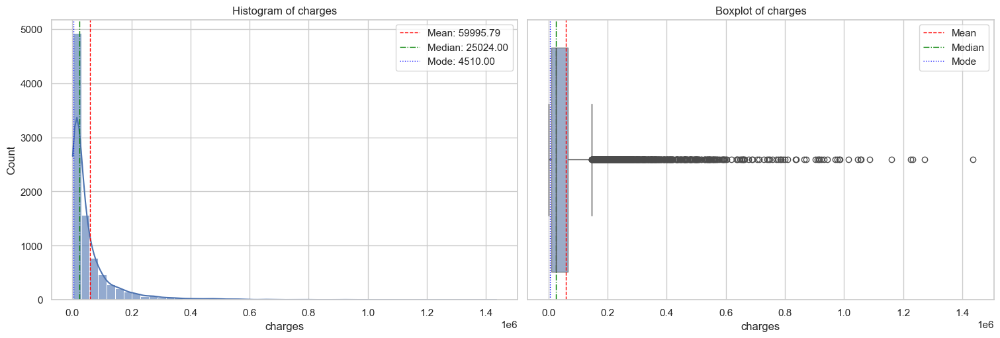

In [1160]:
# calculate stats
mean_value = df["charges"].mean()
median_value = df["charges"].median()
mode_value = df["charges"].mode()[0]

# figure
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)

# histogram
sns.histplot(df["charges"].dropna(), kde=True, bins=50, ax=axes[0], alpha=0.6)
axes[0].set_title("Histogram of charges")

# add mean, median, mode
axes[0].axvline(mean_value, color="red", linestyle="--", linewidth=1, label=f"Mean: {mean_value:.2f}")
axes[0].axvline(median_value, color="green", linestyle="-.", linewidth=1, label=f"Median: {median_value:.2f}")
axes[0].axvline(mode_value, color="blue", linestyle=":", linewidth=1, label=f"Mode: {mode_value:.2f}")
axes[0].legend()


# boxplot
box = sns.boxplot(x=df["charges"].dropna(), ax=axes[1])
# set alpha on the box patch
for patch in box.patches:
    patch.set_alpha(0.6)
# set alpha on fliers (outliers)
for flier in box.collections:
    flier.set_alpha(0.6)

axes[1].set_title("Boxplot of charges")
# add same vertical lines
axes[1].axvline(mean_value, color="red", linestyle="--", linewidth=1, label="Mean")
axes[1].axvline(median_value, color="green", linestyle="-.", linewidth=1, label="Median")
axes[1].axvline(mode_value, color="blue", linestyle=":", linewidth=1, label="Mode")
axes[1].legend()

plt.show()

From the histogram analysis:  

- **Mean :** 59,995.79  
- **Median :** 25,024.00  
- **Mode :** 4,510.00  

The distribution is right-skewed. **These outlier do not represent errors:** high charges correspond to critically ill patients.

# **4. Basic data exploration**

In this step, we classify the variables as categorical or continuous and record the count of each type.

In [1161]:
def classify_features(df):
    feature_types = {}
    categorical_features, numerical_features = [], []

    for column in df.columns:
        unique_values = df[column].nunique(dropna=True)

        # Using unuique() to classified the categorical and continuous
        if unique_values < 20:
            feature_types[column] = 'Categorical'
            categorical_features.append(column)
        else:
            feature_types[column] = 'Numerical'
            numerical_features.append(column)

    counts = {
        "Categorical": len(categorical_features),
        "Numerical": len(numerical_features)
    }

    return feature_types, categorical_features, numerical_features, counts

# Usage
feature_types, categorical_features, numerical_features, counts = classify_features(df)

print(f"Categorical Features ({len(categorical_features)}): {categorical_features}")
print(f"Numerical Features ({len(numerical_features)}): {numerical_features}")
print(f"Counts: {counts}")

Categorical Features (16): ['death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'income', 'scoma', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'adlp', 'adls', 'sfdm2']
Numerical Features (32): ['id', 'age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc']
Counts: {'Categorical': 16, 'Numerical': 32}


In [1162]:
# Basic info
info_df = pd.DataFrame({
    "dtype": df.dtypes,
    "non_null": df.notnull().sum(),
    "null": df.isnull().sum(),
    "unique": df.nunique()
})
info_df.index.name = "column"
info_df.reset_index(inplace=True)

# Add feature type column from classification
info_df["feature_type"] = info_df["column"].map(feature_types)
info_df

,column,dtype,non_null,null,unique,feature_type
0,id,int64,9105,0,9105,Numerical
1,age,float64,9105,0,7323,Numerical
2,death,int64,9105,0,2,Categorical
3,sex,object,9105,0,2,Categorical
4,hospdead,int64,9105,0,2,Categorical
5,slos,int64,9105,0,167,Numerical
6,d.time,int64,9105,0,1724,Numerical
7,dzgroup,object,9105,0,8,Categorical
8,dzclass,object,9105,0,4,Categorical
9,num.co,int64,9105,0,10,Categorical


In [1163]:
df.head()

column,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
0,1,62.84998,0,male,0,5,2029,Lung Cancer,Cancer,0,...,1.199951,141.0,7.459961,NaN,NaN,NaN,7.0,7.0,NaN,7.0
1,2,60.33899,1,female,1,4,4,Cirrhosis,COPD/CHF/Cirrhosis,2,...,5.500000,132.0,7.250000,NaN,NaN,NaN,NaN,1.0,<2 mo. follow-up,1.0
2,3,52.74698,1,female,0,17,47,Cirrhosis,COPD/CHF/Cirrhosis,2,...,2.000000,134.0,7.459961,NaN,NaN,NaN,1.0,0.0,<2 mo. follow-up,0.0
3,4,42.38498,1,female,0,3,133,Lung Cancer,Cancer,2,...,0.799927,139.0,NaN,NaN,NaN,NaN,0.0,0.0,no(M2 and SIP pres),0.0
4,5,79.88495,0,female,0,16,2029,ARF/MOSF w/Sepsis,ARF/MOSF,1,...,0.799927,143.0,7.509766,NaN,NaN,NaN,NaN,2.0,no(M2 and SIP pres),2.0


In [1164]:
df.describe(include='all')

column,id,age,death,sex,hospdead,slos,d.time,dzgroup,dzclass,num.co,...,crea,sod,ph,glucose,bun,urine,adlp,adls,sfdm2,adlsc
count,9105.000000,9105.000000,9105.000000,9105,9105.000000,9105.000000,9105.000000,9105,9105,9105.000000,...,9038.000000,9104.000000,6821.000000,4605.000000,4753.000000,4243.000000,3464.000000,6238.000000,7705,9105.000000
unique,NaN,NaN,NaN,2,NaN,NaN,NaN,8,4,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,NaN
top,NaN,NaN,NaN,male,NaN,NaN,NaN,ARF/MOSF w/Sepsis,ARF/MOSF,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<2 mo. follow-up,NaN
freq,NaN,NaN,NaN,5125,NaN,NaN,NaN,3515,4227,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3123,NaN
mean,4553.000000,62.650823,0.681054,NaN,0.259198,17.863042,478.449863,NaN,NaN,1.868644,...,1.770961,137.568541,7.415364,159.873398,32.349463,2191.546047,1.157910,1.637384,NaN,1.888272
std,2628.531434,15.593710,0.466094,NaN,0.438219,22.006440,560.383272,NaN,NaN,1.344409,...,1.686041,6.029326,0.080563,88.391541,26.792288,1455.245777,1.739672,2.231358,NaN,2.003763
min,1.000000,18.041990,0.000000,NaN,0.000000,3.000000,3.000000,NaN,NaN,0.000000,...,0.099991,110.000000,6.829102,0.000000,1.000000,0.000000,0.000000,0.000000,NaN,0.000000
25%,2277.000000,52.797000,0.000000,NaN,0.000000,6.000000,26.000000,NaN,NaN,1.000000,...,0.899902,134.000000,7.379883,103.000000,14.000000,1165.500000,0.000000,0.000000,NaN,0.000000
50%,4553.000000,64.856990,1.000000,NaN,0.000000,11.000000,233.000000,NaN,NaN,2.000000,...,1.199951,137.000000,7.419922,135.000000,23.000000,1968.000000,0.000000,1.000000,NaN,1.000000
75%,6829.000000,73.998960,1.000000,NaN,1.000000,20.000000,761.000000,NaN,NaN,3.000000,...,1.899902,141.000000,7.469727,188.000000,42.000000,3000.000000,2.000000,3.000000,NaN,3.000000


## **4.1. Basic Data Exploration Results**

The selected columns in this step are not final; further study will refine the list.  

**Note:** The identifier (`id`) is neither a feature nor a target variable, so it was excluded. Only the remaining variables are analyzed.

---

 **Selected Features**

- **age** – Continuous (numeric). Selected  
- **death** – Categorical (binary). Selected  
- **sex** – Categorical (nominal). Selected  
- **hospdead** – Categorical (binary). Selected  
- **slos** – Continuous (numeric, days). Selected  
- **d.time** – Continuous (numeric, days). Selected  
- **dzgroup** – Categorical (nominal, detailed disease group). Selected  
- **dzclass** – Categorical (nominal, broad disease class). Selected  
- **num.co** – Categorical (integer count). Selected  
- **edu** – Continuous (numeric years). Selected  
- **income** – Categorical (ordinal levels). Selected  
- **scoma** – Categorical (nominal). Selected  
- **totcst** – Continuous (numeric, cost ratio). Selected  
- **totmcst** – Continuous (numeric, micro cost). Selected  
- **avtisst** – Continuous (numeric score). Selected  
- **race** – Categorical (nominal). Selected  
- **sps** – Continuous (numeric score). Selected  
- **aps** – Continuous (numeric score). Selected  
- **surv2m** – Continuous (predicted survival). Selected
- **surv6m** – Continuous (predicted survival). Selected
- **hday** – Continuous (numeric, day count). Selected  
- **diabetes** – Categorical (binary). Selected  
- **dementia** – Categorical (binary). Selected  
- **ca** – Categorical (ordinal: yes, metastatic, no). Selected  
- **prg2m** – Continuous (physician estimate). Selected   
- **prg6m** – Continuous (physician estimate). Selected   
- **dnr** – Categorical (nominal). Selected  
- **dnrday** – Continuous (numeric, relative day). Selected  
- **meanbp** – Continuous (numeric). Selected  
- **wblc** – Continuous (numeric). Selected  
- **hrt** – Continuous (numeric). Selected  
- **resp** – Continuous (numeric). Selected  
- **temp** – Continuous (numeric). Selected  
- **pafi** – Continuous (numeric ratio). Selected  
- **alb** – Continuous (numeric, g/dL). Selected  
- **bili** – Continuous (numeric, mg/dL). Selected  
- **crea** – Continuous (numeric, mg/dL). Selected  
- **sod** – Continuous (numeric, mmol/L). Selected  
- **ph** – Continuous (numeric). Selected  
- **glucose** – Continuous (numeric, mg/dL). Selected  
- **bun** – Continuous (numeric, mg/dL). Selected  
- **urine** – Continuous (numeric, mL). Selected  
- **adlp** – Categorical (score). Selected  
- **adls** – Categorical (score). Selected  
- **sfdm2** – Categorical (ordinal disability scale 1–5). Selected  
- **adlsc** – Continuous (calibrated ADL). Selected  
- **charges** – Continuous (numeric, cost). **Target Variable**  

---

Feature Type Counts**
- Continuous (numeric): **30**  
- Categorical (nominal/ordinal/binary): **16**  

**Total features:** 46  

---
**Target Variable**
- Continuous (numeric): **1**  

---

**Overall Variables**
- **47 variables** in total  

---

**Summary**
No removing useless columns from the data. **All variables are selected and retained** for further analysis.


# **5. Visual Exploratory Data Analysis (EDA) for data distribution and feature selection based on data distribution**

## **5.1. Visualize distribution of all the Categorical Predictor variables in the data using bar charts**

**Categorical Predictors:**

* 'death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'income', 'scoma', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'adlp', 'adls', 'sfdm2'

We use bar charts to see how the data is distributed for these categorical columns.

In [1165]:
def plot_categorical_bars(df, cols, n_cols=3, top=None, normalize=False):
    n = len(cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 5*n_rows), squeeze=False, constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(cols):
        ax = axes[i]
        s = df[col].astype("object").where(df[col].notna(), "Missing")
        counts = s.value_counts(dropna=False)

        if top is not None:
            counts = counts.head(top)
        if normalize:
            counts = counts / counts.sum() * 100

        counts.plot(kind="bar", ax=ax, color="steelblue", edgecolor="black", alpha=0.6)
        ax.set_title(col, fontsize=10)
        ax.tick_params(axis="x", labelrotation=90)
        ax.grid(axis="y", linestyle=":", linewidth=0.5, alpha=0.6)
        ax.set_ylabel("% of rows" if normalize else "Count")

    # hide unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle("Bar charts of categorical features", fontsize=14)
    plt.show()

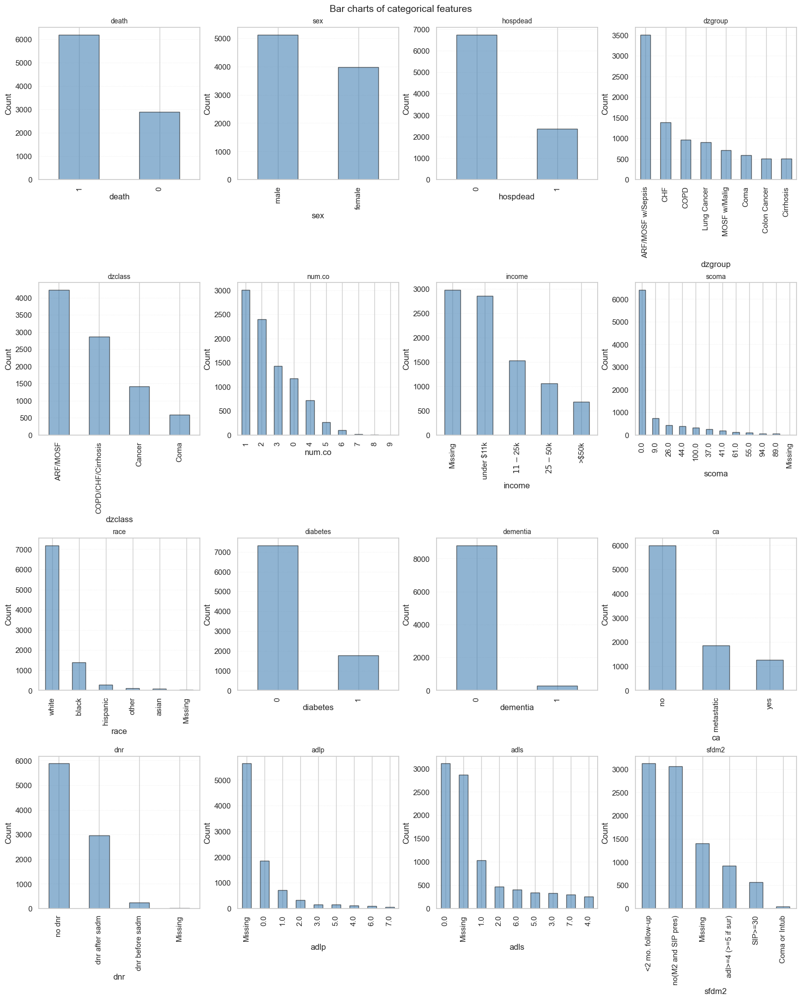

In [1166]:
plot_categorical_bars(
    df, cols=['death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co', 'income', 'scoma', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'adlp', 'adls', 'sfdm2'],
    n_cols=4,
    top=None,
    normalize=False
)

### **5.1.1. Bar Charts Interpretation**

All categorical variables are retained for further analysis. However, some are marked as **doubt** due to category dominance, missing data, or potential multicollinearity.

- **sex:** Selected  
- **dzgroup:** Selected *(Doubt — possible multicollinearity; may be dropped if the model performs poorly)*  
- **dzclass:** Selected *(Doubt — possible multicollinearity; preferred over dzgroup due to fewer categories and lower overfitting risk)*  
- **num.co:** Selected  
- **income:** Selected *(Doubt — missing values present)*  
- **race:** Selected *(Doubt — imbalance across categories)*  
- **diabetes:** Selected  
- **dementia:** Selected *(Doubt — category dominance)*  
- **ca:** Selected  
- **dnr:** Selected  
- **death:** Selected  
- **hospdead:** Selected  
- **adlp:** Selected *(Doubt — missing values / multicollinearity; preferred initially since self-reported by patient)*  
- **adls:** Selected *(Doubt — missing values / multicollinearity with adlp)*  
- **sfdm2:** Selected  

---

**Summary:**  
No removing useless columns from the data. **All categorical variables are selected and retained** for further analysis.


## **5.2. Visualize distribution of all the Continuous Predictor variables**

**Continuous Predictors:**

* 'age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc'

Histograms are used to visualize the distribution of data across continuous variables.

### **5.2.1. Visualize distribution of all the Continuous Predictor variables in the data using histograms**

In [1167]:
def plot_hist_grid(
    df, cols, bins=30, n_cols=4,
    show_kde=True,
    kde_bw=None
):
    n = len(cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows), constrained_layout=True)
    axes = np.array(axes).reshape(-1)

    for i, col in enumerate(cols):
        series = df[col].replace([np.inf, -np.inf], np.nan).dropna()
        if series.size == 0:
            axes[i].set_visible(False)
            continue

        counts = axes[i].hist(series, bins=bins, color="steelblue", edgecolor="black", alpha=0.6)

        if show_kde and series.size > 1 and np.ptp(series) > 0:
            kde = gaussian_kde(series, bw_method=kde_bw)
            x = np.linspace(series.min(), series.max(), 512)
            bin_edges = counts[1]
            bin_width = (bin_edges[1] - bin_edges[0]) if len(bin_edges) > 1 else 1.0
            y = kde(x) * series.size * bin_width
            axes[i].plot(x, y, linewidth=1, color="steelblue")

        mean_value = float(series.mean())
        median_value = float(series.median())
        mode_series = series.mode(dropna=True)
        mode_value = float(mode_series.iloc[0]) if not mode_series.empty else mean_value

        axes[i].axvline(mean_value, color="red", linestyle="--", linewidth=0.8)
        axes[i].axvline(median_value, color="green", linestyle="-.", linewidth=0.8)
        axes[i].axvline(mode_value, color="blue", linestyle=":", linewidth=0.8)

        axes[i].set_title(col, fontsize=10)
        axes[i].set_xlabel("")
        axes[i].set_ylabel("Frequency")
        axes[i].grid(axis="y", linestyle=":", alpha=0.6)

    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle("Histograms of numeric features", fontsize=14)
    plt.show()


In [1168]:
def summarize_numeric(df, cols):
    summary = {}
    for col in cols:
        series = df[col].replace([np.inf, -np.inf], np.nan).dropna()
        if series.size > 0:
            mean_value = float(series.mean())
            median_value = float(series.median())
            mode_series = series.mode(dropna=True)
            mode_value = float(mode_series.iloc[0]) if not mode_series.empty else mean_value
            summary[col] = {
                "Mean": mean_value,
                "Median": median_value,
                "Mode": mode_value
            }
    return pd.DataFrame(summary).T

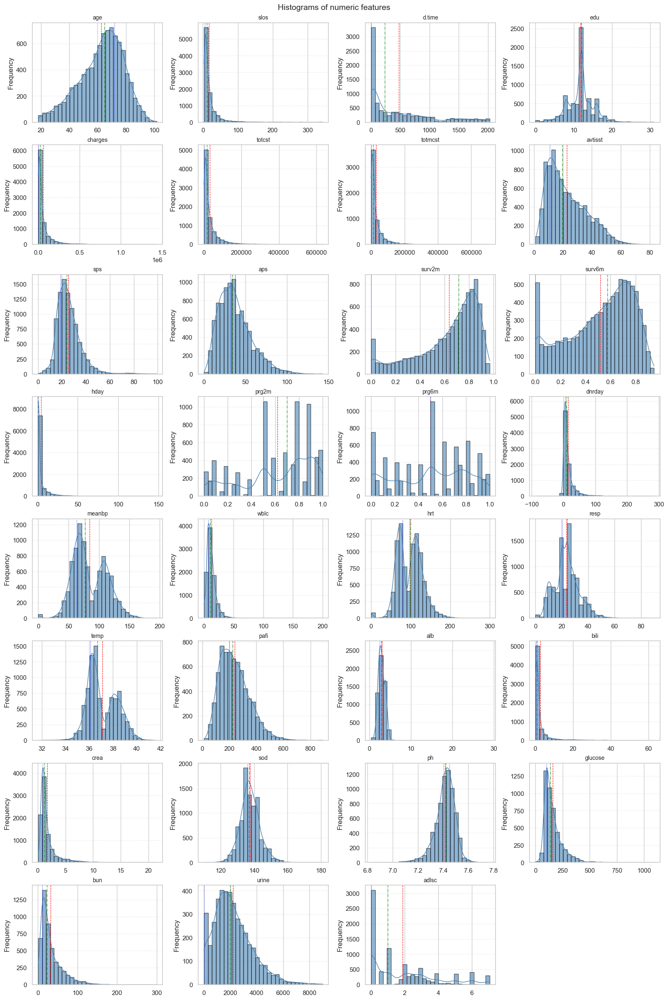

In [1169]:
num_cols = ['age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc']
plot_hist_grid(df, num_cols, bins=30, n_cols=4)

In [1170]:
summarize_numeric(df, num_cols) # mean, median, mode

,Mean,Median,Mode
age,62.650823,64.856990,71.996950
slos,17.863042,11.000000,5.000000
d.time,478.449863,233.000000,4.000000
edu,11.747691,12.000000,12.000000
charges,59995.787811,25024.000000,4510.000000
totcst,30825.867768,14452.734400,0.000000
totmcst,28828.877838,13223.500000,0.000000
avtisst,22.610928,19.500000,11.000000
sps,25.525872,23.898438,18.898438
aps,37.597979,34.000000,32.000000


### **5.2.2. Visualize distribution of all the Continuous Predictor variables in the data using box plots**

In [1171]:
def plot_box_grid(df, cols, n_cols=4, ylims=None):
    n = len(cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 3*n_rows), constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(cols):
        series = df[col].dropna()
        axes[i].boxplot(series, vert=True, patch_artist=True,
                        boxprops=dict(facecolor="lightblue", color="black"),
                        medianprops=dict(color="red"),
                        whiskerprops=dict(color="black"),
                        capprops=dict(color="black"))
        axes[i].set_title(col, fontsize=10)
        axes[i].grid(axis="y", linestyle=":", alpha=0.6)

        # apply same y-axis limits if provided
        if ylims and col in ylims:
            axes[i].set_ylim(*ylims[col])

    # hide unused axes
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle("Boxplots of numeric features", fontsize=14)
    plt.show()

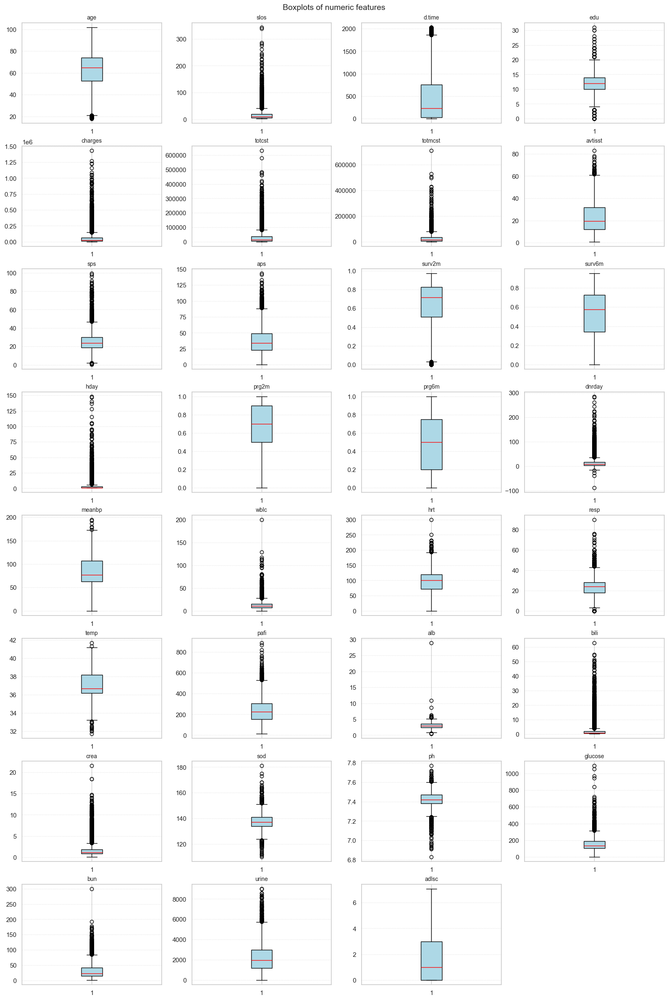

In [1172]:
num_cols = ['age', 'slos', 'd.time', 'edu', 'charges', 'totcst', 'totmcst', 'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun', 'urine', 'adlsc']
plot_box_grid(df, num_cols, n_cols=4)

### **5.2.3. Histogram and Boxplot Interpretation**

All continuous variables are retained for further analysis. Each distribution was reviewed, and all are acceptable for modeling.

- **age:** Selected. Approximately normal, with most patients between 60–80 years old. Very young (20) and very old (100) values are valid hospital cases.  
- **slos:** Selected. Strong positive skew; acceptable.  
- **d.time:** Selected. Strong positive skew; acceptable.  
- **edu:** Selected. Slight positive skew; acceptable.  
- **totcst:** Selected. Strong positive skew; acceptable.  
- **totmcst:** Selected. Strong positive skew; acceptable.  
- **avtisst:** Selected. Strong positive skew; acceptable.  
- **sps:** Selected. Approximately normal with a slight right skew; acceptable.  
- **aps:** Selected. Approximately normal with a slight right skew; acceptable.  
- **surv2m:** Selected. Good distribution.  
- **surv6m:** Selected. Good distribution.  
- **hday:** Selected. Strong positive skew; acceptable.  
- **prg2m:** Selected. Irregular with spikes; acceptable.  
- **prg6m:** Selected. Irregular with spikes; acceptable.  
- **dnrday:** Selected. Strong positive skew with heavy concentration at zero; acceptable.  
- **meanbp:** Selected. Bimodal distribution; acceptable.  
- **wblc:** Selected. Strong positive skew; acceptable. Log transformation may help.  
- **hrt:** Selected. Bimodal with peaks around 80 and 120 bpm; acceptable.  
- **resp:** Selected. Approximately normal with a slight right skew; acceptable.  
- **temp:** Selected. Bimodal distribution reflecting fever vs. hypothermia; acceptable.  
- **pafi:** Selected. Slight positive skew; acceptable.  
- **alb:** Selected. Strong positive skew; acceptable.  
- **bili:** Selected. Strong positive skew; acceptable.  
- **crea:** Selected. Strong positive skew; acceptable.  
- **sod:** Selected. Approximately normal with slight skew; acceptable.  
- **ph:** Selected. Approximately normal around 7.4; acceptable.  
- **glucose:** Selected. Strong positive skew; acceptable.  
- **bun:** Selected. Strong positive skew; acceptable.  
- **urine:** Selected. Slight positive skew; acceptable.  
- **adlsc:** Selected. Irregular with spikes; acceptable.  

---

 **Summary**

No columns are removed. **All continuous variables are selected and retained** for further analysis.

# **Visual Exploratory Data and Basic Data Exploration Result**
1. **Data Transformation is Needed:**  
   If `charges` variable is highly skewed. A log transformation will be applied to make the data suitable for linear modeling.  

2. **Outliers are Not Errors:**  
   Outliers represent real, clinically important cases (e.g., very high WBC counts) and must be kept, as they are crucial for predicting the highest costs.  

3. **The Relationship is Non-Linear:**  
   Costs rise exponentially with severity of illness, so predictors and charges are not linearly proportional.  

4. **Missing Data is Not Random:**  
   Missing values may be related to patient condition. Robust imputation strategies will be used to preserve information, especially for the sickest patients.  

# **6. Outlier treatment**
* **age** - Keep outliers. Extreme ages (20-100) are possible and represent a portion of the patient population.  
* **slos & d.time (Length of Stay & Follow-up)**: Keep outliers. Exceptionally long hospital stays and follow-up periods are genuine outcomes for critically ill patients.  
* **edu (Education)**: Keep outliers. The education level of patients can genuinely vary widely.  
* **totcst & totmcst (Total Cost)**: Drop these variables. They are direct components of charges and would cause data leakage.  
* **avtisst & aps (Clinical Scores)**: Keep outliers. High scores are not errors but accurate reflections of severe illness.  
* **sps (Physiology Score)**: Drop this variable. It's a derived score and would cause data leakage.  
* **surv2m & surv6m (Survival Estimates)**: Drop these variables. They are model-based predictions and would cause data leakage.  
* **hday (Hospital Day)**: Keep outliers. It's a valid record of the patient's condition at a specific time.  
* **prg2m & prg6m (Physician Estimates)**: Drop these variables. They are physician predictions and would cause data leakage.  
* **dnrday (DNR Day)**: Keep outliers. Negative or large positive values are clinically meaningful.  
* **meanbp (Blood Pressure)**: Keep outliers. Extremely low or high values indicate critical conditions like shock or hypertension and are not errors.  
* **wblc (White Blood Cell Count)**: Keep outliers. High counts signal severe infection or disease and are not errors.  
* **hrt (Heart Rate)**: Keep outliers. Very low or high rates are signs of life-threatening conditions.  
* **resp (Respiration Rate)**: Keep outliers. Extremely high rates are valid for critical cases.  
* **temp (Temperature)**: Keep outliers. Both hypothermia and fever are clinically significant and must be kept.  
* **pafi (PaO₂/FiO₂ ratio)**: Keep outliers. Very low ratios indicate severe respiratory failure.  
* **alb (Albumin)**: Keep outliers. Low levels are a sign of malnutrition or organ failure.  
* **bili (Bilirubin)**: Keep outliers. High levels are a valid sign of liver failure.  
* **crea (Creatinine)**: Keep outliers. High levels indicate kidney failure.  
* **sod (Sodium)**: Keep outliers. Abnormal levels are clinically valid and important.  
* **ph (Blood pH)**: Keep outliers. Small shifts in pH are clinically meaningful.  
* **glucose**: Keep outliers. Extremely high levels indicate hyperglycemia or diabetic crisis.  
* **bun (Blood Urea Nitrogen)**: Keep outliers. Very high levels are a sign of kidney failure.  
* **urine**: Keep outliers. Both extremely low and high urine volumes are valid clinical signs.  
* **adlsc (ADL Score)**: Keep outliers. These represent patients with severe disabilities and are not errors.  

---


In [1173]:
leak_col = ['totcst', 'totmcst', 'sps', 'surv2m', 'surv6m', 'prg2m', 'prg6m']
df = df.drop(columns=leak_col)
print(df.shape)

(9105, 41)


### **Summary of Outlier Decisions**

**No outlier treatment will be applied.**

All extreme values are considered **clinically valid** (e.g., a patient with a heart rate of 280 bpm is considered Tachycardia), as even though the data may appear unusual, it represents real medical records that I respect and prefer not to remove.

Only variables that risk **data leakage** (`totcst`, `totmcst`, `sps`, `surv2m`, `surv6m`, `prg2m`, `prg6m`) are remove.

# **7. Missing value treatment**

If a column has more than 30% data missing, then missing value treatment cannot be done. That column must be rejected because too much information is missing.

There are below options for treating missing values in data.
* Impute the missing values with MEAN or MEDIAN value for continuous variables
* Impute the missing values with MODE value for categorical variables



## **7.1 Missing values tratment for Continuous features**

### **7.1.1. Removing the missing values**

#### **Check the missing values**

Remove values with more than 30% missing

In [1174]:
continuous_features = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges'
]

missing = df[continuous_features].isnull().sum()
missing_percent = (missing / len(df)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

         Missing Values  Percentage
column                             
urine              4862       53.40
glucose            4500       49.42
bun                4352       47.80
alb                3372       37.03
bili               2601       28.57
pafi               2325       25.54
ph                 2284       25.09
edu                1634       17.95
wblc                212        2.33
charges             172        1.89
avtisst              82        0.90
crea                 67        0.74
dnrday               30        0.33
aps                   1        0.01
hrt                   1        0.01
resp                  1        0.01
temp                  1        0.01
meanbp                1        0.01
sod                   1        0.01
d.time                0        0.00
hday                  0        0.00
age                   0        0.00
slos                  0        0.00
adlsc                 0        0.00


In [1175]:
# features to drop if more than 30% missing
to_drop = missing_table[missing_table['Percentage'] > 30].index.tolist()

# drop them from df
df_clean = df.drop(columns=to_drop)
print("Dropped features:", to_drop)
print("New shape:", df_clean.shape)


Dropped features: ['alb', 'glucose', 'bun', 'urine']
New shape: (9105, 37)


Features with more than 30% missing values were removed:
* alb
* glucose
* bun
* urine

### **7.1.2. Filling the missing values**

If a feature is skewed, fill missing values with the **median** since it is less affected by outliers


If a feature is not skewed, fill missing values with the **mean** instead.

#### **Check which features have missing values**

In [1176]:
# filter: greater than 0 and less than 30%
filtered_table = missing_table[
    (missing_table['Missing Values'] > 0) &
    (missing_table['Percentage'] < 30)
]

# sort by percentage of missing values, descending
filtered_table = filtered_table

print(filtered_table)

         Missing Values  Percentage
column                             
edu                1634       17.95
avtisst              82        0.90
aps                   1        0.01
dnrday               30        0.33
meanbp                1        0.01
wblc                212        2.33
hrt                   1        0.01
resp                  1        0.01
temp                  1        0.01
pafi               2325       25.54
bili               2601       28.57
crea                 67        0.74
sod                   1        0.01
ph                 2284       25.09
charges             172        1.89


#### **Fill missing values with mean**

From the Histogram and Boxplot Interpretation:

*   age
*   surv6m
*   manbp
*   hrt
*   tep
*   sod
* ph

These features have approximately normal distributions(the result from 5.2.3.), so their missing values are filled with the mean.

In [1177]:
mean_features = ['age', 'meanbp', 'hrt', 'temp', 'sod', 'ph']
df_clean[mean_features] = df_clean[mean_features].fillna(df_clean[mean_features].mean())

#### **Fill missing values with median**

All the features left have skewed distributions, so missing values are filled wit the median

In [1178]:
# choose the columns you care about
cols_to_check = continuous_features  # your list

# build missing table on the original df
missing = df[cols_to_check].isnull().sum()
missing_percent = (missing / len(df)) * 100
missing_table = pd.DataFrame({
    "Missing Values": missing,
    "Percentage": missing_percent
})

# pick columns with 0% < missing < 30%
mask = (missing_table["Missing Values"] > 0) & (missing_table["Percentage"] < 30)
to_impute = missing_table.index[mask].tolist()

# fill with column medians and merge into df_clean
medians = df_clean[to_impute].median()
df_clean[to_impute] = df_clean[to_impute].fillna(medians)

# quick sanity check (shows only any leftovers)
print("Imputed (median):", to_impute)
print(df_clean[to_impute].isnull().sum()[lambda s: s > 0])

Imputed (median): ['edu', 'avtisst', 'aps', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp', 'temp', 'pafi', 'bili', 'crea', 'sod', 'ph', 'charges']
Series([], dtype: int64)


### **7.1.3. Result after missing values treatment for continuous features**

In [1179]:
new_continuous_features = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','bili',
    'crea', 'sod','ph','adlsc' ,'charges'
]


missing_clean = df_clean[new_continuous_features].isnull().sum()
missing_percent_clean = (missing_clean / len(df_clean[new_continuous_features])) * 100

missing_table_clean = pd.DataFrame({
    'Missing Values': missing_clean,
    'Percentage': missing_percent_clean.round(2)
})
print(missing_table_clean.sort_values(by="Percentage", ascending=False))

missing_table_clean = missing_table_clean[missing_table_clean['Missing Values'] > 0]

         Missing Values  Percentage
column                             
age                   0         0.0
slos                  0         0.0
d.time                0         0.0
edu                   0         0.0
avtisst               0         0.0
aps                   0         0.0
hday                  0         0.0
dnrday                0         0.0
meanbp                0         0.0
wblc                  0         0.0
hrt                   0         0.0
resp                  0         0.0
temp                  0         0.0
pafi                  0         0.0
bili                  0         0.0
crea                  0         0.0
sod                   0         0.0
ph                    0         0.0
adlsc                 0         0.0
charges               0         0.0


No missing values left in continuous features

## **7.2. Missing values tratment for Categorical features**

### **7.2.1.Removing the missing values**

#### **Check the missing values**

Remove values with more than 30% missing

In [1180]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income', 'scoma',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adlp', 'adls', 'sfdm2'],

missing = df[categorical_features[0]].isnull().sum()
missing_percent = (missing / len(df)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
column                              
adlp                5641       61.95
income              2982       32.75
adls                2867       31.49
sfdm2               1400       15.38
race                  42        0.46
dnr                   30        0.33
scoma                  1        0.01
death                  0        0.00
dzclass                0        0.00
num.co                 0        0.00
hospdead               0        0.00
dzgroup                0        0.00
sex                    0        0.00
ca                     0        0.00
diabetes               0        0.00
dementia               0        0.00


In [1181]:
# features to drop if more than 30% missing
to_drop_cat = missing_table[missing_table['Percentage'] > 30].index.tolist()

# drop them from df_clean
df_clean = df_clean.drop(columns=to_drop_cat)

print("Dropped categorical features:", to_drop_cat)
print("New shape:", df_clean.shape)

Dropped categorical features: ['income', 'adlp', 'adls']
New shape: (9105, 34)


### **7.2.2. Filling the missing values**

Impute the missing values with MODE value for categorical variables

In [1182]:
mode_features = ['sfdm2','race','dnr','scoma']
mode_dict = {col: df_clean[col].mode()[0] for col in mode_features}
df_clean[mode_features] = df_clean[mode_features].fillna(mode_dict)

In [1183]:
df_clean = df_clean.drop(columns=df_clean.columns[0])
num_missing_cols = (df_clean.isnull().sum() > 0).sum()

print("Number of features with missing values:", num_missing_cols)
print("New shape:", df_clean.shape)

Number of features with missing values: 0
New shape: (9105, 33)


In [1184]:
missing = df_clean.isnull().sum()
missing_percent = (missing / len(df_clean)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
column                              
age                    0         0.0
death                  0         0.0
sex                    0         0.0
hospdead               0         0.0
slos                   0         0.0
d.time                 0         0.0
dzgroup                0         0.0
dzclass                0         0.0
num.co                 0         0.0
edu                    0         0.0
scoma                  0         0.0
charges                0         0.0
avtisst                0         0.0
race                   0         0.0
aps                    0         0.0
hday                   0         0.0
diabetes               0         0.0
dementia               0         0.0
ca                     0         0.0
dnr                    0         0.0
dnrday                 0         0.0
meanbp                 0         0.0
wblc                   0         0.0
hrt                    0         0.0
resp                   0         0.0
t

No missing values left in all features

## **7.3. Visualization of Histograms and Boxplots After Missing Value Treatment**

Visualization with histograms and boxplots after missing value treatment helps confirm whether the imputation preserved the data’s distribution, spread, and outliers without introducing distortions.

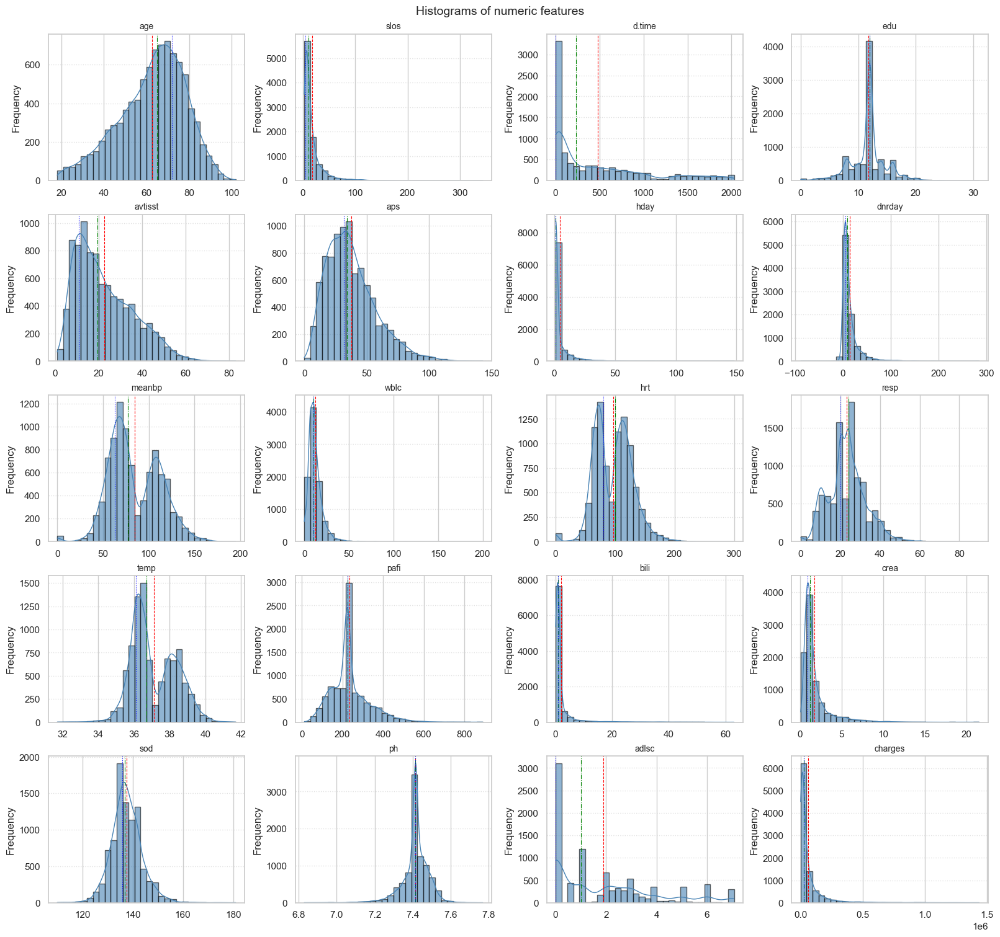

In [1185]:
plot_hist_grid(df_clean, new_continuous_features, bins=30, n_cols=4)

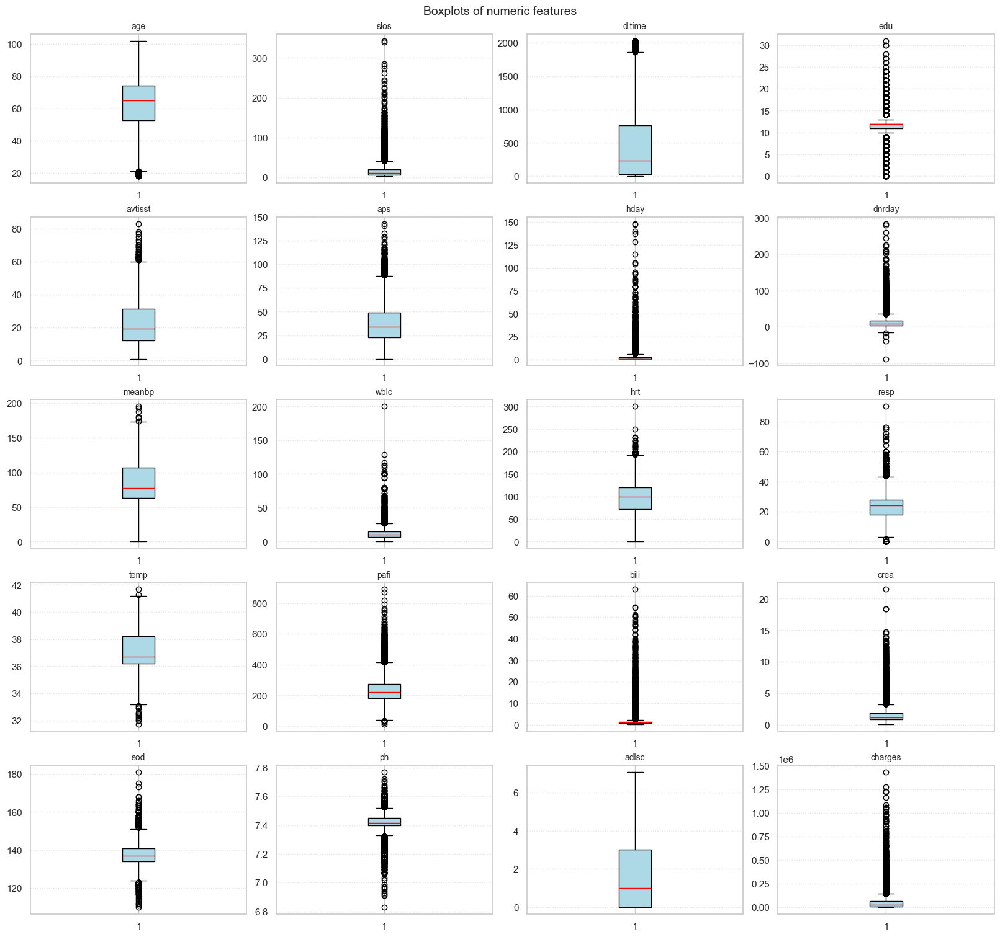

In [1408]:
ylims = {col: (df_clean[col].min(), df_clean[col].max()) for col in new_continuous_features}

plot_box_grid(df_clean, new_continuous_features, n_cols=4,)

Histograms and boxplots after missing value treatment show that the data’s distribution and spread remain the same, indicating the imputation did not distort the dataset.

## **7.4. Training and Testing sample**
We do not use the full data for creating the model. Some data is randomly selected and kept aside for checking how good the model is. This is known as Testing Data and the remaining data is called Training data on which the model is built.

#### **Splitting the Data**
70% of data is used as Training data and the rest 30% is used as Tesing data.

In [1187]:
target_variables =  ['charges']
predictor_variables=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','bili','crea',
    'sod','ph','adlsc' ,'death', 'sex','hospdead',
    'dzgroup','dzclass', 'num.co', 'scoma','race',
    'diabetes', 'dementia', 'ca','dnr', 'sfdm2'
]


In [1188]:
X = df_clean[predictor_variables]
y = df_clean[target_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#### **Visualization of Training and Testing Data**
To confirm they follow similar distributions, ensuring the split was fair and that the model will be tested on data representative of what it learned during training.

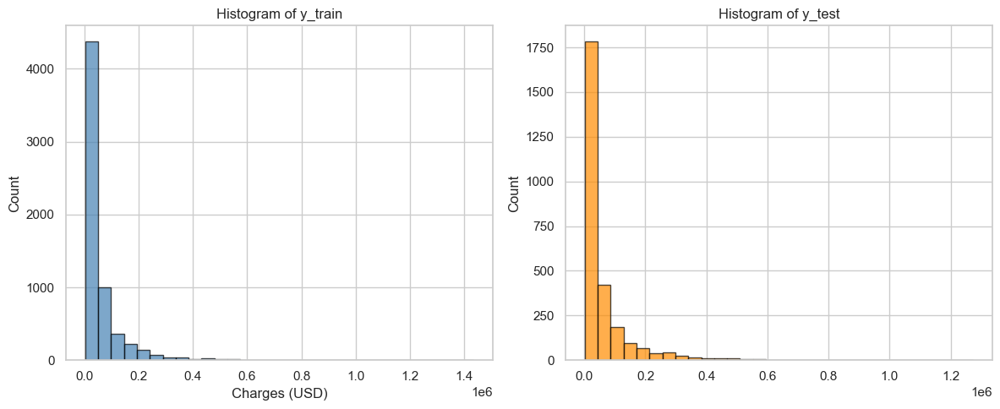

In [1189]:
import matplotlib.pyplot as plt

# Plot histograms for y_train and y_test
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(y_train, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_train")
plt.xlabel("Charges (USD)")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(y_test, bins=30, color="darkorange", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_test")
plt.ylabel("Charges (USD)")
plt.ylabel("Count")

plt.tight_layout()
plt.show()


The visualization of training and testing data shows similar distributions, confirming that the split is balanced and representative of the overall dataset.

In [1190]:
train_df = X_train.copy()
train_df["charges"] = y_train

test_df = X_test.copy()
test_df["charges"] = y_test

print(train_df.shape)
print(test_df.shape)

(6373, 33)
(2732, 33)


# **8. Feature selection by Visual correlation analysis and Statistical measurement**

In this case study the Target variable is Continuous, hence below two scenarios will be present

* Continuous Target Variable Vs Continuous Predictor
* Continuous Target Variable Vs Categorical Predictor

## **8.1. Relationship exploration: Continuous Vs Continuous -- Scatter Charts**

### **8.1.1. Visual exploration**

In [1191]:
def plot_scatter_grid(train_df, x_cols, y_col, n_cols=3):
    n = len(x_cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(5*n_cols, 4*n_rows),
                             constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(x_cols):
        axes[i].scatter(train_df[col], train_df[y_col], alpha=0.5,
                        color="steelblue", edgecolor="black")
        axes[i].set_title(f"{col} vs {y_col}", fontsize=9)
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(y_col)
        axes[i].grid(linestyle=":", alpha=0.6)

    # hide any unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle(f"Scatter plots vs {y_col}", fontsize=14)
    plt.show()

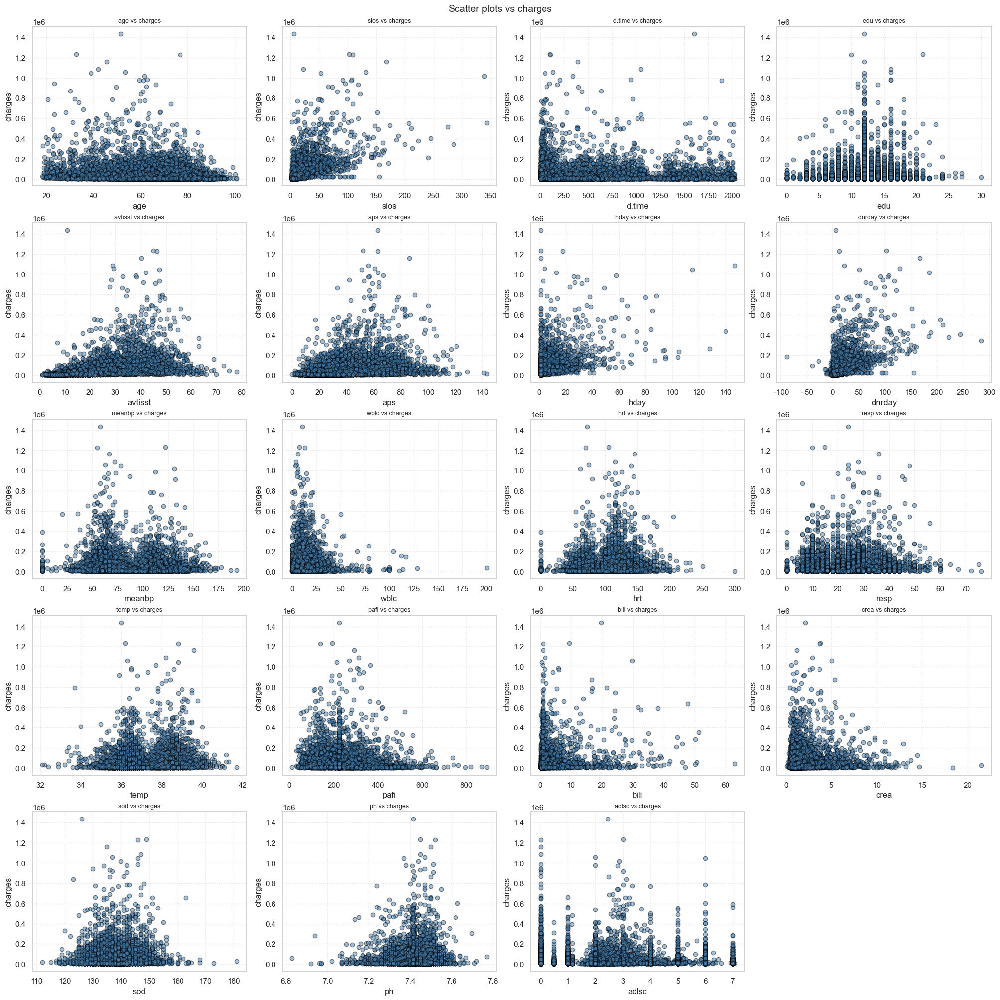

In [1192]:
plot_scatter_grid(train_df, x_cols=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','bili','crea',
    'sod','ph','adlsc'
    ]
    ,y_col='charges', n_cols=4)

#### **Scatter Charts Interpretation**

* **age:** Selected. Weakly decreasing trend.  
* **slos:** Selected. Strongly increasing trend.  
* **d.time:** Selected. Strongly increasing trend.  
* **edu:** Selected. Weakly increasing trend.  
* **avtisst:** Selected. Strongly increasing trend.  
* **aps:** Selected. Strongly increasing trend.  
* **hday:** Selected. Weakly increasing trend.  
* **dnrday:** Selected. Weakly increasing trend.  
* **meanbp:** Selected. No trend.  
* **wblc:** Selected. Weakly increasing trend.  
* **hrt:** Selected. No trend.  
* **resp:** Selected. Weakly increasing trend.  
* **temp:** Selected. No trend.  
* **pafi:** Selected. Weakly decreasing trend.  
* **bili:** Selected. Weakly increasing trend.  
* **crea:** Selected. Weakly increasing trend.  
* **sod:** Selected. No trend.  
* **ph:** Selected. No trend.  
* **glucose:** Selected. Weakly increasing trend.  
* **bun:** Selected. Weakly increasing trend.  
* **urine:** Selected. No trend.  
* **adlsc:** Selected. Weakly decreasing trend.  

### **8.1.2. Statistical Feature Selection**

We plot a heatmap to visualize correlations, allowing us to see how each feature relates to the target and how features are interrelated with one another.

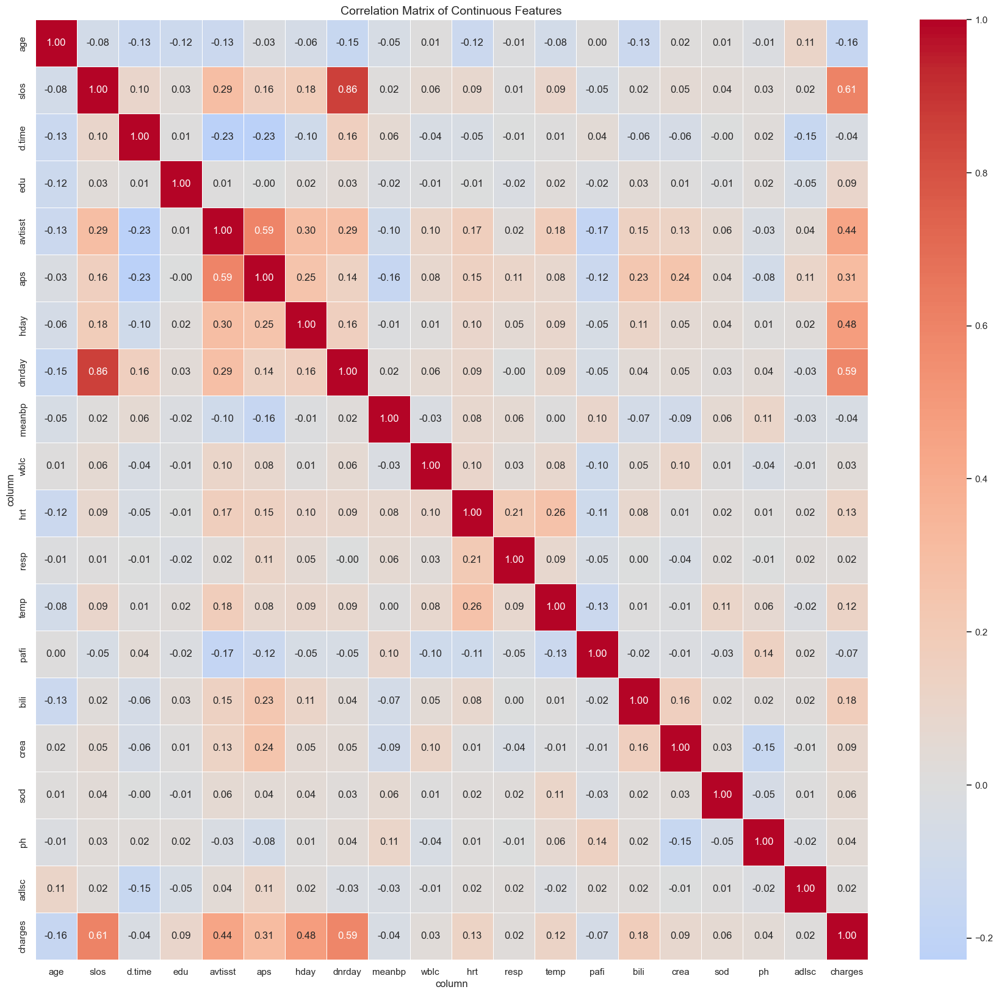

In [1193]:
# compute correlation matrix for continuous features
corr = train_df[new_continuous_features].corr()

# set up the plot
plt.figure(figsize=(22,20))
sns.heatmap(
    corr,
    annot=True,        # show correlation values
    fmt=".2f",         # format with 2 decimal places
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar=True
)
plt.title("Correlation Matrix of Continuous Features", fontsize=14)
plt.show()

In [1194]:
# Filtering only those columns where absolute correlation > 0.5 with Target Variable
# Adjust the threshold if no variable is selected
correlation_with_target = corr['charges']  # assuming 'charges' is the target variable
filtered_corr = correlation_with_target[abs(correlation_with_target) > 0.5]

# Display the filtered correlations
print(filtered_corr)

column
slos       0.605423
dnrday     0.588628
charges    1.000000
Name: charges, dtype: float64


The heatmap shows that **slos, totcst,** and **dnrday** have strong correlations with the target (above 0.5), but since these features are **also highly correlated with each other**, we selected only the one **most correlated with the target** to avoid redundancy.

**Final selected Continuous columns from Visual exploration and Statistical Feature Selection:**

`slos`

## **8.2 Relationship exploration: Categorical Vs Continuous -- Box Plots**

### **8.2.1. Visual exploration**

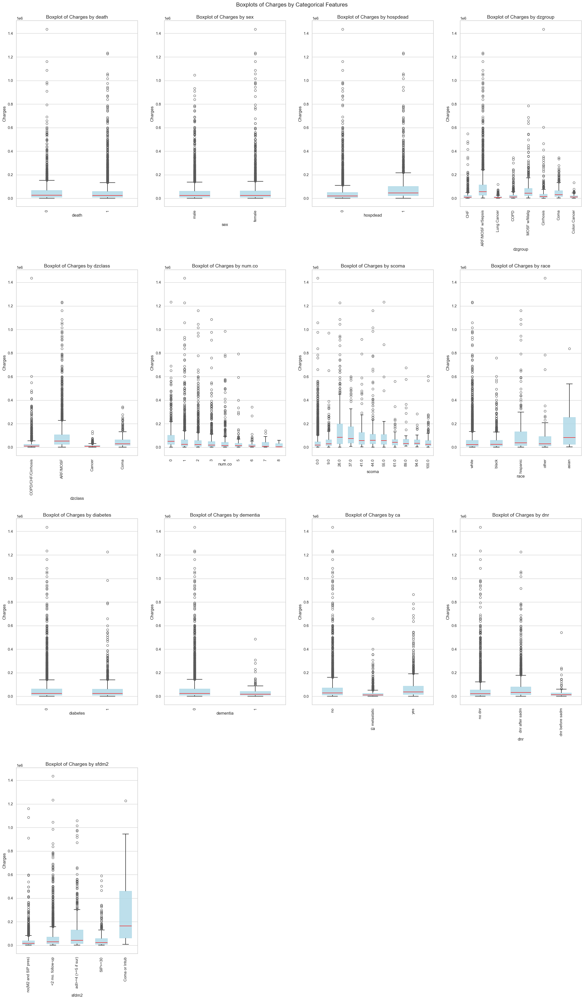

In [1195]:
CategoricalColsList = [['death', 'sex', 'hospdead', 'dzgroup',
                        'dzclass', 'num.co', 'scoma', 'race', 'diabetes',
                        'dementia', 'ca', 'dnr', 'sfdm2']]

# Calculate number of rows and columns for a 4x4 matrix
n_cols = 4
n_rows = (len(CategoricalColsList[0]) + n_cols - 1) // n_cols  # Ensure enough rows for all plots
fig, PlotCanvas = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols * 6, n_rows * 10))
PlotCanvas = PlotCanvas.flatten()
sns.set(style="whitegrid")

# Creating box plots for each categorical feature against the Target Variable "charges"
for i, PredictorCol in enumerate(CategoricalColsList[0]):
    sns.boxplot(data=train_df, x=PredictorCol, y="charges", ax=PlotCanvas[i], palette="Set2",
                width=0.5, fliersize=6, linewidth=1.2,
                boxprops=dict(facecolor="skyblue", color="lightblue", alpha=0.8),
                medianprops=dict(color="red"),
                whiskerprops=dict(color="black"),
                capprops=dict(color="black"))

    # Set plot title and labels with adjustments
    PlotCanvas[i].set_title(f'Boxplot of Charges by {PredictorCol}', fontsize=14)
    PlotCanvas[i].set_xlabel(PredictorCol, fontsize=12)
    PlotCanvas[i].set_ylabel('Charges', fontsize=12)
    PlotCanvas[i].tick_params(axis='x', rotation=90)  # Rotate x-axis labels for readability

# Hide any empty subplots (if there are more subplots than features)
for j in range(i + 1, len(PlotCanvas)):
    PlotCanvas[j].axis('off')

# Adjust layout and spacing to fit in Colab
plt.tight_layout(pad=3.0)  # Add padding between subplots
plt.suptitle('Boxplots of Charges by Categorical Features', fontsize=16, y=1)

# Show the plot
plt.show()

### **Selected Categorical Variables:**

- **dzclass (Disease Class)**: **Selected**. The boxes are not aligned, showing **strong correlation**. Patients in the ARF/MOSF and Coma classes have significantly higher median charges than those in other classes like Cancer.

- **dzgroup (Disease Group)**: **Selected**. The boxes are not aligned, showing **strong correlation**. The median charge for patients in the ARF/MOSF group is much higher than for other groups, such as Lung Cancer.

- **num.co (Number of Comorbidities)**: **Selected**. The boxes are not aligned, showing **strong correlation**. The median charge increases as the number of comorbidities rises.

- **scoma (Coma Score)**: **Selected**. The boxes are not aligned, showing **strong correlation**. Lower coma scores (indicating a deeper coma) correlate with higher charges.

- **sfdm2 (Simplified Disease Model)**: **Selected**. The boxes are not aligned, showing **strong correlation**. The most severe categories (Coma or Intubated) have much higher median charges, indicating a strong link between illness severity and charges.

- **death & hospdead (Death in Hospital)**: **Selected**. The boxes are not aligned, showing **strong correlation**. The median charge for patients who died in the hospital is higher than for those who survived.

- **ca (Cancer)**: **Selected**. The boxes are not aligned, showing a **strong correlation**. Patients with metastatic cancer have slightly higher median charges than those without cancer.

- **race**: **Selected**. The boxes are not aligned, showing a **weak correlation**. There are slight differences in the median charges across racial groups.**Doubt**

- **dementia**: **Selected**. The boxes are mostly aligned, showing a **weak correlation**. The median charge for patients with dementia is slightly lower than for those without it.**Doubt**

- **sex**: **Selected**. The boxes are mostly aligned, showing **weak correlation**. The median charge for males and females is almost identical.**Doubt**

- **diabetes**: **Selected**. The boxes are mostly aligned, showing **weak correlation**. The median charge for patients with diabetes is slightly higher than for those without it.**Doubt**

- **dnr (DNR Order)**: **Selected**. The boxes are mostly aligned, showing **weak correlation**. The timing of a DNR order does not appear to significantly affect charges.**Doubt**
---

## **Summary**

- **Strong correlation**: **dzclass**, **dzgroup**, **num.co**, **scoma**, **sfdm2**, **death & hospdead**, **ca**.
- **Weak correlation**: **race**, **dementia**, **diabetes**, **sex**, **dnr**.


### **8.2.2 Statistical Feature Selection**

#### **ANOVA** 

In [1196]:
train_df['num_co_bin'] = pd.cut(train_df['num.co'], bins=[-1, 0, 1, 2, 3, 5, 10], labels=['0','1','2','3','4-5','6+'])

In [1197]:
def anova_analysis(input_data, target_variable, categorical_predictors, min_group_size=2):
    selected_predictors = []

    print('------- ANOVA Results ------- \n')

    for predictor in categorical_predictors:
        data = input_data.dropna(subset=[predictor, target_variable]).copy()

        # Special handling for num.co: bin numeric values
        if predictor == 'num.co':
            # Bin num.co so that each bin has enough samples
            data[predictor] = pd.cut(data[predictor],
                                     bins=[-1,0,1,2,3,5,10],
                                     labels=['0','1','2','3','4-5','6+'])

        # Convert other numeric categorical predictors to string
        elif pd.api.types.is_numeric_dtype(data[predictor]):
            data[predictor] = data[predictor].astype(str)
        else:
            data[predictor] = data[predictor].astype(str)

        # Group target by predictor
        category_group_lists = data.groupby(predictor)[target_variable].apply(list)

        # Skip if any group has <2 samples
        if any(len(group) < min_group_size for group in category_group_lists):
            print(f"{predictor} still has a group with less than {min_group_size} samples, skipping ANOVA.")
            continue

        # Run ANOVA
        try:
            anova_results = f_oneway(*category_group_lists)
            p_value = anova_results.pvalue

            if p_value < 0.05:
                print(f"{predictor} is significantly correlated with {target_variable} | P-Value: {p_value:}")
                selected_predictors.append(predictor)
            else:
                print(f"{predictor} is NOT significantly correlated with {target_variable} | P-Value: {p_value:}")
        except Exception as e:
            print(f"Error with {predictor}: {e}")

    return selected_predictors

In [1198]:
categorical_predictors = ['death', 'sex', 'hospdead', 'dzgroup', 'dzclass',
                          'num.co', 'scoma', 'race', 'diabetes', 'dementia',
                          'ca', 'dnr', 'sfdm2']

target_variable = 'charges'

significant_predictors = anova_analysis(train_df, target_variable, categorical_predictors)
print("\nSignificant predictors:", significant_predictors)

------- ANOVA Results ------- 

death is NOT significantly correlated with charges | P-Value: 0.19203506016982924
sex is NOT significantly correlated with charges | P-Value: 0.10518949984900497
hospdead is significantly correlated with charges | P-Value: 4.826323377083814e-47
dzgroup is significantly correlated with charges | P-Value: 1.2149452645389234e-190
dzclass is significantly correlated with charges | P-Value: 3.6309449910463153e-187
num.co is significantly correlated with charges | P-Value: 3.7595507905699144e-17
scoma is significantly correlated with charges | P-Value: 1.1015488244140045e-125
race is significantly correlated with charges | P-Value: 5.184221074987997e-35
diabetes is significantly correlated with charges | P-Value: 0.04829238856198561
dementia is significantly correlated with charges | P-Value: 0.0016906130947941566
ca is significantly correlated with charges | P-Value: 1.9538047355716306e-47
dnr is significantly correlated with charges | P-Value: 1.477883360889

# **9. Selecting final predictors for Machine Learning summary**
Based on the above tests, selecting the final columns for machine learning

In [1199]:
SelectedColumns=['slos','hospdead', 'dzgroup', 'dzclass', 'num.co', 'scoma', 'race', 'diabetes', 'dementia', 'ca', 'dnr', 'sfdm2']
df_ml=train_df[SelectedColumns]
df_ml.head()

column,slos,hospdead,dzgroup,dzclass,num.co,scoma,race,diabetes,dementia,ca,dnr,sfdm2
5744,8,0,CHF,COPD/CHF/Cirrhosis,2,0.0,white,0,0,no,no dnr,no(M2 and SIP pres)
7976,6,1,ARF/MOSF w/Sepsis,ARF/MOSF,1,9.0,white,0,0,no,dnr after sadm,<2 mo. follow-up
2283,21,0,ARF/MOSF w/Sepsis,ARF/MOSF,1,0.0,white,1,0,no,no dnr,no(M2 and SIP pres)
4253,10,0,Lung Cancer,Cancer,1,0.0,white,0,0,metastatic,no dnr,<2 mo. follow-up
3704,26,0,Lung Cancer,Cancer,1,0.0,white,0,0,metastatic,no dnr,adl>=4 (>=5 if sur)


# **10. Data Preprocessing for Machine Learning**

**Features Type**

---

 **Binary Features**
- **hospdead** – 0/1. Selected  
- **diabetes** – 0/1. Selected  
- **dementia** – 0/1. Selected  

---

**Ordinal Features**
- **ca** – Ordinal (no < yes < metastatic). Selected  
- **sfdm2** – Ordinal (disability scale 1–5). Selected  

---

**Nominal Features**
- **dzgroup** – Detailed disease group. Selected  
- **dzclass** – Broad disease class. Selected  
- **num.co** – Integer count. Selected  
- **scoma** – Nominal. Selected  
- **race** – Nominal. Selected  
- **dnr** – Nominal. Selected  

---

 **Numerical Features**
- **slos** – Numeric. Selected  


## **10.1 Converting the ordinal variable to numeric**

In [1200]:
df_pp = train_df.copy()

In [1201]:
# Example mappings (adjust based on your dataset meaning)
ca_mapping = {
    "no": 0,
    "yes": 1,
    "metastatic": 2
}

sfdm2_mapping = {
    "<2 mo. follow-up": 0,
    "no(M2 and SIP pres)": 1,
    "adl>=4 (>=5 if sur)": 2,
    "SIP>=30": 3,
    "Coma or Intub": 4
}

# apply mappings for df.train
df_pp["ca"] = df_pp["ca"].map(ca_mapping)
df_pp["sfdm2"] = df_pp["sfdm2"].map(sfdm2_mapping)

# apply mappings for X_test
X_test["ca"] = X_test["ca"].map(ca_mapping)
X_test["sfdm2"] = X_test["sfdm2"].map(sfdm2_mapping)

In [1202]:
print(df_pp[["ca", "sfdm2"]].head())

column  ca  sfdm2
5744     0      1
7976     0      0
2283     0      1
4253     2      0
3704     2      2


In [1203]:
print(X_test[["ca", "sfdm2"]].head())

column  ca  sfdm2
8629     0      2
1068     0      0
6548     0      3
5458     0      0
5317     2      1


## **10.2 Converting the binary nominal variable to numeric using 1/0 mapping**

In [1204]:
# List of binary features
binary_features = ['hospdead', 'diabetes', 'dementia']
df_pp[binary_features].head()

column,hospdead,diabetes,dementia
5744,0,0,0
7976,1,0,0
2283,0,1,0
4253,0,0,0
3704,0,0,0


In [1205]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in df_pp.columns:
        # If already numeric, skip
        if df_pp[col].dtype == 'object':
            # Map common binary representations to 0/1
            df_pp[col] = df_pp[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            df_pp[col] = df_pp[col].astype(int)

# Verify conversion
df_pp[binary_features].head()

column,hospdead,diabetes,dementia
5744,0,0,0
7976,1,0,0
2283,0,1,0
4253,0,0,0
3704,0,0,0


In [1206]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in X_test.columns:
        # If already numeric, skip
        if X_test[col].dtype == 'object':
            # Map common binary representations to 0/1
            X_test[col] = X_test[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            X_test[col] = X_test[col].astype(int)

# Verify conversion
X_test[binary_features].head()

column,hospdead,diabetes,dementia
8629,0,0,0
1068,0,0,0
6548,0,1,0
5458,0,0,0
5317,0,0,0


## **10.3 Converting the nominal variable to numeric using get_dummies()**

In [1207]:
# One-hot encode and merge into df_preprocessing
df_pp = pd.get_dummies(
    df_pp,
    columns=["dzgroup", "dzclass", "scoma", "race", "dnr"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [1208]:
df_pp.filter(regex=r'^dnr_').head()

,dnr_dnr after sadm,dnr_dnr before sadm,dnr_no dnr
5744,False,False,True
7976,True,False,False
2283,False,False,True
4253,False,False,True
3704,False,False,True


In [1209]:
import re
dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|race|dnr)_', col)]

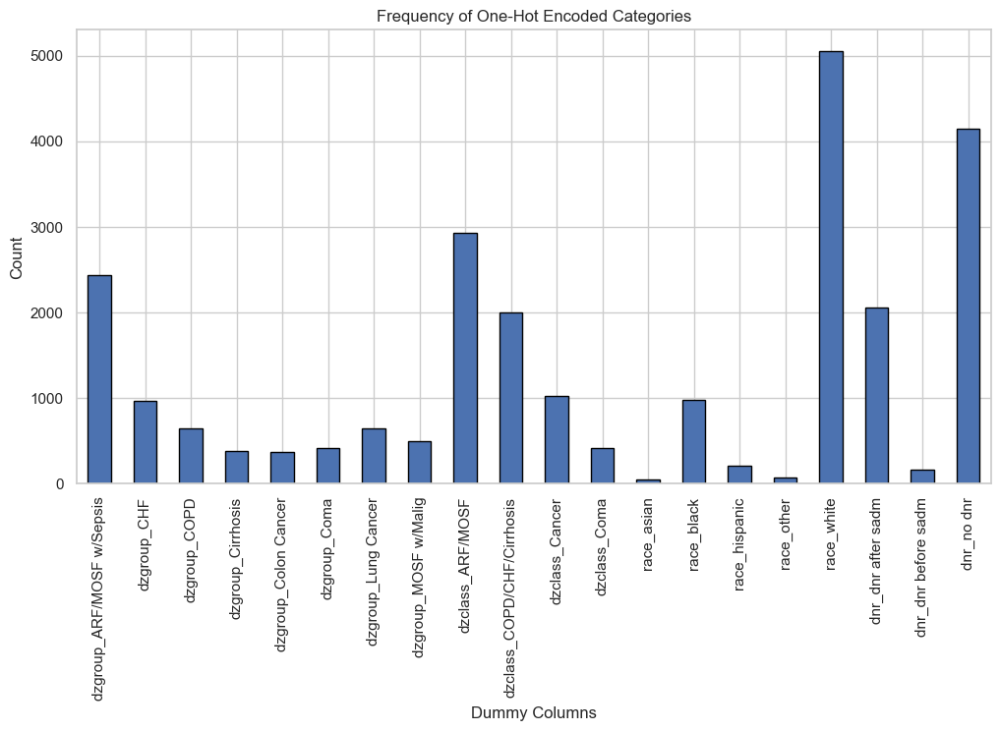

In [1210]:
# Count how many 1's in each dummy column
dummy_counts = df_pp[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

In [1211]:
# One-hot encode and merge into df_preprocessing
X_test = pd.get_dummies(
    X_test,
    columns=["dzgroup", "dzclass", "race", "dnr"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [1212]:
X_test.filter(like="dzgroup").head()

,dzgroup_ARF/MOSF w/Sepsis,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig
8629,False,False,True,False,False,False,False,False
1068,False,True,False,False,False,False,False,False
6548,True,False,False,False,False,False,False,False
5458,False,True,False,False,False,False,False,False
5317,False,False,False,False,False,False,True,False


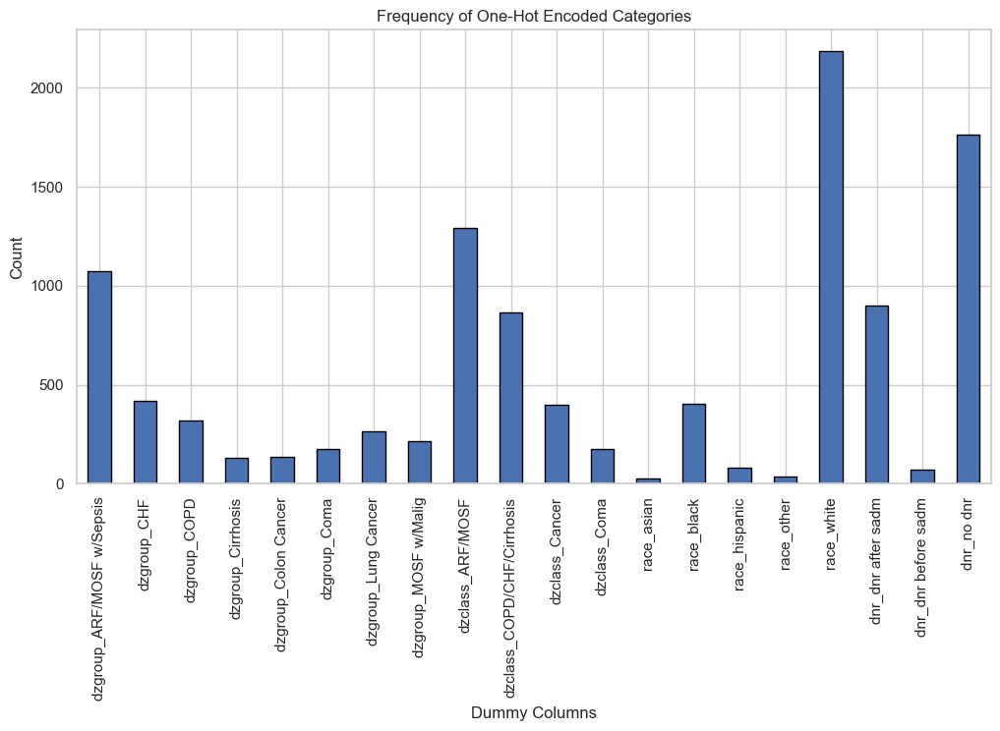

In [1213]:
# Count how many 1's in each dummy column
dummy_counts = X_test[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

## **10.4 Data Transformation**

### **Transformation on Training Data**

#### **Fixing Skewness**

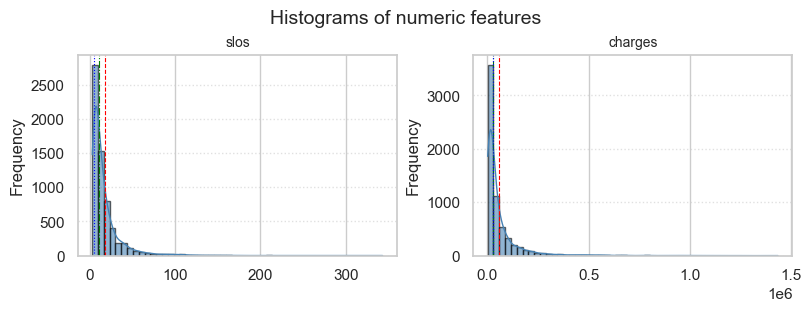

In [1214]:
plot_hist_grid(df_pp, ['slos','charges'], bins=50, n_cols=2)

In [1215]:
# Copy to avoid messing up the original df_clean
df_skewfix = df_pp.copy()

In [1216]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    df_pp[col] = np.cbrt(df_pp[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','charges']:
    # Add a small constant and handle potential negative values before log
    df_pp[col] = np.log1p(df_pp[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
df_pp.replace([np.inf, -np.inf], np.nan, inplace=True)


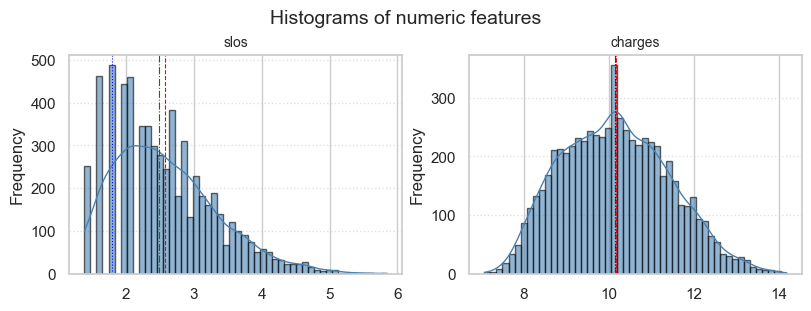

slos       0
charges    0
dtype: int64

In [1217]:
# Check histograms again
plot_hist_grid(df_pp, ['slos','charges'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','charges']
df_pp[check_cols].isnull().sum()

#### **Standardization**

In [1218]:
cols_to_standardize = ['slos']
df_std = df_pp[cols_to_standardize].copy()

In [1219]:
from sklearn.preprocessing import StandardScaler

# create scaler
scaler = StandardScaler()

# fit + transform only the selected columns
df_std[cols_to_standardize] = scaler.fit_transform(df_std[cols_to_standardize])

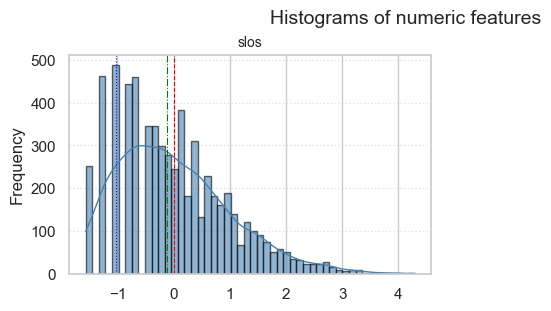

slos    0
dtype: int64

In [1220]:
# Check histograms again
plot_hist_grid(df_std, ['slos'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos']
df_std[check_cols].isnull().sum()

In [1221]:
print(df_std.head())
print(df_std.shape)

          slos
5744 -0.497725
7976 -0.828221
2283  0.677706
4253 -0.233829
3704  0.947025
(6373, 1)


In [1222]:
df_pp[cols_to_standardize] = df_std[cols_to_standardize]

### **Transformation on Testing Data**

#### **Fixing Skewness**

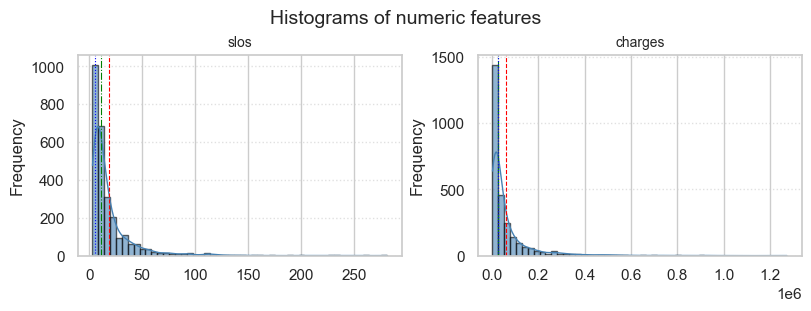

In [1223]:
plot_hist_grid(test_df, ['slos','charges'], bins=50, n_cols=2)

In [1224]:
dft_skewfix = test_df.copy()

In [1225]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    dft_skewfix[col] = np.cbrt(dft_skewfix[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','charges']:
    # Add a small constant and handle potential negative values before log
    dft_skewfix[col] = np.log1p(dft_skewfix[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
dft_skewfix.replace([np.inf, -np.inf], np.nan, inplace=True)

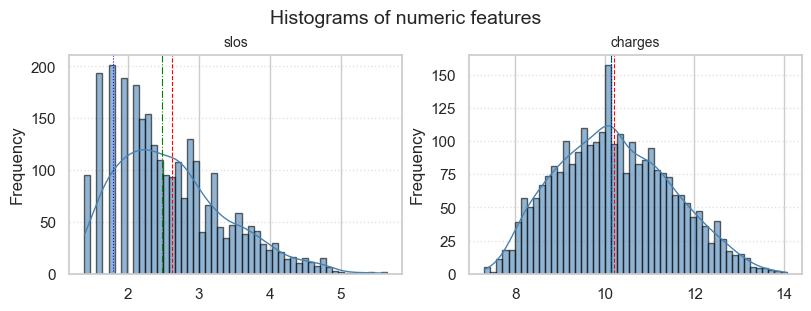

column
slos       0
charges    0
dtype: int64

In [1226]:
# Check histograms again
plot_hist_grid(dft_skewfix, ['slos','charges'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','charges']
dft_skewfix[check_cols].isnull().sum()

In [1227]:
X_test[['slos']] = dft_skewfix[['slos']]
y_test[['charges']] = dft_skewfix[['charges']]

#### **Standardization**

In [1228]:
dft_std = X_test[cols_to_standardize].copy()

In [1229]:
dft_std[cols_to_standardize] = scaler.transform(dft_std[cols_to_standardize])

print(dft_std.head())
print(dft_std.shape)

          slos
8629 -0.014142
1068  0.338644
6548 -0.119403
5458  0.174046
5317  0.258918
(2732, 1)


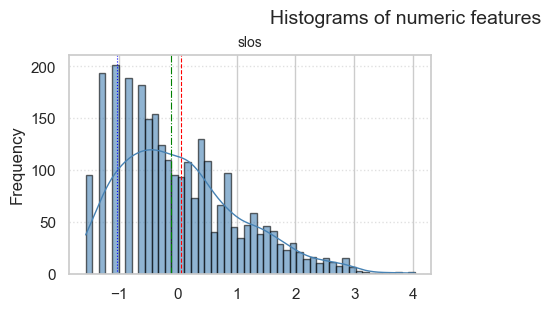

slos    0
dtype: int64

In [1230]:
# Check histograms again
plot_hist_grid(dft_std, ['slos'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos']
dft_std[check_cols].isnull().sum()

In [1231]:
X_test[['slos']] = dft_std[['slos']]

# **11. Model construction**

In [1232]:
RegModel = LinearRegression()
# Or you can find best hyperparameters using GridSearchCV
# Printing all the parameters of Linear regression
targets_vars = ['charges']

dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|race|dnr)_', col)]

predictors_var = ['slos', 'hospdead',
                  'num.co', 'diabetes', 'dementia', 'ca', 'sfdm2'] + dummy_cols


X_train=df_pp[predictors_var].values
y_train=df_pp[targets_vars].values

X_test=X_test[predictors_var].values
y_test=y_test[targets_vars].values


print(RegModel)

LinearRegression()


In [1233]:
LREG=RegModel.fit(X_train,y_train)

In [1234]:
# Printing some sample values of prediction
print("Training result prediction")
TrainingPrediction_array = LREG.predict(X_train)
TrainingPrediction=pd.DataFrame(TrainingPrediction_array, columns=['Predictedcharges']) # Convert to DataFrame
TrainingDataResults=pd.DataFrame(data=X_train, columns=predictors_var)
TrainingDataResults['charges']=y_train
TrainingDataResults['Predictedcharges']=TrainingPrediction['Predictedcharges'] # Assign from the DataFrame

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction
       slos hospdead num.co diabetes dementia ca sfdm2  \
0 -0.497725        0      2        0        0  0     1   
1 -0.828221        1      1        0        0  0     0   
2  0.677706        0      1        1        0  0     1   
3 -0.233829        0      1        0        0  2     0   
4  0.947025        0      1        0        0  2     2   

  dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF dzgroup_COPD  ... race_asian  \
0                     False        True        False  ...      False   
1                      True       False        False  ...      False   
2                      True       False        False  ...      False   
3                     False       False        False  ...      False   
4                     False       False        False  ...      False   

  race_black race_hispanic race_other race_white dnr_dnr after sadm  \
0      False         False      False       True              False   
1      False         False      False       True 

In [1235]:
TrainingDataResults['charges'] = np.expm1(TrainingDataResults['charges'])
TrainingDataResults['Predictedcharges'] = np.expm1(TrainingDataResults['Predictedcharges'])

print(TrainingDataResults[['charges', 'Predictedcharges'
                           ]].head())

     charges  Predictedcharges
0  12499.000      11012.847843
1   5435.000      31900.794840
2  54833.000      53950.988612
3   6285.047      11848.478313
4  20963.141      27182.377502


In [1236]:
LREG.coef_

array([[ 0.79165704,  0.68299227, -0.00550783, -0.08134211, -0.29722222,
        -0.08189407, -0.05225496,  0.13051921, -0.08905447, -0.09329472,
        -0.02217607, -0.02815051,  0.07013197, -0.14759413,  0.17961871,
         0.31013792, -0.20452525, -0.17574463,  0.07013197,  0.65136153,
        -0.39262607,  0.05124081,  0.01755534, -0.32753161,  0.00197333,
        -0.15379048,  0.15181716]])

In [1237]:
LREG.intercept_

array([10.23350095])

In [1238]:
LREG.n_features_in_

27

In [1239]:
# Printing some sample values of prediction
print("Testing result prediction")
TestingPrediction = LREG.predict(X_test)
TestingDataResults = pd.DataFrame(data=X_test, columns=predictors_var)
TestingDataResults['charges'] = y_test
TestingDataResults['Predictedcharges'] = TestingPrediction  # No rounding, keep decimals

# Printing sample prediction values
print(TestingDataResults.head())

Testing result prediction
       slos hospdead num.co diabetes dementia ca sfdm2  \
0 -0.014142        0      3        0        0  0     2   
1  0.338644        0      2        0        0  0     0   
2 -0.119403        0      4        1        0  0     3   
3  0.174046        0      2        0        0  0     0   
4  0.258918        0      1        0        0  2     1   

  dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF dzgroup_COPD  ... race_asian  \
0                     False       False         True  ...      False   
1                     False        True        False  ...      False   
2                      True       False        False  ...      False   
3                     False        True        False  ...      False   
4                     False       False        False  ...      False   

  race_black race_hispanic race_other race_white dnr_dnr after sadm  \
0      False         False      False       True               True   
1      False         False      False       True  

In [1240]:
TestingDataResults['charges'] = np.expm1(TestingDataResults['charges'])
TestingDataResults['Predictedcharges'] = np.expm1(TestingDataResults['Predictedcharges'])

print(TestingDataResults[['charges', 'Predictedcharges'
                           ]].head())

   charges  Predictedcharges
0   8417.0      13066.634525
1  71501.0      22499.227760
2  18040.0      25431.387259
3  20779.0      19750.317743
4  11291.0      16610.842917


In [1241]:
from sklearn import metrics
# Measuring Goodness of fit in Training data by R square
print('R2 Value of training set:',metrics.r2_score(y_train, LREG.predict(X_train)))
print('R2 Value of testing set:',metrics.r2_score(y_test, LREG.predict(X_test))) # Fixed: Removed [predictors_var]

R2 Value of training set: 0.7197053643513229
R2 Value of testing set: 0.7215247215392266


In [1242]:
#Measuring Goodness of fit in Training data by MAPE
TrainingDataResults['APE']=100 * ((abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))/TrainingDataResults['charges'])
MAPE_training=np.mean(TrainingDataResults['APE'])
RMSE_training = np.sqrt(np.mean((TrainingDataResults['charges']-TrainingDataResults['Predictedcharges'])**2))
MAE_training = np.mean(abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))

In [1243]:
print('MAPE on training data:', MAPE_training)
print('RMSE on training data:', RMSE_training)
print('MAE on training data:', MAE_training)
print('% difference between MAE and RMSE',(RMSE_training-MAE_training)*100/MAE_training)
print('Accuracy on training data:', 100-MAPE_training)

MAPE on training data: 58.06792577596044
RMSE on training data: 76211.84654097342
MAE on training data: 30435.780624938045
% difference between MAE and RMSE 150.40214174276187
Accuracy on training data: 41.93207422403956


In [1244]:
TestingDataResults['APE']=100 * ((abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))/TestingDataResults['charges'])
MAPE_testing=np.mean(TestingDataResults['APE'])
RMSE_testing = np.sqrt(np.mean((TestingDataResults['charges']-TestingDataResults['Predictedcharges'])**2))
MAE_testing = np.mean(abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))

In [1245]:
print('MAPE on test data:', MAPE_testing)
print('RMSE on test data:', RMSE_testing)
print('MAPE on test data:', MAPE_testing)
print('% difference between MAE and RMSE',(RMSE_testing-MAE_testing)*100/MAE_testing)
print('Accuracy on test data:', 100-MAPE_testing)

MAPE on test data: 58.64330929323414
RMSE on test data: 77345.71439024365
MAPE on test data: 58.64330929323414
% difference between MAE and RMSE 136.98219320550504
Accuracy on test data: 41.35669070676586


<Axes: title={'center': 'Actual vs Predected on training'}>

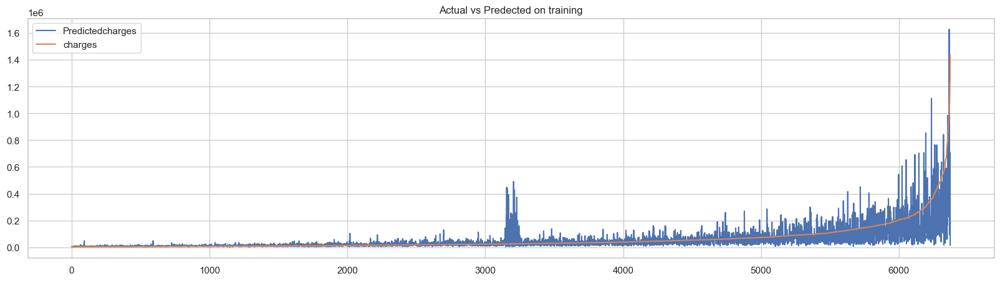

In [1246]:
(TrainingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Actual vs Predected on training")

<Axes: title={'center': 'Actual vs Predected on testing'}>

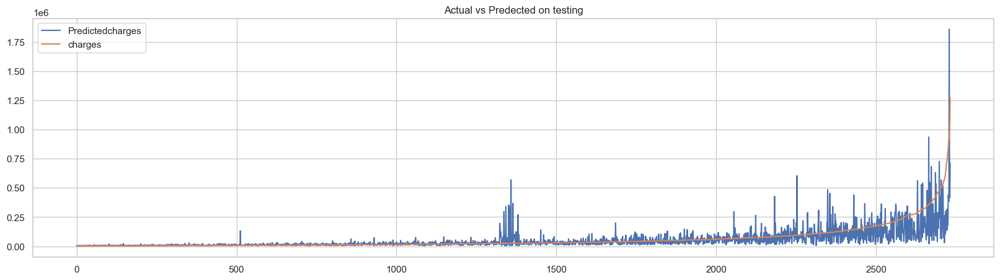

In [1247]:
(TestingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Actual vs Predected on testing")

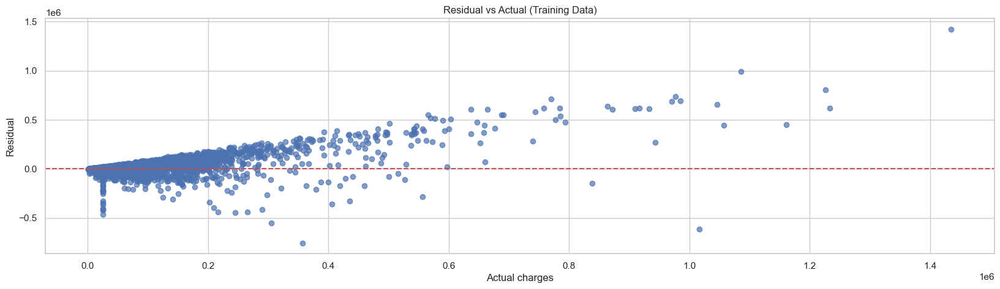

In [1248]:
Training_residual = TrainingDataResults['charges'] - TrainingDataResults['Predictedcharges']

# สร้าง scatter plot เพื่อแสดงความสัมพันธ์ระหว่าง Training_residual กับค่าจริง
plt.figure(figsize=(20, 5))
plt.scatter(TrainingDataResults['charges'], Training_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')  # เส้นแกน y=0 เพื่อให้เห็น Training_residual ที่ศูนย์
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

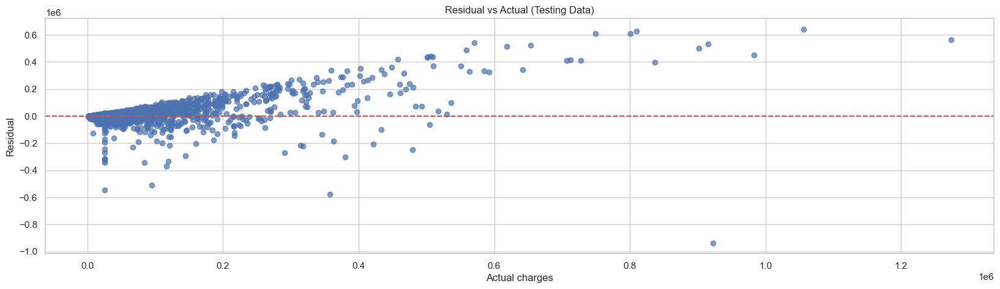

In [1249]:
Testing_residual = TestingDataResults['charges'] - TestingDataResults['Predictedcharges']

# สร้าง scatter plot เพื่อแสดงความสัมพันธ์ระหว่าง Testing_residual กับค่าจริง
plt.figure(figsize=(20, 5))
plt.scatter(TestingDataResults['charges'], Testing_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')  # เส้นแกน y=0 เพื่อให้เห็น Testing_residual ที่ศูนย์
plt.title('Residual vs Actual (Testing Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

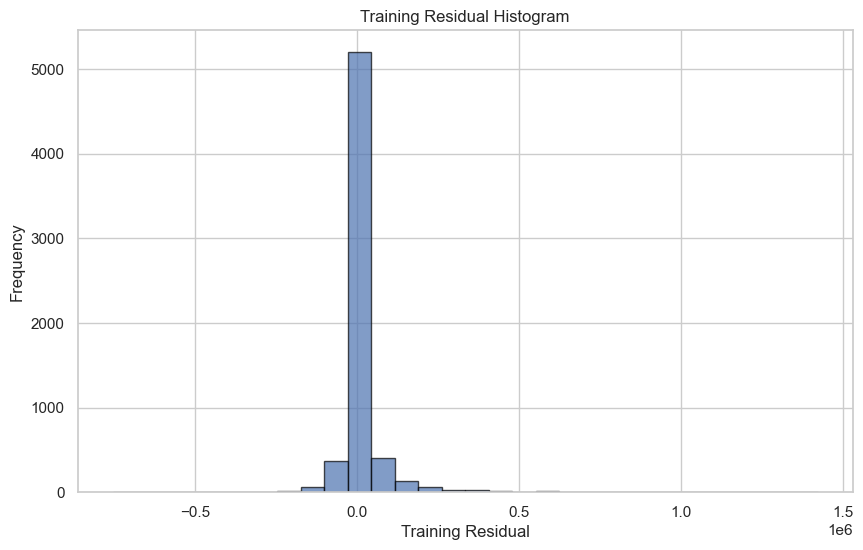

In [1250]:
# สร้าง histogram ของ residual
plt.figure(figsize=(10, 6))
plt.hist(Training_residual, bins=30, edgecolor='black', alpha=0.7)
plt.title('Training Residual Histogram')
plt.xlabel('Training Residual')
plt.ylabel('Frequency')
plt.show()

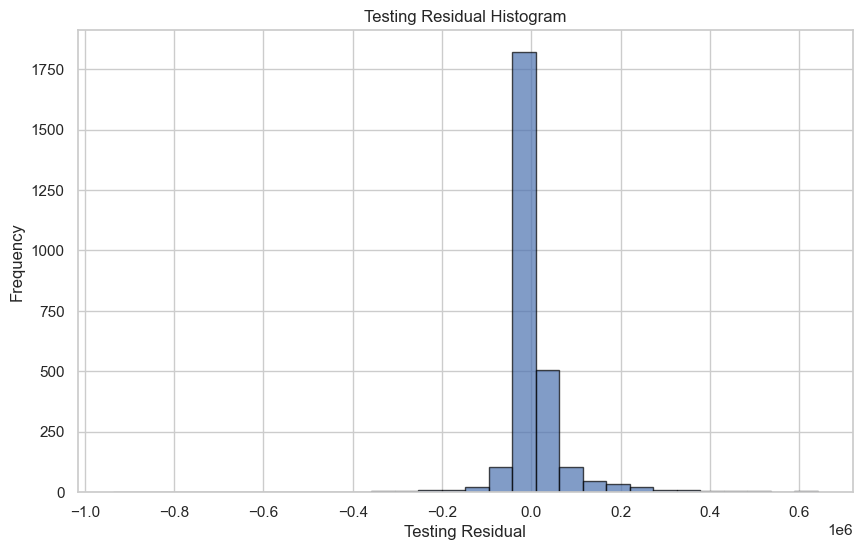

In [1251]:
# สร้าง histogram ของ residual
plt.figure(figsize=(10, 6))
plt.hist(Testing_residual, bins=30, edgecolor='black', alpha=0.7)
plt.title('Testing Residual Histogram')
plt.xlabel('Testing Residual')
plt.ylabel('Frequency')
plt.show()

# **12.**

## 3. Based on the accuracy, can the model be used in real situations?

### Model 1 (No Outlier Treatment)
- **MAE/RMSE:** Errors (~32,070 MAE and ~74,298 RMSE) are very high, showing large residuals.  
- **Accuracy:** Low accuracy (~41.54% testing) confirms poor predictive performance.  
- **Visual Analysis:**  
  - **Orange box:** Predictions follow the trend in the low–mid charge range, but the fit is weak.  
  - **Green box:** Local spikes appear where charges cluster around certain values, indicating the model cannot handle variance in this region.  
  - **Blue box:** At higher charges, the actual curve rises sharply (non-linear), while predictions flatten, leading to underestimation.  
- **Conclusion:** Model 1 is **not suitable for real-world use**. High errors, low accuracy, and poor performance in both clustered and non-linear regions make predictions unreliable.

---

### Model 2 (With Outlier Treatment)
- **MAE/RMSE:** Errors (~7,148 MAE and ~12,262 RMSE) are much lower, indicating smaller residuals and a tighter fit.  
- **Accuracy:** Higher accuracy (~68.15% testing) shows moderate predictive reliability.  
- **Visual Analysis:**  
  - **Orange box:** Predictions align closely with actual charges in the low–mid range → high accuracy for the majority of patients.  
  - **Blue box:** As charges rise steeply (non-linear), the model underpredicts, showing that a linear approach struggles at extreme values.  
- **Conclusion:** Model 2 is **usable in real-world scenarios**, especially in the low–mid charge range where most patients fall. However, predictions are less reliable at very high charges due to the non-linear pattern of costs.

---

### Quick Summary
➡ **Model 1:** Stable but inaccurate → not usable.  
➡ **Model 2:** Higher accuracy and lower error → usable in practice, but accuracy drops at extreme non-linear charges.  


# **13.**

## **13.1. Outlier treatment**

In [1325]:
# fetch dataset
support2 = fetch_ucirepo(id=880)  # SUPPORT2 Dataset
df = pd.concat([support2.data.original], axis=1)

In [1326]:
df_outlier = df.copy()
df_outlier.shape

(9105, 48)

In [1327]:
# Continuous variables
continuous_vars_for_outlier = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges'
]

# Categorical variables
categorical_vars_for_outlier = [
    'death', 'sex', 'hospdead', 'dzgroup', 'dzclass', 'num.co',
    'income', 'scoma', 'race', 'diabetes', 'dementia', 'ca',
    'dnr', 'adlp', 'adls', 'sfdm2'
]

In [1328]:
def remove_outliers_iqr(df_outlier, cols, whisker=1.5):
    """
    Remove rows where any value in cols lies outside IQR range [Q1 - whisker*IQR, Q3 + whisker*IQR].
    """
    mask = np.ones(len(df_outlier), dtype=bool)
    for col in cols:
        Q1 = df_outlier[col].quantile(0.25)
        Q3 = df_outlier[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - whisker * IQR
        upper = Q3 + whisker * IQR
        mask &= (df_outlier[col] >= lower) & (df_outlier[col] <= upper)
    return df_outlier.loc[mask].copy()

In [1329]:
def remove_outliers_zscore(df_outlier, cols, z_max=3.0):
    """
    Remove rows where any value in cols has |z-score| > z_max.
    """
    mask = np.ones(len(df_outlier), dtype=bool)
    for col in cols:
        mu = df_outlier[col].mean()
        sd = df_outlier[col].std(ddof=0)
        z = (df_outlier[col] - mu) / (sd if sd > 0 else 1e-8)
        mask &= (z.abs() <= z_max)
    return df_outlier.loc[mask].copy()

In [1330]:
def remove_rare_categories(df_outlier, cols, min_percent=0.01):
    """
    Replace categories that appear in less than min_percent of rows with '__OTHER__'.
    """
    n = len(df_outlier)
    for col in cols:
        freqs = df_outlier[col].value_counts(normalize=True)
        rare_cats = freqs[freqs < min_percent].index
        df_outlier = df_outlier.copy()
        df_outlier[col] = df_outlier[col].replace(rare_cats, "__OTHER__")
    return df_outlier

In [1331]:
df_outlier = remove_outliers_iqr(df_outlier, continuous_vars_for_outlier, whisker=1.5)
print("Shape after IQR removal:", df_outlier.shape) 

Shape after IQR removal: (611, 48)


In [1332]:
df_outlier = remove_outliers_zscore(df_outlier, continuous_vars_for_outlier, z_max=3.0)
print("Shape after Z-score removal:", df_outlier.shape)

Shape after Z-score removal: (525, 48)


In [1333]:
df_cat_clean = remove_rare_categories(df, categorical_vars_for_outlier, min_percent=0.01)
print("Shape after Rare catgories removal:",df_outlier.shape)

Shape after Rare catgories removal: (525, 48)


In [1334]:
leak_col = ['totcst', 'totmcst', 'sps', 'surv2m', 'surv6m', 'prg2m', 'prg6m']
df_outlier = df_outlier.drop(columns=leak_col)
print(df_outlier.shape)

(525, 41)


## **13.2. Missing Value treatment**

### **13.2.1. Missing values tratment for Continuous features**

#### **Check the missing values on continuous features**


In [1335]:
df_clean_2 = df_outlier.copy()
df_clean_2.shape

(525, 41)

In [1336]:
continuous_features = [
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges'
]

missing = df_clean_2[continuous_features].isnull().sum()
missing_percent = (missing / len(df_clean_2)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]
print(f"Numerical Features ({len(continuous_features)}): {continuous_features}")

         Missing Values  Percentage
age                   0         0.0
slos                  0         0.0
d.time                0         0.0
edu                   0         0.0
avtisst               0         0.0
aps                   0         0.0
hday                  0         0.0
dnrday                0         0.0
meanbp                0         0.0
wblc                  0         0.0
hrt                   0         0.0
resp                  0         0.0
temp                  0         0.0
pafi                  0         0.0
alb                   0         0.0
bili                  0         0.0
crea                  0         0.0
sod                   0         0.0
ph                    0         0.0
glucose               0         0.0
bun                   0         0.0
urine                 0         0.0
adlsc                 0         0.0
charges               0         0.0
Numerical Features (24): ['age', 'slos', 'd.time', 'edu', 'avtisst', 'aps', 'hday', 'dnrday', 'meanb

### **13.2.2. Missing values tratment for Categorical features**

#### **Removing the missing values**

##### **Check the missing values**

Remove values with more than 30% missing

In [1337]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income', 'scoma',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adlp', 'adls', 'sfdm2'],

missing = df_clean_2[categorical_features[0]].isnull().sum()
missing_percent = (missing / len(df_clean_2)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
adlp                 224       42.67
adls                 115       21.90
income               103       19.62
sfdm2                 50        9.52
dzgroup                0        0.00
death                  0        0.00
hospdead               0        0.00
sex                    0        0.00
scoma                  0        0.00
num.co                 0        0.00
dzclass                0        0.00
race                   0        0.00
ca                     0        0.00
dementia               0        0.00
diabetes               0        0.00
dnr                    0        0.00


In [1338]:
# features to drop if more than 30% missing
to_drop_cat = missing_table[missing_table['Percentage'] > 30].index.tolist()

# drop them from df_clean
df_clean_2 = df_clean_2.drop(columns=to_drop_cat)

print("Dropped categorical features:", to_drop_cat)
print("New shape:", df_clean_2.shape)


Dropped categorical features: ['adlp']
New shape: (525, 40)


In [1339]:
categorical_features = ['death', 'sex', 'hospdead', 'dzgroup',
          'dzclass', 'num.co', 'income', 'scoma',
          'race', 'diabetes', 'dementia', 'ca',
          'dnr', 'adls', 'sfdm2'],

#### **Filling the missing values**

Impute the missing values with MODE value for categorical variables

In [1340]:
mode_features = ['sfdm2','income','adls']
mode_dict = {col: df_clean_2[col].mode()[0] for col in mode_features}
df_clean_2[mode_features] = df_clean_2[mode_features].fillna(mode_dict)

In [1341]:
df_clean_2 = df_clean_2.drop(columns=df_clean_2.columns[0])
num_missing_cols = (df_clean_2.isnull().sum() > 0).sum()

print("Number of features with missing values:", num_missing_cols)
print("New shape:", df_clean_2.shape)

Number of features with missing values: 0
New shape: (525, 39)


In [1342]:
missing = df_clean_2.isnull().sum()
missing_percent = (missing / len(df_clean_2)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
age                    0         0.0
death                  0         0.0
sex                    0         0.0
hospdead               0         0.0
slos                   0         0.0
d.time                 0         0.0
dzgroup                0         0.0
dzclass                0         0.0
num.co                 0         0.0
edu                    0         0.0
income                 0         0.0
scoma                  0         0.0
charges                0         0.0
avtisst                0         0.0
race                   0         0.0
aps                    0         0.0
hday                   0         0.0
diabetes               0         0.0
dementia               0         0.0
ca                     0         0.0
dnr                    0         0.0
dnrday                 0         0.0
meanbp                 0         0.0
wblc                   0         0.0
hrt                    0         0.0
resp                   0         0.0
t

### **13.2.3. Visualization of Histograms and Boxplots After Missing Value Treatment**

Visualization with histograms and boxplots after missing value treatment helps confirm whether the imputation preserved the data’s distribution, spread, and outliers without introducing distortions.

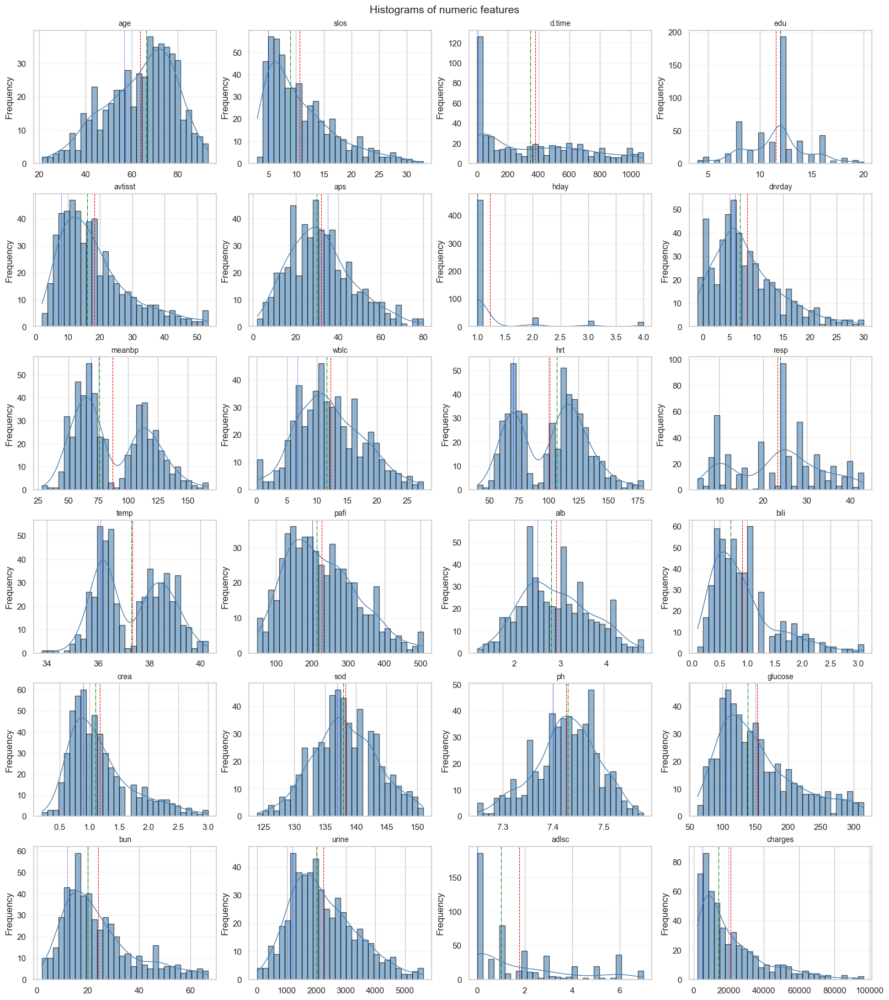

In [1343]:
plot_hist_grid(df_clean_2, continuous_features, bins=30, n_cols=4)

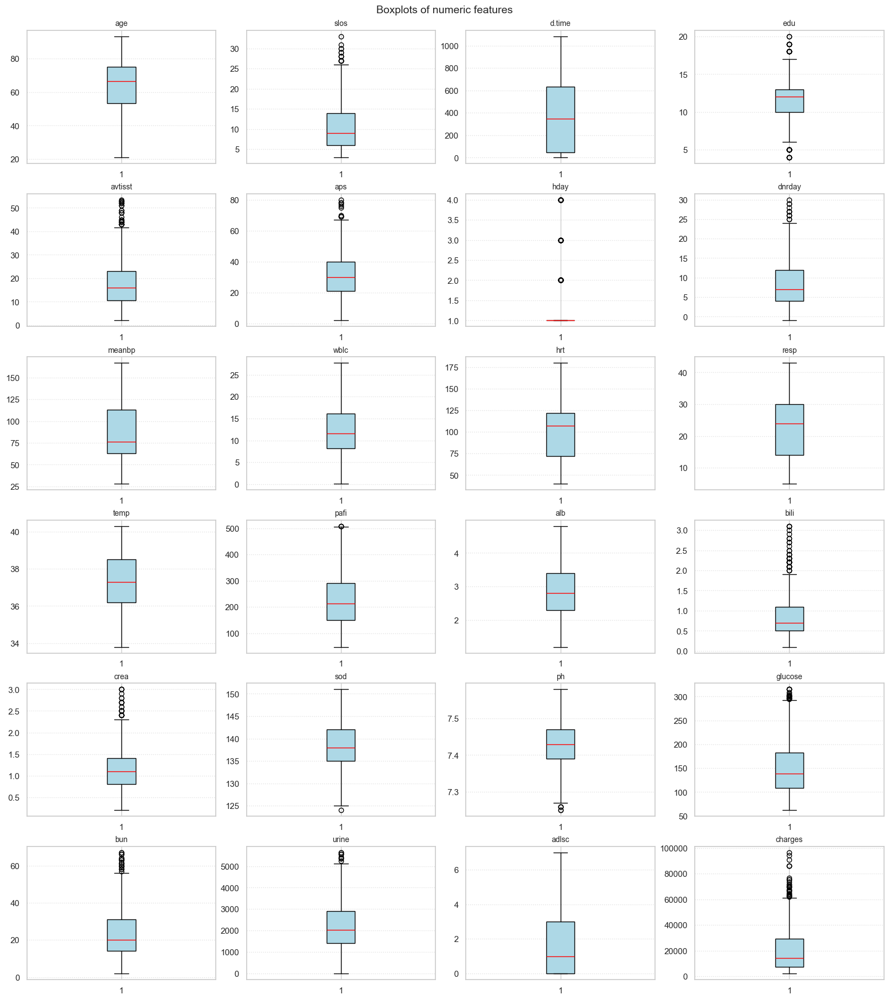

In [1411]:
plot_box_grid(df_clean_2, continuous_features, n_cols=4)

### **13.2.4. Training and Testing sample**
We do not use the full data for creating the model. Some data is randomly selected and kept aside for checking how good the model is. This is known as Testing Data and the remaining data is called Training data on which the model is built.

#### **Splitting the Data**
70% of data is used as Training data and the rest 30% is used as Tesing data.

In [1345]:
target_variables =  ['charges']
predictor_variables=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc' ,'charges','death', 'sex', 'hospdead',
    'dzgroup','dzclass', 'num.co', 'income',
    'scoma','race', 'diabetes', 'dementia',
    'ca','dnr', 'adls', 'sfdm2']


In [1346]:
X = df_clean_2[predictor_variables]
y = df_clean_2[target_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#### **Visualization of Training and Testing Data**
To confirm they follow similar distributions, ensuring the split was fair and that the model will be tested on data representative of what it learned during training.

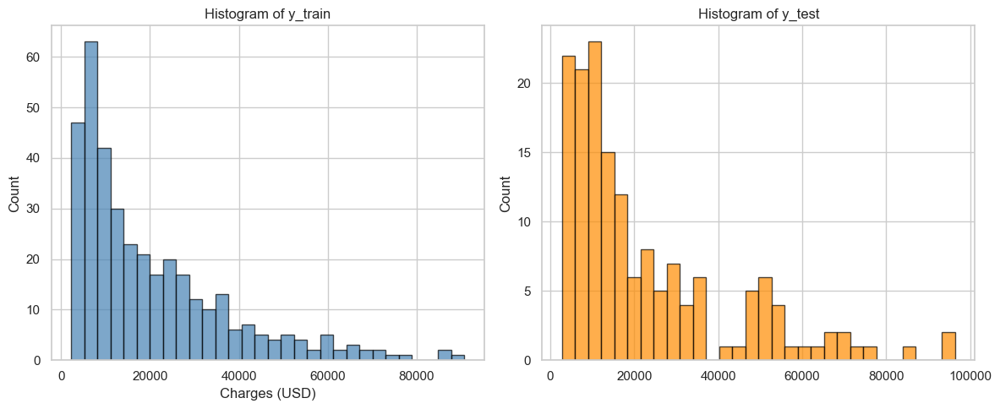

In [1347]:
import matplotlib.pyplot as plt

# Plot histograms for y_train and y_test
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(y_train, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_train")
plt.xlabel("Charges (USD)")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(y_test, bins=30, color="darkorange", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_test")
plt.ylabel("Charges (USD)")
plt.ylabel("Count")

plt.tight_layout()
plt.show()


The visualization of training and testing data shows similar distributions, confirming that the split is balanced and representative of the overall dataset.

In [1348]:
train_df = X_train.copy()
train_df["charges"] = y_train

test_df = X_test.copy()
test_df["charges"] = y_test

print(train_df.shape)
print(test_df.shape)

(367, 39)
(158, 39)


## **13.3. Feature selection by Visual correlation analysis and Statistical measurement**

In this case study the Target variable is Continuous, hence below two scenarios will be present

* Continuous Target Variable Vs Continuous Predictor
* Continuous Target Variable Vs Categorical Predictor

### **13.3.1. Relationship exploration: Continuous Vs Continuous -- Scatter Charts**

#### **Visual exploration**

In [1349]:
def plot_scatter_grid(train_df, x_cols, y_col, n_cols=3):
    n = len(x_cols)
    n_rows = ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols,
                             figsize=(5*n_cols, 4*n_rows),
                             constrained_layout=True)
    axes = axes.flatten()

    for i, col in enumerate(x_cols):
        axes[i].scatter(train_df[col], train_df[y_col], alpha=0.5,
                        color="steelblue", edgecolor="black")
        axes[i].set_title(f"{col} vs {y_col}", fontsize=9)
        axes[i].set_xlabel(col)
        axes[i].set_ylabel(y_col)
        axes[i].grid(linestyle=":", alpha=0.6)

    # hide any unused subplots
    for j in range(i+1, n_rows*n_cols):
        axes[j].set_visible(False)

    fig.suptitle(f"Scatter plots vs {y_col}", fontsize=14)
    plt.show()

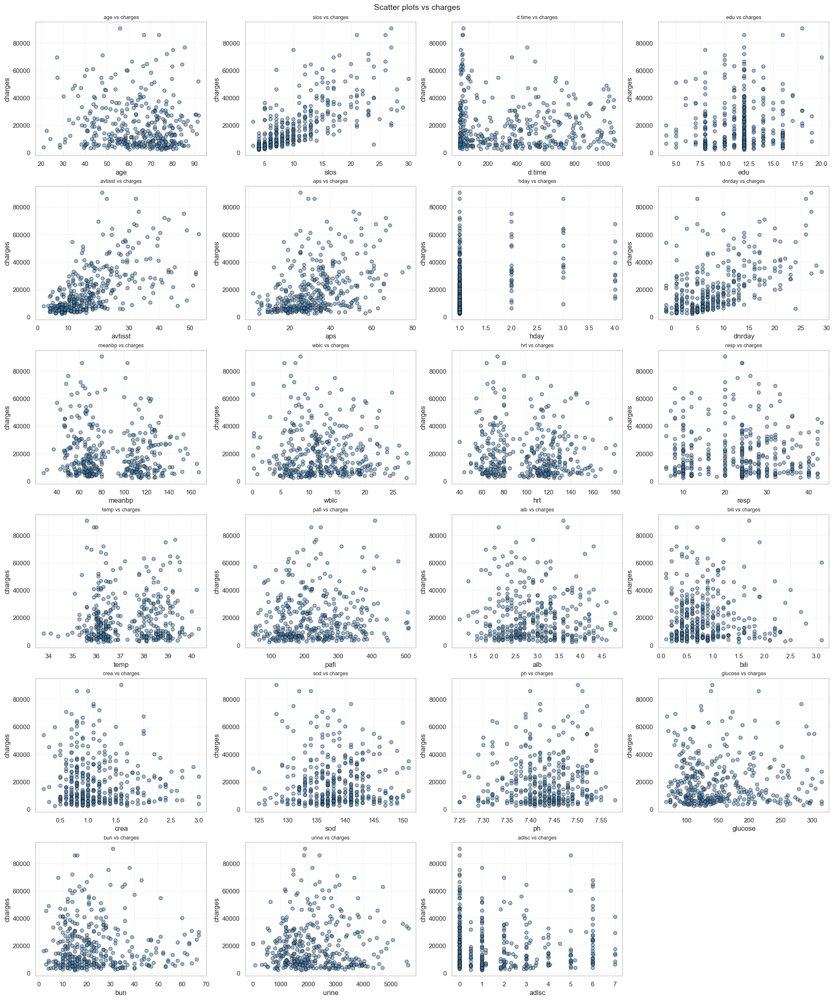

In [1350]:
plot_scatter_grid(train_df, x_cols=[
    'age', 'slos', 'd.time', 'edu','avtisst',
    'aps', 'hday','dnrday','meanbp', 'wblc',
    'hrt','resp','temp','pafi','alb', 'bili',
    'crea', 'sod','ph', 'glucose','bun', 'urine',
    'adlsc'
    ]
    ,y_col='charges', n_cols=4)



#### **Statistical Feature Selection**

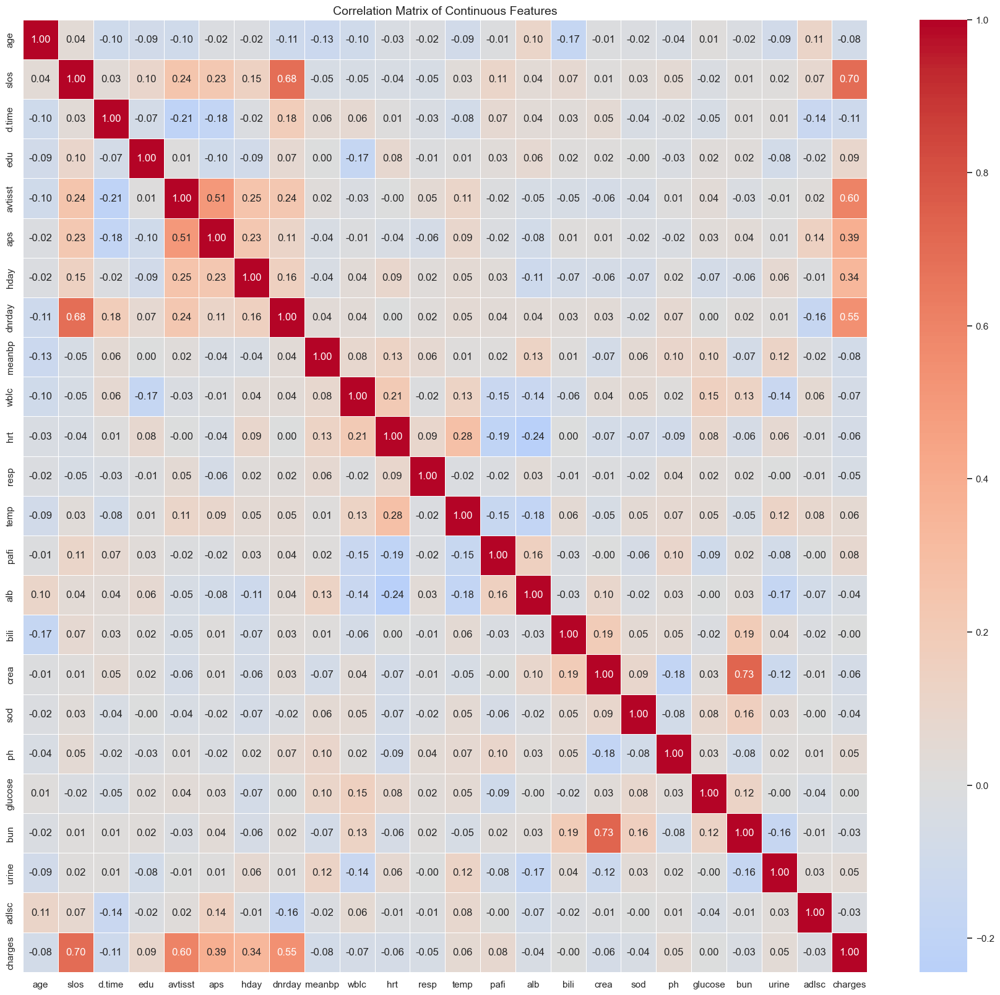

In [1351]:
# compute correlation matrix for continuous features
corr = train_df[continuous_features].corr()

# set up the plot
plt.figure(figsize=(22,20))
sns.heatmap(
    corr,
    annot=True,        # show correlation values
    fmt=".2f",         # format with 2 decimal places
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar=True
)
plt.title("Correlation Matrix of Continuous Features", fontsize=14)
plt.show()

In [1352]:
# Filtering only those columns where absolute correlation > 0.5 with Target Variable
# Adjust the threshold if no variable is selected
correlation_with_target = corr['charges']  # assuming 'charges' is the target variable
filtered_corr = correlation_with_target[abs(correlation_with_target) > 0.5]

# Display the filtered correlations
print(filtered_corr)

slos       0.701504
avtisst    0.602730
dnrday     0.545374
charges    1.000000
Name: charges, dtype: float64


### **13.3.2. Relationship exploration: Categorical Vs Continuous -- Box Plots**

#### **Visual exploration**

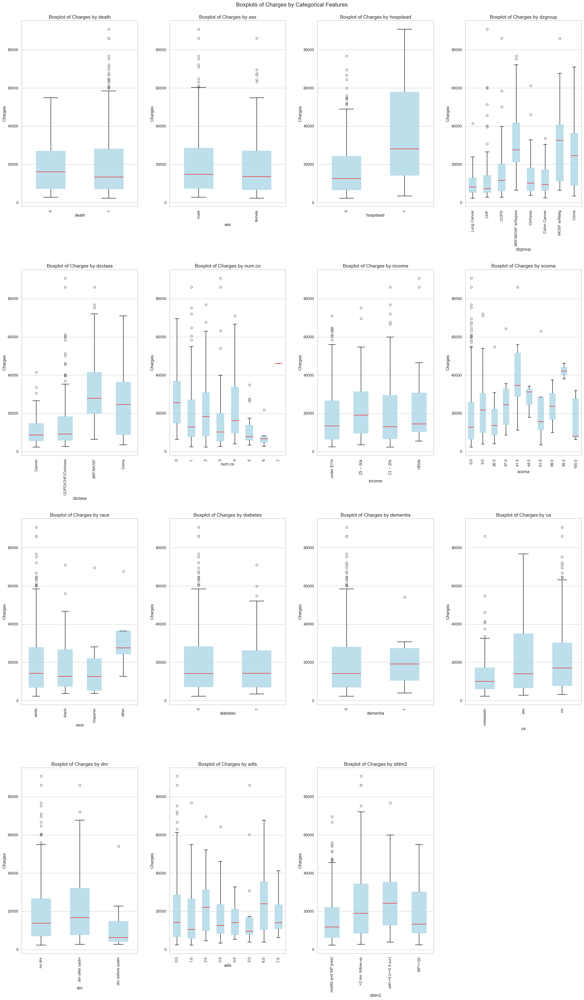

In [1353]:
# Calculate number of rows and columns for a 4x4 matrix
n_cols = 4
n_rows = (len(categorical_features[0]) + n_cols - 1) // n_cols  # Ensure enough rows for all plots
fig, PlotCanvas = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(n_cols * 6, n_rows * 10))
PlotCanvas = PlotCanvas.flatten()
sns.set(style="whitegrid")

# Creating box plots for each categorical feature against the Target Variable "charges"
for i, PredictorCol in enumerate(categorical_features[0]):
    sns.boxplot(data=train_df, x=PredictorCol, y="charges", ax=PlotCanvas[i], palette="Set2",
                width=0.5, fliersize=6, linewidth=1.2,
                boxprops=dict(facecolor="skyblue", color="lightblue", alpha=0.8),
                medianprops=dict(color="red"),
                whiskerprops=dict(color="black"),
                capprops=dict(color="black"))

    # Set plot title and labels with adjustments
    PlotCanvas[i].set_title(f'Boxplot of Charges by {PredictorCol}', fontsize=14)
    PlotCanvas[i].set_xlabel(PredictorCol, fontsize=12)
    PlotCanvas[i].set_ylabel('Charges', fontsize=12)
    PlotCanvas[i].tick_params(axis='x', rotation=90)  # Rotate x-axis labels for readability

# Hide any empty subplots (if there are more subplots than features)
for j in range(i + 1, len(PlotCanvas)):
    PlotCanvas[j].axis('off')

# Adjust layout and spacing to fit in Colab
plt.tight_layout(pad=3.0)  # Add padding between subplots
plt.suptitle('Boxplots of Charges by Categorical Features', fontsize=16, y=1)

# Show the plot
plt.show()

#### **Statistical Feature Selection**

In [1354]:
train_df['num_co_bin'] = pd.cut(train_df['num.co'], bins=[-1, 0, 1, 2, 3, 5, 10], labels=['0','1','2','3','4-5','6+'])

In [1355]:
import numpy as np
import pandas as pd
from scipy.stats import f_oneway

def anova_for_categoricals(
    input_data: pd.DataFrame,
    target_variable: str,
    categorical_features,
    *,
    alpha: float = 0.05,
    min_group_size: int = 2
):
    """
    Prints ANOVA result per categorical predictor and returns a list of significant predictors.
    - Treats numeric predictors as categorical by casting to string (except 'num.co', which is binned).
    - Skips predictors not found in the DataFrame or with any group < min_group_size.
    """
    # Flatten any nested lists/tuples and keep only strings
    flat = []
    for p in categorical_features:
        if isinstance(p, (list, tuple, np.ndarray)):
            flat.extend([q for q in p if isinstance(q, str)])
        elif isinstance(p, str):
            flat.append(p)

    # Keep only existing columns
    predictors = [p for p in flat if p in input_data.columns]
    dropped = [p for p in flat if p not in input_data.columns]
    if dropped:
        print(f"[info] Skipping non-existent columns: {dropped}")

    selected = []
    print("------- ANOVA Results -------\n")

    for predictor in predictors:
        # Drop rows missing predictor or target
        data = input_data.dropna(subset=[predictor, target_variable]).copy()
        if data.empty:
            print(f"{predictor} has no data after dropping NA, skipping.")
            continue

        # Special-case binning for 'num.co'
        if predictor == 'num.co':
            data[predictor] = pd.cut(
                data[predictor],
                bins=[-1, 0, 1, 2, 3, 5, np.inf],
                labels=['0','1','2','3','4-5','6+'],
                include_lowest=True,
                right=True
            )
        # Otherwise, if it's numeric, treat as categorical by casting to string
        elif pd.api.types.is_numeric_dtype(data[predictor]):
            data[predictor] = data[predictor].astype(str)
        else:
            data[predictor] = data[predictor].astype(str)

        # Group target by category
        groups = data.groupby(predictor)[target_variable].apply(list)

        # Ensure each group has enough samples
        if any(len(g) < min_group_size for g in groups):
            print(f"{predictor} still has a group with <{min_group_size} samples, skipping ANOVA.")
            continue

        # Run one-way ANOVA
        try:
            stat = f_oneway(*groups)
            p = stat.pvalue
            if p < alpha:
                print(f"{predictor} is significantly correlated with {target_variable} | P-Value: {p:.6g}")
                selected.append(predictor)
            else:
                print(f"{predictor} is NOT significantly correlated with {target_variable} | P-Value: {p:.6g}")
        except Exception as e:
            print(f"Error with {predictor}: {e}")

    return selected


In [1356]:
categorical_predictors = categorical_features

target_variable = 'charges'
significant_predictors = anova_for_categoricals(train_df, target_variable, categorical_predictors)
print("\nSignificant predictors:", significant_predictors)

------- ANOVA Results -------

death is NOT significantly correlated with charges | P-Value: 0.151041
sex is NOT significantly correlated with charges | P-Value: 0.419309
hospdead is significantly correlated with charges | P-Value: 4.89907e-12
dzgroup is significantly correlated with charges | P-Value: 1.32045e-19
dzclass is significantly correlated with charges | P-Value: 2.03498e-22
num.co is significantly correlated with charges | P-Value: 0.0151058
income is NOT significantly correlated with charges | P-Value: 0.151689
scoma is significantly correlated with charges | P-Value: 0.0234979
race is NOT significantly correlated with charges | P-Value: 0.324678
diabetes is NOT significantly correlated with charges | P-Value: 0.606932
dementia is NOT significantly correlated with charges | P-Value: 0.932217
ca is significantly correlated with charges | P-Value: 0.00195165
dnr is NOT significantly correlated with charges | P-Value: 0.110521
adls is NOT significantly correlated with charges 

## **13.4. Selecting final predictors for Machine Learning summary**

In [1357]:
SelectedColumns=['slos','avtisst','hospdead', 'dzgroup', 'dzclass', 'num.co', 'scoma', 'ca', 'sfdm2']

## **13.5. Data Preprocessing**

**Features Type**

---

 **Binary Features**
- **hospdead** – 0/1. Selected  

---

**Ordinal Features**
- **ca** – Ordinal (no < yes < metastatic). Selected  
- **sfdm2** – Ordinal (disability scale 1–5). Selected  

---

**Nominal Features**
- **dzgroup** – Detailed disease group. Selected  
- **dzclass** – Broad disease class. Selected  
- **num.co** – Integer count. Selected  
- **scoma** – Nominal. Selected  

---

 **Numerical Features**
- **slos** – Numeric. Selected  
- **avtisst** – Numeric. Selected  


### **13.5.1. Converting the ordinal variable to numeric**

In [1358]:
df_pp = train_df.copy()

In [1359]:
# Example mappings (adjust based on your dataset meaning)
ca_mapping = {
    "no": 0,
    "yes": 1,
    "metastatic": 2
}

sfdm2_mapping = {
    "<2 mo. follow-up": 0,
    "no(M2 and SIP pres)": 1,
    "adl>=4 (>=5 if sur)": 2,
    "SIP>=30": 3,
    "Coma or Intub": 4
}

# apply mappings for df.train
df_pp["ca"] = df_pp["ca"].map(ca_mapping)
df_pp["sfdm2"] = df_pp["sfdm2"].map(sfdm2_mapping)

# apply mappings for X_test
X_test["ca"] = X_test["ca"].map(ca_mapping)
X_test["sfdm2"] = X_test["sfdm2"].map(sfdm2_mapping)

### **13.5.2 Converting the binary nominal variable to numeric using 1/0 mapping**

In [1360]:
# List of binary features
binary_features = ['hospdead']
df_pp[binary_features].head()

,hospdead
7200,0
8765,0
2936,0
8684,0
7426,0


In [1361]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in df_pp.columns:
        # If already numeric, skip
        if df_pp[col].dtype == 'object':
            # Map common binary representations to 0/1
            df_pp[col] = df_pp[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            df_pp[col] = df_pp[col].astype(int)

# Verify conversion
df_pp[binary_features].head()

,hospdead
7200,0
8765,0
2936,0
8684,0
7426,0


In [1362]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in X_test.columns:
        # If already numeric, skip
        if X_test[col].dtype == 'object':
            # Map common binary representations to 0/1
            X_test[col] = X_test[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            X_test[col] = X_test[col].astype(int)

# Verify conversion
X_test[binary_features].head()

,hospdead
7172,0
7610,1
935,0
4976,0
2844,0


### **13.5.3. Converting the nominal variable to numeric using get_dummies()**

In [1363]:
# One-hot encode and merge into df_preprocessing
df_pp = pd.get_dummies(
    df_pp,
    columns=["dzgroup", "dzclass", "num.co", "scoma"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [1364]:
df_pp.filter(regex=r'^dzgroup_').head()

,dzgroup_ARF/MOSF w/Sepsis,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig
7200,False,False,False,False,False,False,True,False
8765,False,False,False,False,False,False,True,False
2936,False,True,False,False,False,False,False,False
8684,False,False,True,False,False,False,False,False
7426,False,True,False,False,False,False,False,False


In [1365]:
# Remove the binned helper column
if 'num_co_bin' in df_pp.columns:
    df_pp = df_pp.drop(columns=['num_co_bin'])

# Confirm it's gone
print(df_pp.filter(regex=r'^num.co_').head())


      num.co_0  num.co_1  num.co_2  num.co_3  num.co_4  num.co_5  num.co_6  \
7200     False     False      True     False     False     False     False   
8765     False     False      True     False     False     False     False   
2936     False     False     False     False     False      True     False   
8684     False     False     False      True     False     False     False   
7426     False      True     False     False     False     False     False   

      num.co_7  
7200     False  
8765     False  
2936     False  
8684     False  
7426     False  


In [1366]:
dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|num.co)_', col)]

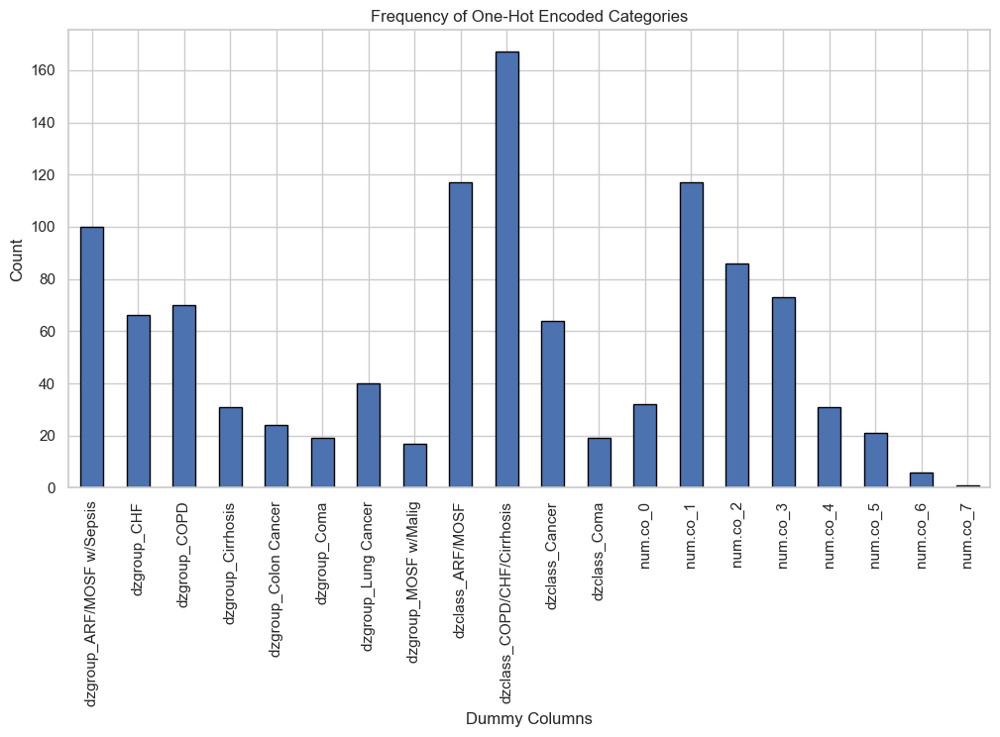

In [1367]:
# Count how many 1's in each dummy column
dummy_counts = df_pp[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

In [1368]:
# One-hot encode and merge into df_preprocessing
X_test = pd.get_dummies(
    X_test,
    columns=["dzgroup", "dzclass", "num.co", "scoma"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [1369]:
# Remove the binned helper column
if 'num_co_bin' in X_test.columns:
    X_test = X_test.drop(columns=['num_co_bin'])

# Confirm it's gone
print(X_test.filter(regex=r'^num.co_').head())


      num.co_0  num.co_1  num.co_2  num.co_3  num.co_4  num.co_5  num.co_6  \
7172     False     False     False      True     False     False     False   
7610     False     False      True     False     False     False     False   
935      False     False     False     False      True     False     False   
4976     False      True     False     False     False     False     False   
2844     False     False     False      True     False     False     False   

      num.co_8  
7172     False  
7610     False  
935      False  
4976     False  
2844     False  


In [1370]:
dummy_cols = [col for col in X_test.columns if re.match(r'^(dzgroup|dzclass|num.co)_', col)]

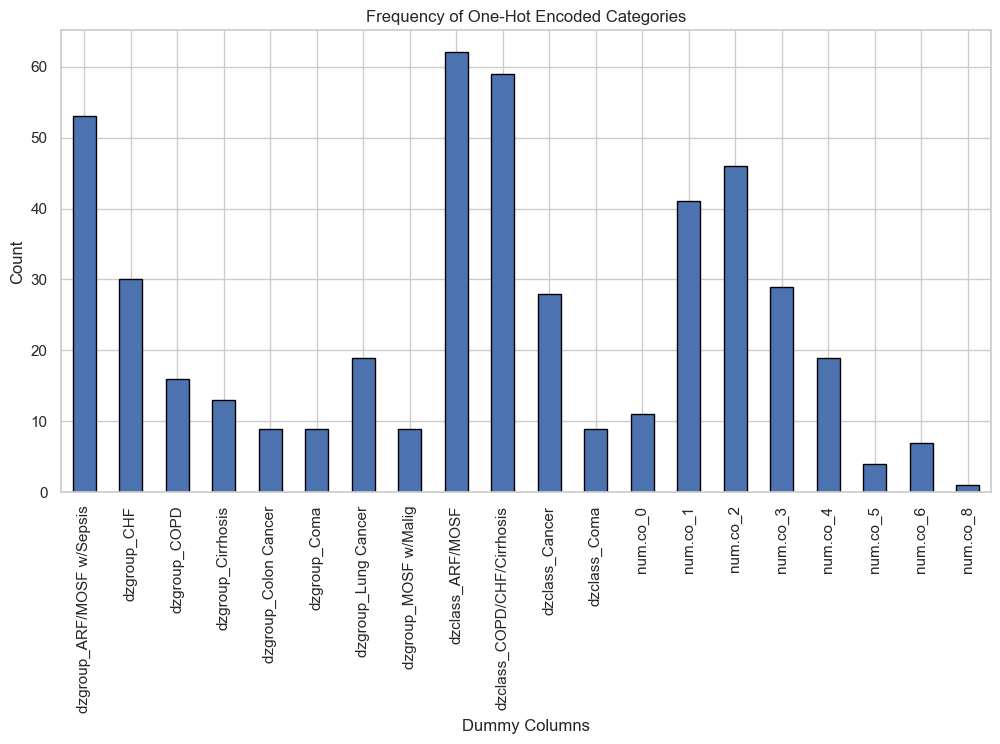

In [1371]:
# Count how many 1's in each dummy column
dummy_counts = X_test[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

### **13.5.4. Data Transformation**

#### **Transformation on Training Data**

##### **Fixing Skewness**

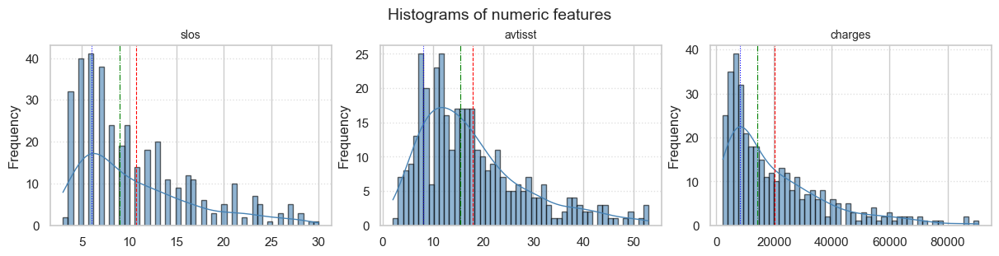

In [1372]:
plot_hist_grid(df_pp, ['slos','avtisst','charges'], bins=50, n_cols=3)

In [1373]:
# Copy to avoid messing up the original df_clean
df_skewfix = df_pp.copy()

In [1374]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    df_pp[col] = np.cbrt(df_pp[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','avtisst','charges']:
    # Add a small constant and handle potential negative values before log
    df_pp[col] = np.log1p(df_pp[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
df_pp.replace([np.inf, -np.inf], np.nan, inplace=True)

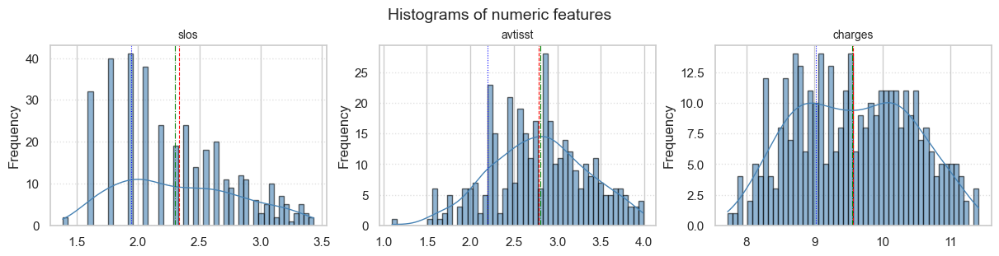

slos       0
avtisst    0
charges    0
dtype: int64

In [1375]:
# Check histograms again
plot_hist_grid(df_pp, ['slos','avtisst','charges'], bins=50, n_cols=3)
# Check missing values in transformed columns
check_cols = ['slos','avtisst','charges']
df_pp[check_cols].isnull().sum()

##### **Standardization**

In [1376]:
cols_to_standardize = ['slos','avtisst']
df_std = df_pp[cols_to_standardize].copy()

In [1377]:
from sklearn.preprocessing import StandardScaler

# create scaler
scaler = StandardScaler()

# fit + transform only the selected columns
df_std[cols_to_standardize] = scaler.fit_transform(df_std[cols_to_standardize])

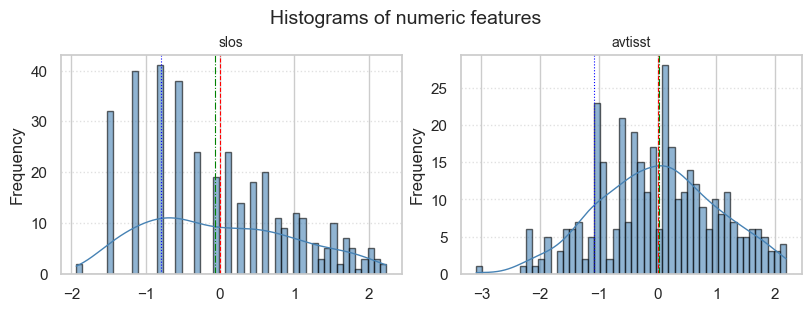

slos       0
avtisst    0
dtype: int64

In [1378]:
# Check histograms again
plot_hist_grid(df_std, ['slos','avtisst'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','avtisst']
df_std[check_cols].isnull().sum()

In [1379]:
print(df_std.head())
print(df_std.shape)

          slos   avtisst
7200 -1.107505  1.051385
8765 -0.521738 -1.541684
2936 -0.281913  0.181321
8684 -1.107505 -1.083205
7426 -1.478740 -1.298080
(367, 2)


In [1380]:
df_pp[cols_to_standardize] = df_std[cols_to_standardize]

#### **Transformation on Testing Data**


##### **Fixing Skewness**

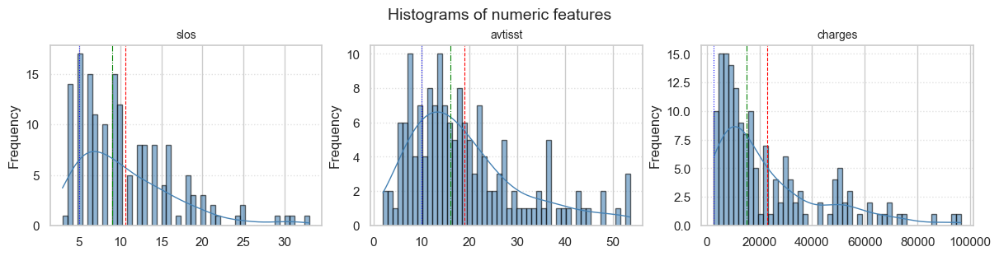

In [1381]:
plot_hist_grid(test_df, ['slos','avtisst','charges'], bins=50, n_cols=3)

In [1382]:
dft_skewfix = test_df.copy()

In [1383]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    dft_skewfix[col] = np.cbrt(dft_skewfix[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','avtisst','charges']:
    # Add a small constant and handle potential negative values before log
    dft_skewfix[col] = np.log1p(dft_skewfix[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
dft_skewfix.replace([np.inf, -np.inf], np.nan, inplace=True)

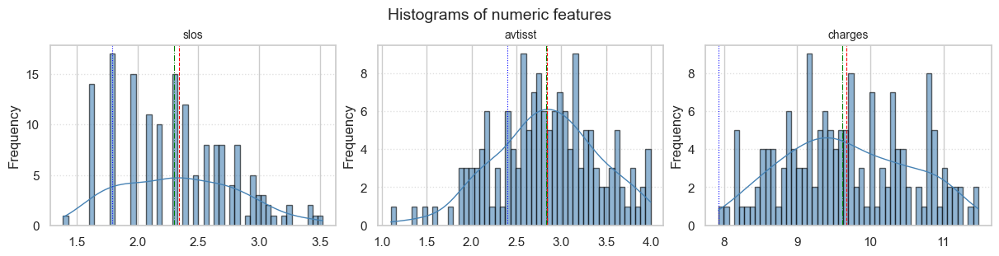

slos       0
avtisst    0
charges    0
dtype: int64

In [1384]:
# Check histograms again
plot_hist_grid(dft_skewfix, ['slos','avtisst','charges'], bins=50, n_cols=3)
# Check missing values in transformed columns
check_cols = ['slos','avtisst','charges']
dft_skewfix[check_cols].isnull().sum()

In [1385]:
X_test[['slos','avtisst']] = dft_skewfix[['slos','avtisst']]
y_test[['charges']] = dft_skewfix[['charges']]

##### **Standardization**

In [1386]:
dft_std = X_test[cols_to_standardize].copy()

In [1387]:
dft_std[cols_to_standardize] = scaler.transform(dft_std[cols_to_standardize])

print(dft_std.head())
print(dft_std.shape)

          slos   avtisst
7172 -0.067382 -1.822905
7610 -0.793629 -1.083205
935   0.758209  1.008957
4976  0.126684  0.129928
2844  1.013061  0.311684
(158, 2)


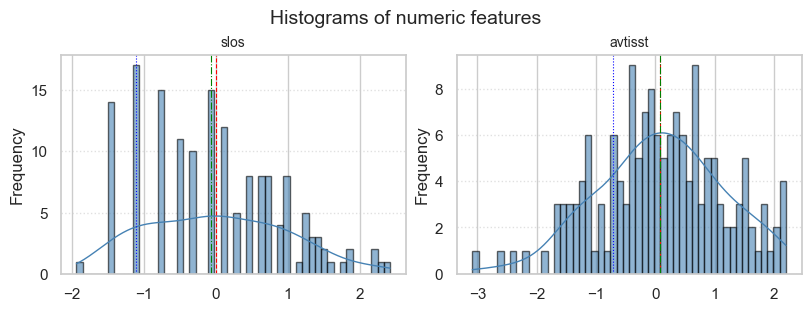

slos       0
avtisst    0
dtype: int64

In [1388]:
# Check histograms again
plot_hist_grid(dft_std, ['slos','avtisst'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos','avtisst']
dft_std[check_cols].isnull().sum()

In [1389]:
X_test[['slos','avtisst']] = dft_std[['slos','avtisst']]

## **13.5.5. Model construction**

In [1390]:
RegModel = LinearRegression()
# Or you can find best hyperparameters using GridSearchCV
# Printing all the parameters of Linear regression
targets_vars = ['charges']

dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|num.co|)_', col)]

predictors_var_train = ['slos','avtisst', 'hospdead',
                'ca', 'sfdm2'] + dummy_cols

dummy_cols = [col for col in X_test.columns if re.match(r'^(dzgroup|dzclass|num.co|)_', col)]

predictors_var_test = ['slos','avtisst', 'hospdead',
                'ca', 'sfdm2'] + dummy_cols

X_train=df_pp[predictors_var_train].values
y_train=df_pp[targets_vars].values

X_test=X_test[predictors_var_test].values
y_test=y_test[targets_vars].values


print(RegModel)

LinearRegression()


In [1391]:
LREG=RegModel.fit(X_train,y_train)

In [1392]:
# Printing some sample values of prediction
print("Training result prediction")
TrainingPrediction_array = LREG.predict(X_train)
TrainingPrediction=pd.DataFrame(TrainingPrediction_array, columns=['Predictedcharges']) # Convert to DataFrame
TrainingDataResults=pd.DataFrame(data=X_train, columns=predictors_var_train)
TrainingDataResults['charges']=y_train
TrainingDataResults['Predictedcharges']=TrainingPrediction['Predictedcharges'] # Assign from the DataFrame

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction
       slos   avtisst hospdead ca sfdm2 dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  \
0 -1.107505  1.051385        0  2     1                     False       False   
1 -0.521738 -1.541684        0  2     0                     False       False   
2 -0.281913  0.181321        0  1     1                     False        True   
3 -1.107505 -1.083205        0  0     1                     False       False   
4  -1.47874  -1.29808        0  0     1                     False        True   

  dzgroup_COPD dzgroup_Cirrhosis dzgroup_Colon Cancer  ... num.co_0 num.co_1  \
0        False             False                False  ...    False    False   
1        False             False                False  ...    False    False   
2        False             False                False  ...    False    False   
3         True             False                False  ...    False    False   
4        False             False                False  ...    False     True   

  num

In [1393]:
TrainingDataResults['charges'] = np.expm1(TrainingDataResults['charges'])
TrainingDataResults['Predictedcharges'] = np.expm1(TrainingDataResults['Predictedcharges'])

print(TrainingDataResults[['charges', 'Predictedcharges'
                           ]].head())

   charges  Predictedcharges
0   5674.0       9677.877951
1   4495.0       6108.256556
2  13773.0      10229.915932
3   3524.0       4888.913205
4   4054.0       4043.931390


In [1394]:
LREG.coef_

array([[ 0.52063674,  0.28450574,  0.30214141, -0.03708026,  0.02736932,
         0.0050268 , -0.03144175, -0.05009365, -0.00523566,  0.04472545,
        -0.06103168, -0.02477014,  0.12282063,  0.12784743, -0.08677107,
         0.01995531, -0.06103168,  0.09264579, -0.01838175, -0.04685301,
        -0.0644319 ,  0.05414237, -0.09736211, -0.20098457,  0.28122518]])

In [1395]:
LREG.intercept_

array([9.55364286])

In [1396]:
LREG.n_features_in_

25

In [1397]:
# Printing some sample values of prediction
print("Testing result prediction")
TestingPrediction = LREG.predict(X_test)
TestingDataResults = pd.DataFrame(data=X_test, columns=predictors_var_test)
TestingDataResults['charges'] = y_test
TestingDataResults['Predictedcharges'] = TestingPrediction  # No rounding, keep decimals

# Printing sample prediction values
print(TestingDataResults.head())

Testing result prediction
       slos   avtisst hospdead ca sfdm2 dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF  \
0 -0.067382 -1.822905        0  2     1                     False       False   
1 -0.793629 -1.083205        1  2     0                     False       False   
2  0.758209  1.008957        0  0     1                      True       False   
3  0.126684  0.129928        0  2     2                     False       False   
4  1.013061  0.311684        0  0     1                     False       False   

  dzgroup_COPD dzgroup_Cirrhosis dzgroup_Colon Cancer  ... num.co_0 num.co_1  \
0        False              True                False  ...    False    False   
1        False             False                False  ...    False    False   
2        False             False                False  ...    False    False   
3        False             False                False  ...    False     True   
4        False             False                False  ...    False    False   

  num.

In [1398]:
TestingDataResults['charges'] = np.expm1(TestingDataResults['charges'])
TestingDataResults['Predictedcharges'] = np.expm1(TestingDataResults['Predictedcharges'])

print(TestingDataResults[['charges', 'Predictedcharges'
                           ]].head())

   charges  Predictedcharges
0   7948.0       6611.415365
1   4879.0       8171.949957
2  94457.0      34537.652225
3  12666.0      14971.135561
4  31924.0      22260.853762


In [1399]:
from sklearn import metrics
# Measuring Goodness of fit in Training data by R square
print('R2 Value of training set:',metrics.r2_score(y_train, LREG.predict(X_train)))
print('R2 Value of testing set:',metrics.r2_score(y_test, LREG.predict(X_test))) # Fixed: Removed [predictors_var]

R2 Value of training set: 0.8043582599511373
R2 Value of testing set: 0.7621948905778951


In [1400]:
#Measuring Goodness of fit in Training data by MAPE
TrainingDataResults['APE']=100 * ((abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))/TrainingDataResults['charges'])
MAPE_training=np.mean(TrainingDataResults['APE'])
RMSE_training = np.sqrt(np.mean((TrainingDataResults['charges']-TrainingDataResults['Predictedcharges'])**2))
MAE_training = np.mean(abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))

In [1401]:
print('MAPE on training data:', MAPE_training)
print('RMSE on training data:', RMSE_training)
print('MAE on training data:', MAE_training)
print('% difference between MAE and RMSE',(RMSE_training-MAE_training)*100/MAE_training)
print('Accuracy on training data:', 100-MAPE_training)

MAPE on training data: 30.477590702037674
RMSE on training data: 8925.636360085196
MAE on training data: 5654.711903279041
% difference between MAE and RMSE 57.844228189758354
Accuracy on training data: 69.52240929796233


In [1402]:
TestingDataResults['APE']=100 * ((abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))/TestingDataResults['charges'])
MAPE_testing=np.mean(TestingDataResults['APE'])
RMSE_testing = np.sqrt(np.mean((TestingDataResults['charges']-TestingDataResults['Predictedcharges'])**2))
MAE_testing = np.mean(abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))

In [1403]:
print('MAPE on test data:', MAPE_testing)
print('RMSE on test data:', RMSE_testing)
print('MAPE on test data:', MAPE_testing)
print('% difference between MAE and RMSE',(RMSE_testing-MAE_testing)*100/MAE_testing)
print('Accuracy on test data:', 100-MAPE_testing)

MAPE on test data: 32.05408402050877
RMSE on test data: 12202.783232853853
MAPE on test data: 32.05408402050877
% difference between MAE and RMSE 70.61691649064846
Accuracy on test data: 67.94591597949123


<Axes: title={'center': 'Actual vs Predected on training'}>

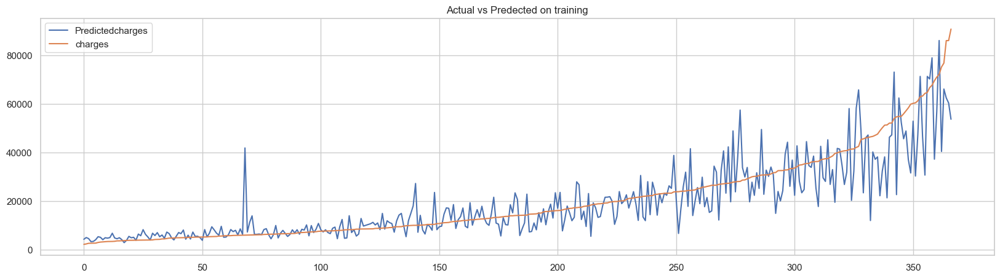

In [1404]:
(TrainingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Actual vs Predected on training")

<Axes: title={'center': 'Actual vs Predected on testing'}>

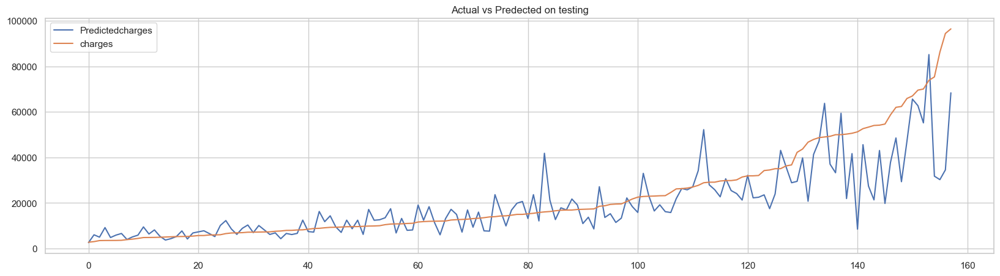

In [1405]:
(TestingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Actual vs Predected on testing")

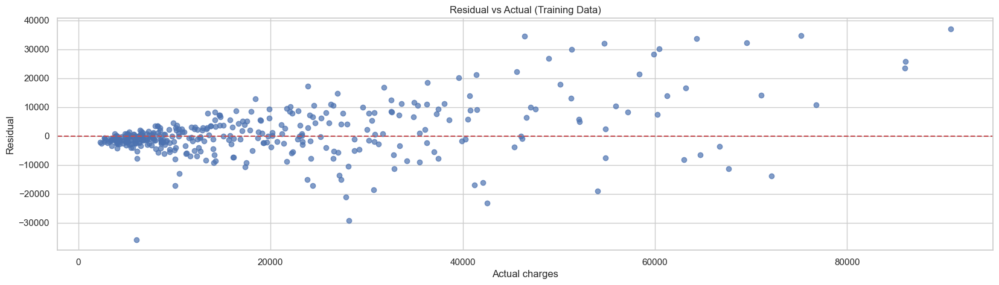

In [1406]:
Training_residual = TrainingDataResults['charges'] - TrainingDataResults['Predictedcharges']

# สร้าง scatter plot เพื่อแสดงความสัมพันธ์ระหว่าง Training_residual กับค่าจริง
plt.figure(figsize=(20, 5))
plt.scatter(TrainingDataResults['charges'], Training_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')  # เส้นแกน y=0 เพื่อให้เห็น Training_residual ที่ศูนย์
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

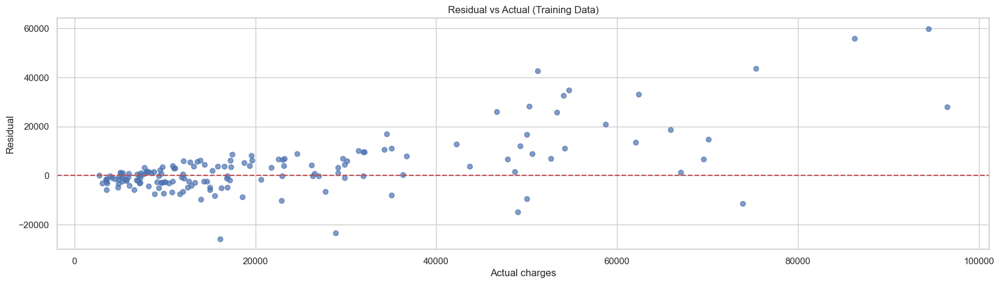

In [1407]:
Testing_residual = TestingDataResults['charges'] - TestingDataResults['Predictedcharges']

# สร้าง scatter plot เพื่อแสดงความสัมพันธ์ระหว่าง Testing_residual กับค่าจริง
plt.figure(figsize=(20, 5))
plt.scatter(TestingDataResults['charges'], Testing_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')  # เส้นแกน y=0 เพื่อให้เห็น Testing_residual ที่ศูนย์
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

# **14.**

## **14.1. Outlier treatment**

In [ ]:
support2 = fetch_ucirepo(id=880)  # SUPPORT2 Dataset
df = pd.concat([support2.data.original], axis=1)

In [ ]:
df_outlier = df[SelectedColumns].copy()
df_outlier.shape

(9105, 13)

In [ ]:
continuous_vars_for_outlier = [
    'charges'
]

# Categorical variables
categorical_vars_for_outlier = [
]

In [ ]:
def remove_outliers_iqr(df_outlier, cols, whisker=1.5):
    """
    Remove rows where any value in cols lies outside IQR range [Q1 - whisker*IQR, Q3 + whisker*IQR].
    """
    mask = np.ones(len(df_outlier), dtype=bool)
    for col in cols:
        Q1 = df_outlier[col].quantile(0.25)
        Q3 = df_outlier[col].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - whisker * IQR
        upper = Q3 + whisker * IQR
        mask &= (df_outlier[col] >= lower) & (df_outlier[col] <= upper)
    return df_outlier.loc[mask].copy()

In [ ]:
def remove_outliers_zscore(df_outlier, cols, z_max=3.0):
    """
    Remove rows where any value in cols has |z-score| > z_max.
    """
    mask = np.ones(len(df_outlier), dtype=bool)
    for col in cols:
        mu = df_outlier[col].mean()
        sd = df_outlier[col].std(ddof=0)
        z = (df_outlier[col] - mu) / (sd if sd > 0 else 1e-8)
        mask &= (z.abs() <= z_max)
    return df_outlier.loc[mask].copy()

In [ ]:
def remove_rare_categories(df_outlier, cols, min_percent=0.01):
    """
    Replace categories that appear in less than min_percent of rows with '__OTHER__'.
    """
    n = len(df_outlier)
    for col in cols:
        freqs = df_outlier[col].value_counts(normalize=True)
        rare_cats = freqs[freqs < min_percent].index
        df_outlier[col] = df_outlier[col].replace(rare_cats, "__OTHER__")
    return df_outlier

In [ ]:
df_outlier = remove_outliers_iqr(df_outlier, continuous_vars_for_outlier, whisker=1.5)
print("Shape after IQR removal:", df_outlier.shape) 

Shape after IQR removal: (7731, 13)


In [ ]:
df_outlier = remove_outliers_zscore(df_outlier, continuous_vars_for_outlier, z_max=3.0)
print("Shape after Z-score removal:", df_outlier.shape)

Shape after Z-score removal: (7464, 13)


In [ ]:
df_cat_clean = remove_rare_categories(df, categorical_vars_for_outlier, min_percent=0.01)
print("Shape after Rare catgories removal:",df_outlier.shape)

Shape after Rare catgories removal: (7464, 13)


## **14.2. Missing value treatment**

If a column has more than 30% data missing, then missing value treatment cannot be done. That column must be rejected because too much information is missing.

There are below options for treating missing values in data.
* Impute the missing values with MEAN or MEDIAN value for continuous variables
* Impute the missing values with MODE value for categorical variables

In [ ]:
df_clean_3 = df_outlier.copy()
df_clean_3.shape

(7464, 13)

### **14.2.1. Missing values tratment for Continuous features**

#### **Check the missing values on continuous features**


In [ ]:
continuous_features = [
    'slos','charges'
]

missing = df[continuous_features].isnull().sum()
missing_percent = (missing / len(df)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

         Missing Values  Percentage
charges             172        1.89
slos                  0        0.00


#### **Fill missing values with median**

In [ ]:
# choose the columns you care about
cols_to_check = continuous_features  # your list

# build missing table on the original df
missing = df[cols_to_check].isnull().sum()
missing_percent = (missing / len(df)) * 100
missing_table = pd.DataFrame({
    "Missing Values": missing,
    "Percentage": missing_percent
})

# pick columns with 0% < missing < 30%
mask = (missing_table["Missing Values"] > 0) & (missing_table["Percentage"] < 30)
to_impute = missing_table.index[mask].tolist()

# fill with column medians and merge into df_clean
medians = df_clean_3[to_impute].median()
df_clean_3[to_impute] = df_clean_3[to_impute].fillna(medians)

# quick sanity check (shows only any leftovers)
print("Imputed (median):", to_impute)
print(df_clean_3[to_impute].isnull().sum()[lambda s: s > 0])

Imputed (median): ['charges']
Series([], dtype: int64)


#### **Result after missing values treatment for continuous features**

In [ ]:
missing_clean = df_clean_3[continuous_features].isnull().sum()
missing_percent_clean = (missing_clean / len(df_clean_3[continuous_features])) * 100

missing_table_clean = pd.DataFrame({
    'Missing Values': missing_clean,
    'Percentage': missing_percent_clean.round(2)
})
print(missing_table_clean.sort_values(by="Percentage", ascending=False))

missing_table_clean = missing_table_clean[missing_table_clean['Missing Values'] > 0]

         Missing Values  Percentage
slos                  0         0.0
charges               0         0.0


### **14.2.2. Missing values tratment for Categorical features**

#### **Check the missing values on continuous features**

In [ ]:
categorical_features = [
    'hospdead', 'dzgroup', 'dzclass',
    'num.co', 'scoma', 'race', 'diabetes',
    'dementia', 'ca', 'dnr', 'sfdm2'
]

missing = df_clean_3[categorical_features].isnull().sum()
missing_percent = (missing / len(df_clean_3)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
sfdm2               1105       14.80
race                  38        0.51
dnr                    3        0.04
dzclass                0        0.00
dzgroup                0        0.00
hospdead               0        0.00
num.co                 0        0.00
diabetes               0        0.00
scoma                  0        0.00
ca                     0        0.00
dementia               0        0.00


#### **Filling the missing values**

Impute the missing values with MODE value for categorical variables

In [ ]:
mode_features = ['sfdm2','race','dnr']
mode_dict = {col: df_clean_3[col].mode()[0] for col in mode_features}
df_clean_3[mode_features] = df_clean_3[mode_features].fillna(mode_dict)

In [ ]:
missing = df_clean_3[categorical_features].isnull().sum()
missing_percent = (missing / len(df_clean_3)) * 100

missing_table = pd.DataFrame({
    'Missing Values': missing,
    'Percentage': missing_percent.round(2)
})
print(missing_table.sort_values(by="Percentage", ascending=False))

missing_table = missing_table[missing_table['Missing Values'] > 0]

          Missing Values  Percentage
hospdead               0         0.0
dzgroup                0         0.0
dzclass                0         0.0
num.co                 0         0.0
scoma                  0         0.0
race                   0         0.0
diabetes               0         0.0
dementia               0         0.0
ca                     0         0.0
dnr                    0         0.0
sfdm2                  0         0.0


### **14.2.3. Visualization of Histograms and Boxplots After Missing Value Treatment**

Visualization with histograms and boxplots after missing value treatment helps confirm whether the imputation preserved the data’s distribution, spread, and outliers without introducing distortions.

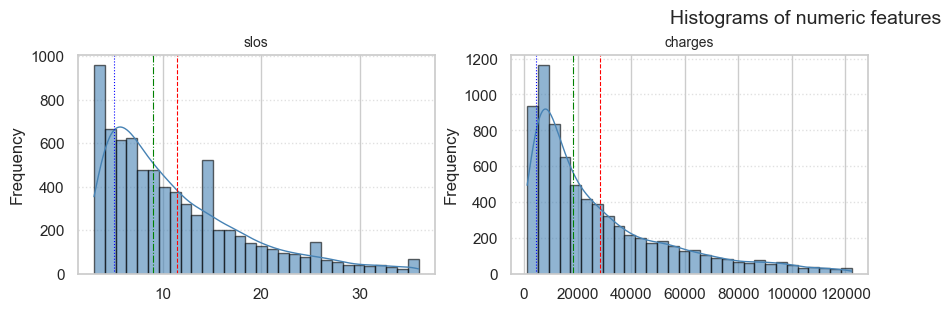

In [ ]:
plot_hist_grid(df_clean_3, continuous_features, bins=30, n_cols=4)

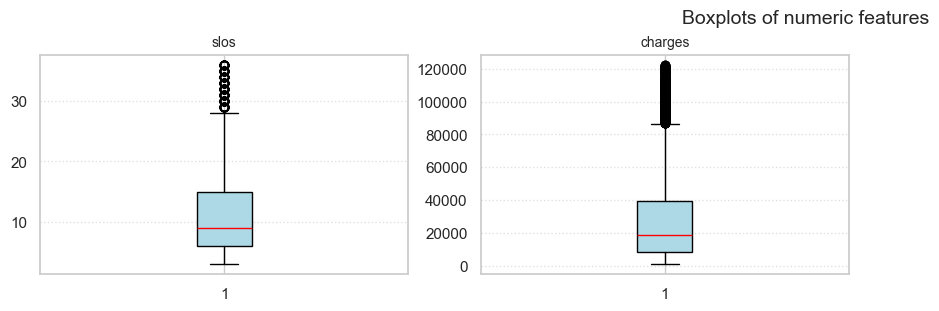

In [ ]:
plot_box_grid(df_clean_3, continuous_features, n_cols=4)

### **14.2.4. Training and Testing sample**
We do not use the full data for creating the model. Some data is randomly selected and kept aside for checking how good the model is. This is known as Testing Data and the remaining data is called Training data on which the model is built.
#### **Splitting the Data**
70% of data is used as Training data and the rest 30% is used as Tesing data.

In [ ]:
target_variables =  ['charges']
predictor_variables=[
    'slos','hospdead', 'dzgroup',
    'dzclass', 'num.co', 'scoma',
    'race', 'diabetes', 'dementia',
    'ca', 'dnr', 'sfdm2']


X = df_clean_3[predictor_variables]
y = df_clean_3[target_variables]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

#### **Visualization of Training and Testing Data**
To confirm they follow similar distributions, ensuring the split was fair and that the model will be tested on data representative of what it learned during training.

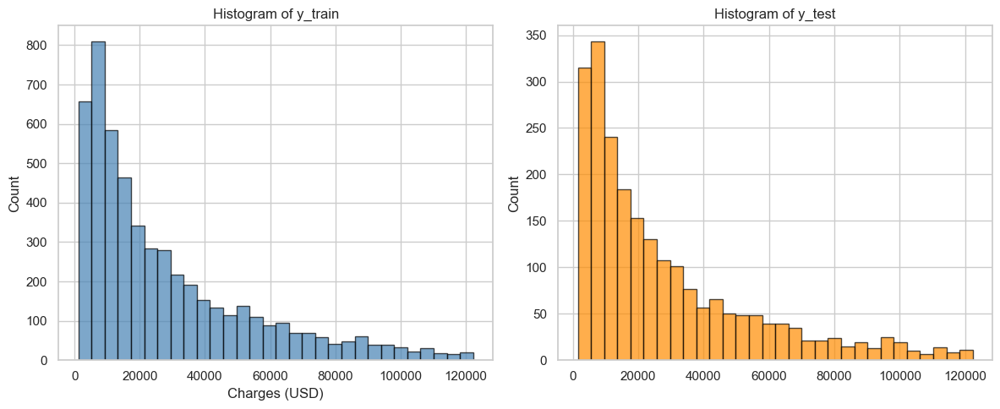

In [ ]:
# Plot histograms for y_train and y_test
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(y_train, bins=30, color="steelblue", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_train")
plt.xlabel("Charges (USD)")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(y_test, bins=30, color="darkorange", edgecolor="black", alpha=0.7)
plt.title("Histogram of y_test")
plt.ylabel("Charges (USD)")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

In [ ]:
train_df = X_train.copy()
train_df["charges"] = y_train

test_df = X_test.copy()
test_df["charges"] = y_test

print(train_df.shape)
print(test_df.shape)

(5224, 13)
(2240, 13)


## **14.5. Data Preprocessing**
**Features Type**

---

 **Binary Features**
- **hospdead** – 0/1. Selected  
- **diabetes** – 0/1. Selected  
- **dementia** – 0/1. Selected  

---

**Ordinal Features**
- **ca** – Ordinal (no < yes < metastatic). Selected  
- **sfdm2** – Ordinal (disability scale 1–5). Selected  

---

**Nominal Features**
- **dzgroup** – Detailed disease group. Selected  
- **dzclass** – Broad disease class. Selected  
- **num.co** – Integer count. Selected  
- **scoma** – Nominal. Selected  
- **race** – Nominal. Selected  
- **dnr** – Nominal. Selected  

---

 **Numerical Features**
- **slos** – Numeric. Selected  


### **14.5.1. Converting the ordinal variable to numeric**

In [ ]:
df_pp = train_df.copy()

In [ ]:
# Example mappings (adjust based on your dataset meaning)
ca_mapping = {
    "no": 0,
    "yes": 1,
    "metastatic": 2
}

sfdm2_mapping = {
    "<2 mo. follow-up": 0,
    "no(M2 and SIP pres)": 1,
    "adl>=4 (>=5 if sur)": 2,
    "SIP>=30": 3,
    "Coma or Intub": 4
}

# apply mappings for df.train
df_pp["ca"] = df_pp["ca"].map(ca_mapping)
df_pp["sfdm2"] = df_pp["sfdm2"].map(sfdm2_mapping)

# apply mappings for X_test
X_test["ca"] = X_test["ca"].map(ca_mapping)
X_test["sfdm2"] = X_test["sfdm2"].map(sfdm2_mapping)

In [ ]:
print(df_pp[["ca", "sfdm2"]].head())
print(X_test[["ca", "sfdm2"]].head())

      ca  sfdm2
4600   0      1
7027   0      0
3094   0      0
3655   2      0
360    0      1
      ca  sfdm2
2949   0      0
7541   0      0
2778   0      1
6939   0      1
8030   2      1


### **14.5.2. Converting the binary nominal variable to numeric using 1/0 mapping**

In [ ]:
# List of binary features
binary_features = ['hospdead', 'diabetes', 'dementia']
df_pp[binary_features].head()

,hospdead,diabetes,dementia
4600,0,0,0
7027,1,0,0
3094,1,0,0
3655,0,0,0
360,0,0,0


In [ ]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in df_pp.columns:
        # If already numeric, skip
        if df_pp[col].dtype == 'object':
            # Map common binary representations to 0/1
            df_pp[col] = df_pp[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            df_pp[col] = df_pp[col].astype(int)

# Verify conversion
df_pp[binary_features].head()

,hospdead,diabetes,dementia
4600,0,0,0
7027,1,0,0
3094,1,0,0
3655,0,0,0
360,0,0,0


In [ ]:
# Convert binary nominal features to numeric (0/1)
for col in binary_features:
    # Check if column exists in the dataframe
    if col in X_test.columns:
        # If already numeric, skip
        if X_test[col].dtype == 'object':
            # Map common binary representations to 0/1
            X_test[col] = X_test[col].map({'No': 0, 'Yes': 1, 'no': 0, 'yes': 1, '0': 0, '1': 1})
        else:
            # Ensure numeric type
            X_test[col] = X_test[col].astype(int)

# Verify conversion
X_test[binary_features].head()

,hospdead,diabetes,dementia
2949,0,0,0
7541,1,1,0
2778,0,0,0
6939,0,0,0
8030,0,0,0


### **14.5.3. Converting the nominal variable to numeric using get_dummies()**

In [ ]:
# Count how many 1's in each dummy column

df_pp = pd.get_dummies(
    df_pp,
    columns=["dzgroup", "dzclass", "scoma", "race", "dnr"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [ ]:
dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|scoma|race|dnr)_', col)]

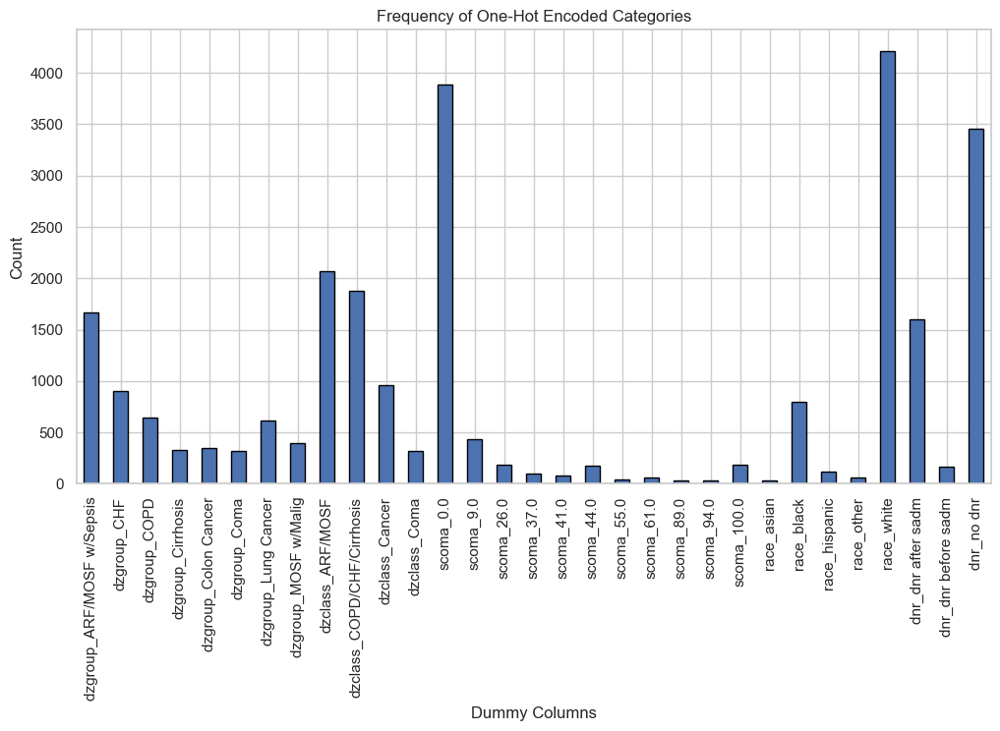

In [ ]:
dummy_counts = df_pp[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

In [ ]:
# One-hot encode and merge into df_preprocessing
X_test = pd.get_dummies(
    X_test,
    columns=["dzgroup", "dzclass", "scoma", "race", "dnr"],
    drop_first=False   # drop_first=True avoids dummy variable trap
)

In [ ]:
X_test.filter(like="dzgroup").head()

,dzgroup_ARF/MOSF w/Sepsis,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig
2949,True,False,False,False,False,False,False,False
7541,False,True,False,False,False,False,False,False
2778,True,False,False,False,False,False,False,False
6939,False,False,True,False,False,False,False,False
8030,False,False,False,False,False,False,True,False


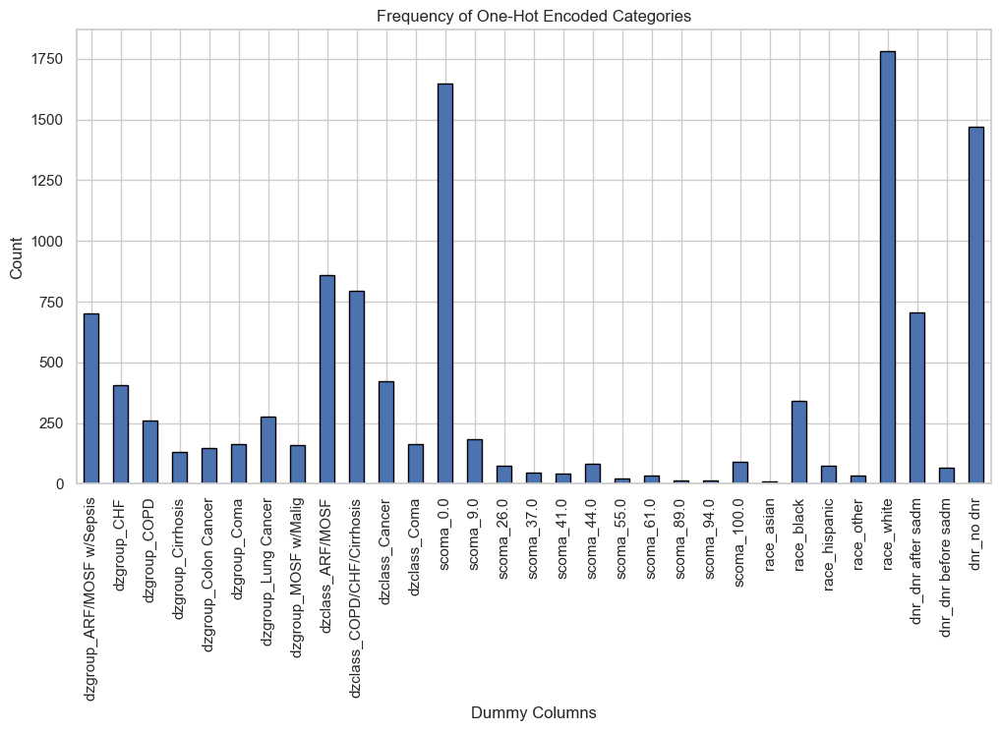

In [ ]:
# Count how many 1's in each dummy column
dummy_counts = X_test[dummy_cols].sum()

plt.figure(figsize=(12, 6))
dummy_counts.plot(kind="bar", edgecolor="black")
plt.title("Frequency of One-Hot Encoded Categories")
plt.ylabel("Count")
plt.xlabel("Dummy Columns")
plt.xticks(rotation=90)
plt.show()

### **14.5.4. Data Transformation**
#### **Transformation on Training Data**
##### **Fixing Skewness**

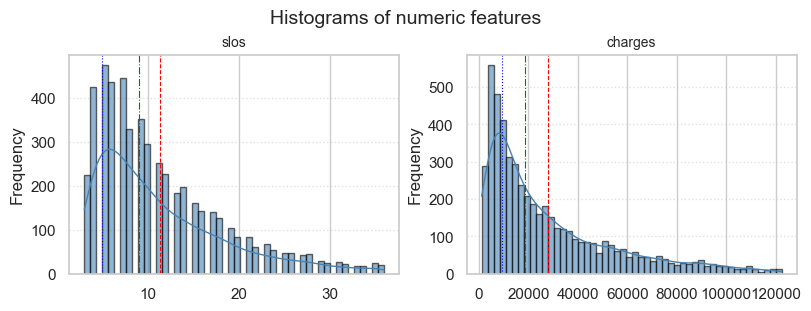

In [ ]:
plot_hist_grid(df_pp, ['slos','charges'], bins=50, n_cols=2)

In [ ]:
# Copy to avoid messing up the original df_clean
df_skewfix = df_pp.copy()

In [ ]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    df_pp[col] = np.cbrt(df_pp[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','charges']:
    # Add a small constant and handle potential negative values before log
    df_pp[col] = np.log1p(df_pp[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
df_pp.replace([np.inf, -np.inf], np.nan, inplace=True)

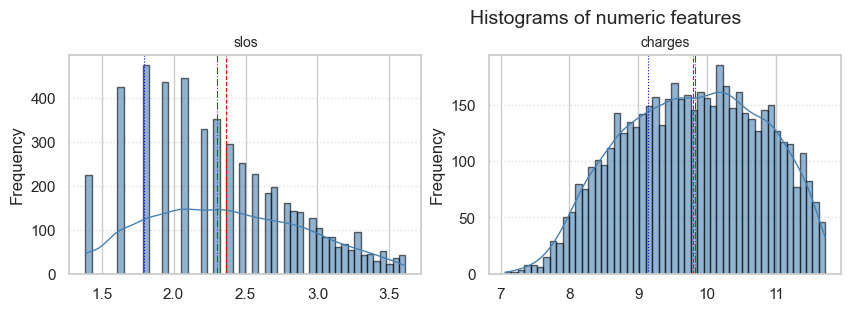

slos       0
charges    0
dtype: int64

In [ ]:
# Check histograms again
plot_hist_grid(df_pp, ['slos','charges'], bins=50, n_cols=3)
# Check missing values in transformed columns
check_cols = ['slos','charges']
df_pp[check_cols].isnull().sum()

##### **Standardization**

In [ ]:
cols_to_standardize = ['slos']
df_std = df_pp[cols_to_standardize].copy()

In [ ]:
from sklearn.preprocessing import StandardScaler

# create scaler
scaler = StandardScaler()

# fit + transform only the selected columns
df_std[cols_to_standardize] = scaler.fit_transform(df_std[cols_to_standardize])

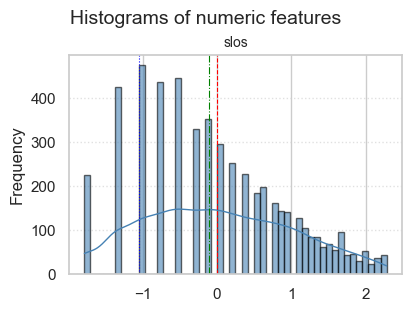

slos    0
dtype: int64

In [ ]:
# Check histograms again
plot_hist_grid(df_std, ['slos'], bins=50, n_cols=1)
# Check missing values in transformed columns
check_cols = ['slos']
df_std[check_cols].isnull().sum()

In [ ]:
print(df_std.head())
print(df_std.shape)

          slos
4600  0.222549
7027 -0.518145
3094  1.634995
3655  0.504148
360   0.222549
(5224, 1)


In [ ]:
df_pp[cols_to_standardize] = df_std[cols_to_standardize]

#### **Transformation on Testing Data**
##### **Fixing Skewness**

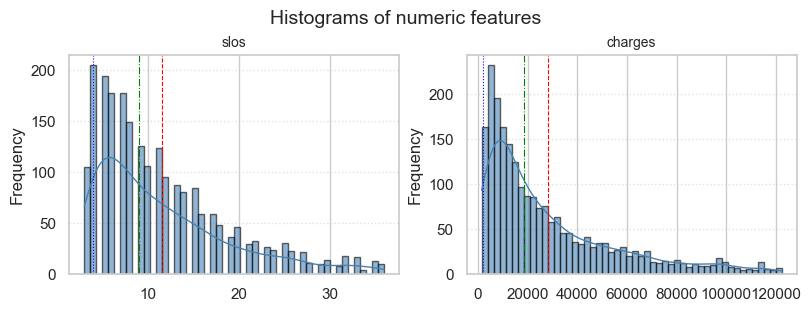

In [ ]:
plot_hist_grid(test_df, ['slos','charges'], bins=50, n_cols=2)

In [ ]:
dft_skewfix = test_df.copy()

In [ ]:
# Apply cube root transform
for col in []:
    # Handle potential negative values before cube root
    dft_skewfix[col] = np.cbrt(dft_skewfix[col].clip(lower=0))   # cube root

# Apply log transform (add +1 to avoid log(0) errors)
for col in ['slos','charges']:
    # Add a small constant and handle potential negative values before log
    dft_skewfix[col] = np.log1p(dft_skewfix[col].clip(lower=0))  # log(1+x)

# Replace infinite values with NaN
dft_skewfix.replace([np.inf, -np.inf], np.nan, inplace=True)

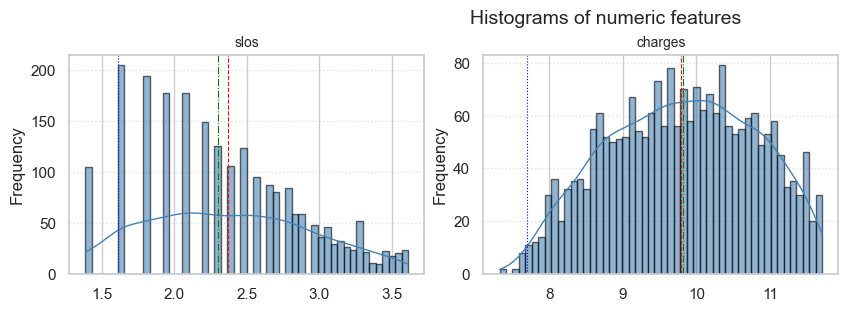

          slos  hospdead            dzgroup             dzclass  num.co  \
2949  1.609438         0  ARF/MOSF w/Sepsis            ARF/MOSF       5   
7541  3.496508         1                CHF  COPD/CHF/Cirrhosis       4   
2778  3.583519         0  ARF/MOSF w/Sepsis            ARF/MOSF       2   
6939  1.945910         0               COPD  COPD/CHF/Cirrhosis       4   
8030  1.791759         0        Lung Cancer              Cancer       1   

      scoma   race  diabetes  dementia          ca             dnr  \
2949   26.0  other         0         0          no  dnr after sadm   
7541   37.0  white         1         0          no          no dnr   
2778    0.0  white         0         0          no          no dnr   
6939    0.0  white         0         0          no          no dnr   
8030    0.0  white         0         0  metastatic          no dnr   

                    sfdm2    charges  
2949     <2 mo. follow-up   9.002701  
7541     <2 mo. follow-up  11.024155  
2778  no(M2

In [ ]:
# Check histograms again
plot_hist_grid(dft_skewfix, ['slos','charges'], bins=50, n_cols=3)
# Check missing values in transformed columns
check_cols = ['slos','charges']
dft_skewfix[check_cols].isnull().sum()

print(dft_skewfix.head())
print(dft_skewfix.shape)

In [ ]:
X_test[['slos']] = dft_skewfix[['slos']]
y_test[['charges']] = dft_skewfix[['charges']]

##### **Standardization**

In [ ]:
dft_std = X_test[cols_to_standardize].copy()

In [ ]:
dft_std[cols_to_standardize] = scaler.transform(dft_std[cols_to_standardize])

print(dft_std.head())
print(dft_std.shape)

          slos
2949 -1.376736
7541  2.070518
2778  2.229469
6939 -0.762077
8030 -1.043676
(2240, 1)


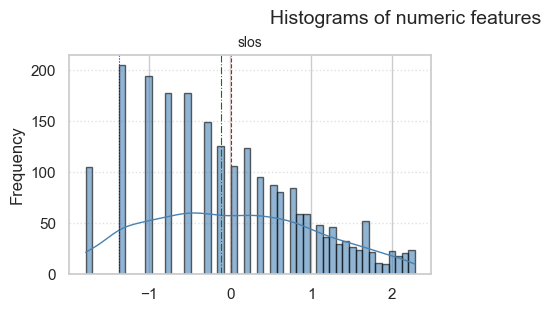

slos    0
dtype: int64

In [ ]:
# Check histograms again
plot_hist_grid(dft_std, ['slos'], bins=50, n_cols=2)
# Check missing values in transformed columns
check_cols = ['slos']
dft_std[check_cols].isnull().sum()

In [ ]:
X_test[['slos']] = dft_std[['slos']]

## **14.5.5. Model construction**

In [ ]:
RegModel = LinearRegression()
# Or you can find best hyperparameters using GridSearchCV
# Printing all the parameters of Linear regression
targets_vars = ['charges']

dummy_cols = [col for col in df_pp.columns if re.match(r'^(dzgroup|dzclass|scoma|race|dnr)_', col)]

predictors_var = ['slos', 'hospdead',
                  'num.co', 'diabetes', 'dementia', 'ca', 'sfdm2'] + dummy_cols


X_train=df_pp[predictors_var].values
y_train=df_pp[targets_vars].values

X_test=X_test[predictors_var].values
y_test=y_test[targets_vars].values


print(RegModel)

LinearRegression()


In [ ]:
LREG=RegModel.fit(X_train,y_train)

In [ ]:
# Printing some sample values of prediction
print("Training result prediction")
TrainingPrediction_array = LREG.predict(X_train)
TrainingPrediction=pd.DataFrame(TrainingPrediction_array, columns=['Predictedcharges']) # Convert to DataFrame
TrainingDataResults=pd.DataFrame(data=X_train, columns=predictors_var)
TrainingDataResults['charges']=y_train
TrainingDataResults['Predictedcharges']=TrainingPrediction['Predictedcharges'] # Assign from the DataFrame

# Printing sample prediction values
print(TrainingDataResults.head())

Training result prediction
       slos hospdead num.co diabetes dementia ca sfdm2  \
0  0.222549        0      0        0        0  0     1   
1 -0.518145        1      2        0        0  0     0   
2  1.634995        1      2        0        0  0     0   
3  0.504148        0      1        0        0  2     0   
4  0.222549        0      1        0        0  0     1   

  dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF dzgroup_COPD  ... race_asian  \
0                      True       False        False  ...      False   
1                     False       False        False  ...      False   
2                      True       False        False  ...      False   
3                     False       False        False  ...      False   
4                     False        True        False  ...      False   

  race_black race_hispanic race_other race_white dnr_dnr after sadm  \
0      False         False      False       True              False   
1      False         False      False       True 

In [ ]:
TrainingDataResults['charges'] = np.expm1(TrainingDataResults['charges'])
TrainingDataResults['Predictedcharges'] = np.expm1(TrainingDataResults['Predictedcharges'])

print(TrainingDataResults[['charges', 'Predictedcharges'
                           ]].head())

     charges  Predictedcharges
0  30684.000      28403.692405
1  51614.000      24444.200178
2  87620.000     123608.526046
3  11222.547      17461.083749
4  25441.000      15164.138565


In [ ]:
LREG.coef_

array([[ 5.84202282e-01,  6.27119502e-01, -3.29173707e-02,
        -3.05392861e-02, -2.50408803e-01, -4.62613470e-02,
        -3.30885831e-02,  1.30680827e-01, -5.12431678e-02,
        -7.71438625e-02, -6.28400148e-03, -7.05629661e-03,
        -4.69783182e-04, -1.35845570e-01,  1.47361855e-01,
         2.78042682e-01, -1.34671032e-01, -1.42901867e-01,
        -4.69783182e-04, -1.42845267e-01, -1.64021787e-01,
         6.30522201e-02,  1.01918508e-01,  5.21521973e-02,
         9.89904016e-02, -5.66085081e-02,  1.22234795e-01,
        -1.52226011e-01,  6.41501826e-02,  1.32032684e-02,
         3.16086216e-01, -2.34131410e-01, -1.07245914e-02,
         1.24956924e-01, -1.96187138e-01,  1.92203834e-02,
        -1.82391976e-01,  1.63171593e-01]])

In [ ]:
LREG.intercept_

array([9.92452162])

In [ ]:
LREG.n_features_in_

38

In [ ]:
# Printing some sample values of prediction
print("Testing result prediction")
TestingPrediction = LREG.predict(X_test)
TestingDataResults = pd.DataFrame(data=X_test, columns=predictors_var)
TestingDataResults['charges'] = y_test
TestingDataResults['Predictedcharges'] = TestingPrediction  # No rounding, keep decimals

# Printing sample prediction values
print(TestingDataResults.head())

Testing result prediction
       slos hospdead num.co diabetes dementia ca sfdm2  \
0 -1.376736        0      5        0        0  0     0   
1  2.070518        1      4        1        0  0     0   
2  2.229469        0      2        0        0  0     1   
3 -0.762077        0      4        0        0  0     1   
4 -1.043676        0      1        0        0  2     1   

  dzgroup_ARF/MOSF w/Sepsis dzgroup_CHF dzgroup_COPD  ... race_asian  \
0                      True       False        False  ...      False   
1                     False        True        False  ...      False   
2                      True       False        False  ...      False   
3                     False       False         True  ...      False   
4                     False       False        False  ...      False   

  race_black race_hispanic race_other race_white dnr_dnr after sadm  \
0      False         False       True      False               True   
1      False         False      False       True  

In [ ]:
TestingDataResults['charges'] = np.expm1(TestingDataResults['charges'])
TestingDataResults['Predictedcharges'] = np.expm1(TestingDataResults['Predictedcharges'])

print(TestingDataResults[['charges', 'Predictedcharges'
                           ]].head())

   charges  Predictedcharges
0   8124.0      14350.293307
1  61337.0      96955.973692
2  72087.0      85897.497372
3   7148.0       7530.736567
4   3055.0       6011.928051


In [ ]:
from sklearn import metrics
# Measuring Goodness of fit in Training data by R square
print('R2 Value of training set:',metrics.r2_score(y_train, LREG.predict(X_train)))
print('R2 Value of testing set:',metrics.r2_score(y_test, LREG.predict(X_test))) # Fixed: Removed [predictors_var]

R2 Value of training set: 0.672835742200238
R2 Value of testing set: 0.6760980759422464


In [ ]:
#Measuring Goodness of fit in Training data by MAPE
TrainingDataResults['APE']=100 * ((abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))/TrainingDataResults['charges'])
MAPE_training=np.mean(TrainingDataResults['APE'])
RMSE_training = np.sqrt(np.mean((TrainingDataResults['charges']-TrainingDataResults['Predictedcharges'])**2))
MAE_training = np.mean(abs(TrainingDataResults['charges']-TrainingDataResults['Predictedcharges']))

In [ ]:
print('MAPE on training data:', MAPE_training)
print('RMSE on training data:', RMSE_training)
print('MAE on training data:', MAE_training)
print('% difference between MAE and RMSE',(RMSE_training-MAE_training)*100/MAE_training)
print('Accuracy on training data:', 100-MAPE_training)

MAPE on training data: 48.824594128261765
RMSE on training data: 19271.14860163568
MAE on training data: 11843.461626715667
% difference between MAE and RMSE 62.71550674141711
Accuracy on training data: 51.175405871738235


In [ ]:
TestingDataResults['APE']=100 * ((abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))/TestingDataResults['charges'])
MAPE_testing=np.mean(TestingDataResults['APE'])
RMSE_testing = np.sqrt(np.mean((TestingDataResults['charges']-TestingDataResults['Predictedcharges'])**2))
MAE_testing = np.mean(abs(TestingDataResults['charges']-TestingDataResults['Predictedcharges']))

In [ ]:
print('MAPE on test data:', MAPE_testing)
print('RMSE on test data:', RMSE_testing)
print('MAPE on test data:', MAPE_testing)
print('% difference between MAE and RMSE',(RMSE_testing-MAE_testing)*100/MAE_testing)
print('Accuracy on test data:', 100-MAPE_testing)

MAPE on test data: 48.97001267083325
RMSE on test data: 19357.462128203697
MAPE on test data: 48.97001267083325
% difference between MAE and RMSE 62.91513020467251
Accuracy on test data: 51.02998732916675


<Axes: title={'center': 'Actual vs Predected on training'}>

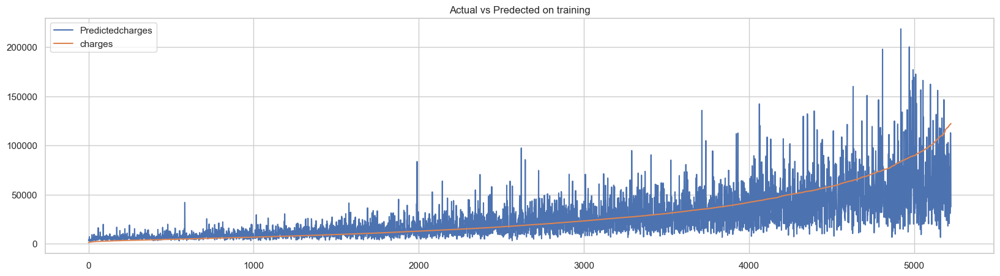

In [ ]:
(TrainingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Actual vs Predected on training")

<Axes: title={'center': 'Actual vs Predected on testing'}>

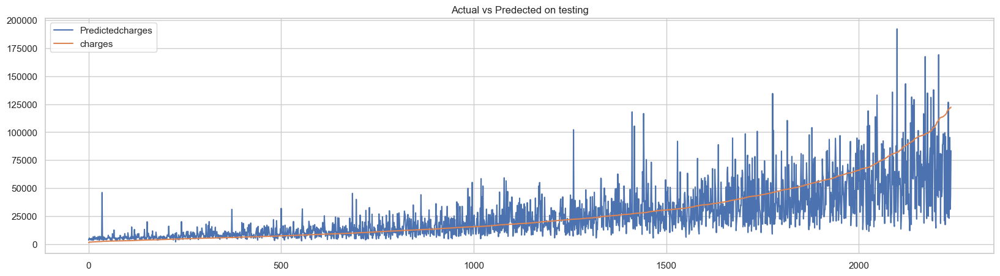

In [ ]:
(TestingDataResults[['Predictedcharges','charges']].sort_values(by="charges").reset_index(drop=True)).plot(kind="line",figsize = (20,5),title="Actual vs Predected on testing")

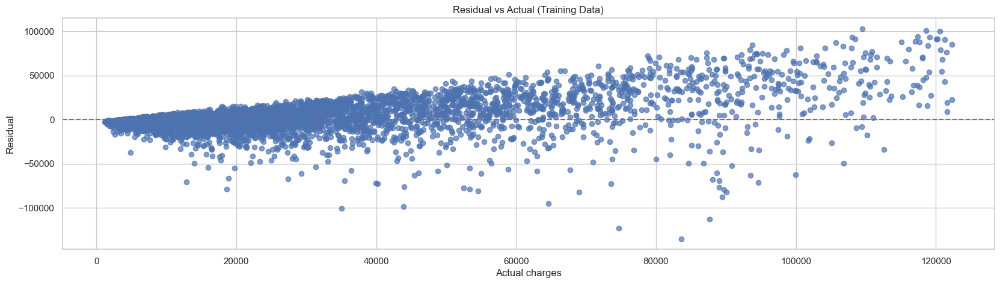

In [ ]:
Training_residual = TrainingDataResults['charges'] - TrainingDataResults['Predictedcharges']

# สร้าง scatter plot เพื่อแสดงความสัมพันธ์ระหว่าง Training_residual กับค่าจริง
plt.figure(figsize=(20, 5))
plt.scatter(TrainingDataResults['charges'], Training_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')  # เส้นแกน y=0 เพื่อให้เห็น Training_residual ที่ศูนย์
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()

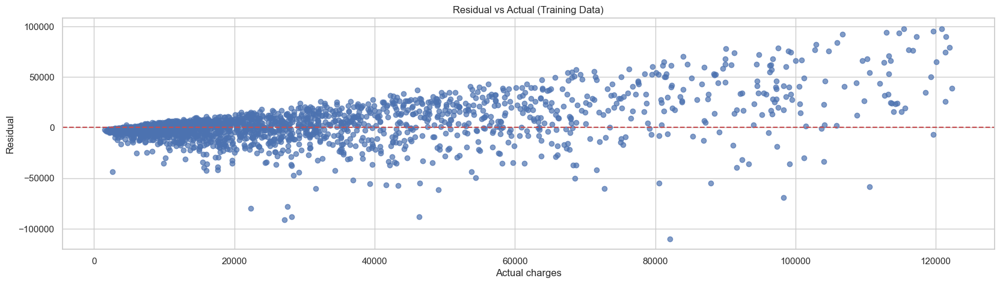

In [ ]:
Testing_residual = TestingDataResults['charges'] - TestingDataResults['Predictedcharges']

# สร้าง scatter plot เพื่อแสดงความสัมพันธ์ระหว่าง Testing_residual กับค่าจริง
plt.figure(figsize=(20, 5))
plt.scatter(TestingDataResults['charges'], Testing_residual, alpha=0.7)
plt.axhline(y=0, color='r', linestyle='--')  # เส้นแกน y=0 เพื่อให้เห็น Testing_residual ที่ศูนย์
plt.title('Residual vs Actual (Training Data)')
plt.xlabel('Actual charges')
plt.ylabel('Residual')
plt.show()